# The first half of this notebook is the EDA which has already been submitted for review

In [2]:
# import packages needed for EDA analysis of spotify datasets taken from Kaggle
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials



Import a dataset from Kaggle containing 43000 spotify songs INCLUDING Genre tags (although somewhat limited and biased i.e. no rock, but tons of trap and hip hop categories)

In [2]:
genre_df = pd.read_csv('genres_v2.csv', low_memory= False)

In [3]:
genre_df.genre.unique() # the genres including in the kaggle dataset

array(['Dark Trap', 'Underground Rap', 'Trap Metal', 'Emo', 'Rap', 'RnB',
       'Pop', 'Hiphop', 'techhouse', 'techno', 'trance', 'psytrance',
       'trap', 'dnb', 'hardstyle'], dtype=object)

In [4]:
genre_df.loc[genre_df['genre'] == 'Emo']

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title
12409,0.210,0.940,9,-3.427,1,0.1230,0.00602,0.000000,0.2690,0.255,...,7lRlq939cDG4SzWOF4VAnd,spotify:track:7lRlq939cDG4SzWOF4VAnd,https://api.spotify.com/v1/tracks/7lRlq939cDG4...,https://api.spotify.com/v1/audio-analysis/7lRl...,186480,4,Emo,I'm Not Okay (I Promise),NaN,NaN
12410,0.634,0.886,2,-3.466,1,0.0517,0.02910,0.000000,0.3420,0.922,...,5kD9T7GForh8LnRz5ClbL8,spotify:track:5kD9T7GForh8LnRz5ClbL8,https://api.spotify.com/v1/tracks/5kD9T7GForh8...,https://api.spotify.com/v1/audio-analysis/5kD9...,168253,4,Emo,The Middle,NaN,NaN
12411,0.409,0.860,1,-4.424,0,0.0451,0.04070,0.000000,0.0711,0.536,...,5tDQ2Ep4MXcgjeLaZcwW6g,spotify:track:5tDQ2Ep4MXcgjeLaZcwW6g,https://api.spotify.com/v1/tracks/5tDQ2Ep4MXcg...,https://api.spotify.com/v1/audio-analysis/5tDQ...,211547,4,Emo,Cute Without The 'E' (Cut From The Team),NaN,NaN
12412,0.541,0.904,7,-3.001,1,0.0435,0.00143,0.000000,0.1930,0.541,...,5jZ1Z2GFTf2gwmFc3qiUxs,spotify:track:5jZ1Z2GFTf2gwmFc3qiUxs,https://api.spotify.com/v1/tracks/5jZ1Z2GFTf2g...,https://api.spotify.com/v1/audio-analysis/5jZ1...,208693,4,Emo,The Taste of Ink,NaN,NaN
12413,0.494,0.842,7,-4.784,1,0.0843,0.00579,0.000000,0.1220,0.574,...,2TfSHkHiFO4gRztVIkggkE,spotify:track:2TfSHkHiFO4gRztVIkggkE,https://api.spotify.com/v1/tracks/2TfSHkHiFO4g...,https://api.spotify.com/v1/audio-analysis/2TfS...,229093,4,Emo,"Sugar, We're Goin Down",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14084,0.522,0.470,8,-5.120,0,0.1170,0.46500,0.000000,0.1430,0.660,...,5FndsjKGPimY2JzuEgusHf,spotify:track:5FndsjKGPimY2JzuEgusHf,https://api.spotify.com/v1/tracks/5FndsjKGPimY...,https://api.spotify.com/v1/audio-analysis/5Fnd...,196047,3,Emo,Blijf Met Je,NaN,NaN
14085,0.597,0.511,1,-10.155,1,0.5070,0.34500,0.000003,0.1270,0.249,...,45mGGL3xOLgf6mmpgkrxhN,spotify:track:45mGGL3xOLgf6mmpgkrxhN,https://api.spotify.com/v1/tracks/45mGGL3xOLgf...,https://api.spotify.com/v1/audio-analysis/45mG...,134056,4,Emo,Hoofdstuk34,NaN,NaN
14086,0.649,0.518,6,-8.056,1,0.1930,0.45400,0.000000,0.2380,0.509,...,1uIgWhqNX4MQoUUJWd6XD3,spotify:track:1uIgWhqNX4MQoUUJWd6XD3,https://api.spotify.com/v1/tracks/1uIgWhqNX4MQ...,https://api.spotify.com/v1/audio-analysis/1uIg...,174961,4,Emo,Voicemail,NaN,NaN
14087,0.486,0.539,11,-10.896,0,0.1070,0.06760,0.000016,0.0899,0.522,...,5WvzgUxit01lhUCJGx1C9W,spotify:track:5WvzgUxit01lhUCJGx1C9W,https://api.spotify.com/v1/tracks/5WvzgUxit01l...,https://api.spotify.com/v1/audio-analysis/5Wvz...,165687,4,Emo,Alles of niets,NaN,NaN


Following script pulls artist for all tracks in the genre dataset using URI tag and the spotipy API (oddly this dataset did not have artist data but had everything else)

In [5]:
uri = list(genre_df.track_href) #create list of URI tags for tracks in genre df

In [6]:
cid = '73e0d367915e4437b028a8a21e0f27db'
secret = 'c2af8971ebd242ceabcdacdb2230fa6e'
#client_credentials_manager = SpotifyClientCredentials(client_id=cid, client_secret=secret)
spotify = spotipy.Spotify(client_credentials_manager=SpotifyClientCredentials(client_id=cid, client_secret=secret))

In [11]:
# script pulls artist and URI (redundant but used as an ID to merge datasets later) from spotify. 
#Spotify allow 50 queires at a time per API call so for loop iterates through URI list 50 at a time
# artist name and URI results are saved to empty lists
# THIS CODE TAKES AWHILE TO RUN AND SHOULD RESULTS SHOULD BE SAVED AS CSV SO IT DOESNT NEED TO BE RUN OFTEN

artist_name = []
uri_id = []
for i in range(0,42305,50):
    results2 = spotify.tracks(uri[i:(i+50)])
    for t in range(1,len(results2['tracks'])):
            artist_name.append(results2['tracks'][t]['artists'][0]['name'])
            uri_id.append(results2['tracks'][t]['uri'])




Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD9q343XFRKx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7pgJBLVz5VmnL7uGHmRj6p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vSWgAlfpye0WCGeNmuNhy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VSXnJqQkwuH2ei1nOQ1nu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4jCeguq9rMTlbMmPHuO7S3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fsypiJHyWmeINsOLC1cos
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0XfQbq7DaMOmVXgQ71eA6E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LLeuNBWPOg3XA73yab3PT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37gqBnUAZe8BY8WR56kDNk
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ae2GdeXS5Tvo5RvdNwgaz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tUXZgLbOCvRJ9FBlairoU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7m1oRKYiZCfuKXRMWGefWR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AADsJz09BwnKW4yYFQwXU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zjdL4aLh3D3wOKeRkZSL6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1e0HLyx0SlmAhwTm2un9ft
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SbKWYPENsANEIIgnCK45e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1k31A67B0r2PDytoPR283x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vNYfMAh3bvHGmRxve1YAg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Cye3UbCA6UNuDykdCf3AB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/35su7ZktjYPHSIUSKlr7XD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zoYSZrDb3EUPWlDi2OwAC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44X2fcZQhyywsHTmvbS5zY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yZBKFxnmoHLJFhAy2BBlo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CHp6dRZTeFAu4bSOxfH7Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46eK1kembooWblMi7M7yLM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mx0eNjjZUyOzfY3I4P9HD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lt8N5nSY1EaiyeDRAIwcW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4gmmRb6bZJffOOiww1JGTO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7gHZGXSJzM29WA384suYY2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7wBJfHzpfI3032CSD7CE2m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JuKanDBTFLx1rVuypB8tQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0joQFwiBKmi6X1Iq5R1ubH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0et3KfGLKitEvAnvzIa4X0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0M52bTppxI3QQxan8ftIsY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1u6rWB9oU2ngLcidsACqsM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6PHbWsTTlmQKF9i9VC1KFv
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0NXeZp31dd0cJ9t8FdKsTg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07o0lU9VQXJ88OxLTid8kz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76b6nZKY6wKpyfmmLRlMUX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7BJ33p5i27eytzaxmDZOc7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rZjP7Y7cOSRLuo6plS1bP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/06g6RbAQad8bIClfNbBKRJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LymrmdPzZttyG6fNQCuym
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6d41BYMdROenKskBiBZbsZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fBIsVBzbLYuwfZCgQGgeX
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Cmashi3O9I8my5NnbQgqe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/23UZjXvswYyuiauJ5cIEfe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UTYspE7l3wrQXdTNG1siQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Ga8pDA2v2b9MyiTfH1BNF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Aj6z0v554lTWSygFy6hFk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xNqBwrTPeQfPIQf8Z5xVY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3N78ZnOP9XQISijYOseytM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KyhkMvRHePqnlJZjD06sm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZZzBOjX0tYDZbOTF2vhIq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76GKbKyaTonMpyIa9mCXmX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3zuRGDCXGIzAp4S8wuOmNm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2scbtpMLqy7zyNzey6ABv4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Y0Ltp8emwEl0XgbxxNlwv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1dixBgLyv5m5iZbnix91Wu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41i4IJmrLoenQAfIT7Bng1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6b5aOaVVvaABAorHCbi6dU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XKa4VMFriRm30shwMzdrM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kSIn4O6pWXcW7prq0kO4C
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22gKxX5eloBO6mPV9Bm77D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GgeUuvzchp2ODhdNjnDSr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Kr7QGT13qHpZH4IqnuaUc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BZtlQ9NawYOb83l4KaRLx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Fr4EjhkpR4N3fbqYBnGGK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/28BOncKIWVgcg9DFgldcPe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Ysq5wZM9uFeH2lKOBVlah
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6LisUkIP1m3se2oBPkmmHD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18khWfihjYxrwGv6JwiO9x
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5dv1VQpsAbUv8xf8MrhoqA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2bkKnaLTMCghmjlcPBoYWd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XUPamXY01FS0wga8zapK3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WJHiN1XQvluwUkElowOJC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3rUQeV1Iv3Gv7qjckhaxMQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XhfGLHJ08sNFz56Ii5mab
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3gGcLVDA1ErAM4dwo940TV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29tnYVVuDm65lUwysGy6T5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7FiVoxzWM9jngxxz7j3ihs
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qaDrI1u8chhvYkJ6f29Ct
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Rfl8EzU24zzfdFhZtBYrb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4qRSms2jxKryXFAAutaVHE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/789v2kOLYbU6P4N0F0KoEj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5t2bXNmpMlU4pzVBB1H209
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1btHCGleerW3pdYNSj14gF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5u7yESSeNVP8kjJyKCvFDX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bm75szrFJoitL1eaozE8U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SHTDx3mTHlFZ5Z3zBEkfj
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XT9ve5aJap36XXcJf3sLP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DlPK0TCjBup0FaUz2Mxp9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4g9e5hnElJZSOoJBRLrq1I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JmEymqQwLXvCg3sJ7gz0n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/05mdnmrjimCkk6geWvhY9G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29lBnEYOz0rJKHvUnAKYaf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2C722TdzWRJNZGj0fOwShb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0KphQ9U5ss7war2Aajt0zL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fEhzjjgdwrxZZDVh6Tlut
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Okhidaj0Kyyh47jOHiBaL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BiyWnYuBiqRzatDioNK1c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DtuEwPdlbo7RTWq66IxMy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3YipGKsVarxpiewbdMqgMV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7GS3nv5rpmDXDJ2h8GdAsr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4er9uGBNOtaWzR5kQleQBo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SS1Ysd7mEEpMziDBCX2Xr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NdBAtsCYuOaRnYhbD7jAv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/75BQL2YpjU3pOypXwHOlQw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fG01hFiFGXZKRMHXsBlyf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kgV2ff5SyUhIxeOuDk5FF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3rrGk2y5PRCS7q5GDhwkxs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10Wv7uvDoULWJlKZ6q1nwr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3yCkb5GtTuJY8rbv98hR8S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HjQLfDiXqyaglXkzB7aYL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Q7mb1K0OF3RkJGy2Zs5fN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fhoGi2a8os5lcLzT4glaw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4eyXx42GSocXSSRY9vPfzP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yUq6fBiGcdq0QWRe4oJtA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7k9OlLKV0pPeKQCEYfSCqv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56Ok5yIOvdWwlQavSH6esw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AFWx8JqsslV2MsWhpGjnR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2iDyRBAJ4PzLzorljWBfNS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uyep1AMQSbq7TfGQZ0511
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rQCG2Hqm1VtQIdCA53TZy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0KqCngeraml7SUTfwq4h1D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/58orasu4acwvl06LdyRCyH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oKILyaOfPZL1L3Cin28TB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QQjQ1V1ic4EQjVlXRTmTV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5h09OrM368tldq3KLHpYFM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wcWvS93BccuPs82d4Cf8b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3LybI9SuXKP6idiFYOsdzE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MLPJ9nla4cFBLr0VwSsIB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59Oo0sxatOytxjlTW8O5ua
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0omk9UjtDVSJs9AdHnMRlJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3er7NHWboyZoPFwFu1VZuq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1wTlXpY3HReTsVR2M9bINL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/77P0uQtLdrw80B7neg4RBa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cmSnAd6gizPfWOtwVY45c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QdJ8cWC5KDeOk5MxF7zcX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DxKAUphFlUG7JsAStBWvV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3rpeu79MYV2uEYK76LKYtL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bMzfUQg6LreG8BQDazQy7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MjNilJCVKJq0LfFvo5jWJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/48HwLYhnFHRg4r77Ihai3N
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zQSBgYf5G6qjiUUELADsD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cqCaNSIN8Mt8bipnLH95o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5yAGvb9jyhmwQDNJrju9gq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4sQoJeazQXAHw3rv6yDevF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YkOpi22nrGAspbEBX5aU8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cwLPhuE9f8i0nxqC6DR5u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5qg3CWeU0mhdhkPJ1evLxC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wfdzlswBJeFd4L0jSrysc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nQC28WpPX2IDZJ9PafNB6
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3QTVsXdmkaVpCCFNS9hBav
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/310YHyec9UxRfn30XRje5J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YaBgvHKQmrlUrJ5tBfyd1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BY5fKganceXe196jEJZWb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3TNwTBnZn7Q6ZVhyV7uFmv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qTTWAzCK5xjgUrjcxykqU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RAjEKXmiyPLQuPe2fIvlT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4OozkslPi3nwvgBzkU1KPR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/495T3rrTtGF4FRHHvldWjh
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6tmGn6eceVZPlPw1iFCou7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ZSx8uBPD30XosprTCSHXs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OEnY5jdjIZcvl4zMG5DDj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6FxKi0jjol5jGHwB6gKsIf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jePnaNKWIp5AZKSWH7vT0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0RmA4aqXxeznvEHLxVTfVg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79bRKSHvXihtxJGOf2zgf6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7M6wUOOqbg1P3AxYPXsL9W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0a58S0ERta0i8nAUuGoMv0
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/412BEzTvETYg8XhekvF6Z8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0uREnHrI1ZrpfwfsnMKOUz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00LR5YpTq2VbEcIzyCzBfa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Wk8mym2Gv0NDpMkKA5aWk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71JKQI2DlJWxJAKkwSfucL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2xCkbmoETP0O0ssyfo0LdJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2x3RVpRNxKiN3hYUEzenAz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1W9jTpU1YGwP7X61Zc8hOm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rAQspekSql7kfcfEuZ1YM
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4op7F6gOOTcLIk52QqhFS3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Hiidyv2886H8qj3f9JCEp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rFaYm6GojPdFxQzMwItMu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6wOc1Qz3BYTpol9X3tlmQn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6BKu0kesY5FWVLOwg4LhdH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7oBW80497A8axagr4aC9U6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jWUHlUXVCZ1oDNoqPuySX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59fqSD7qydA8PQBStiLZCE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nEwhYztjl3bmfjkmBAyVL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1q1ZSfoQMW7pfid8cLaWcO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xMkIUzR4Dy2ftBAUgYBK4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TULAh8D3yJQE3TGoOYU9I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BzHgggJpPmbDNCdwDZno3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4jYTR0gnInhNJGbTC8YcSb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2pQjrKIq9JPLKYgJlgH4nl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TBG2B3jJukN4lr5LOwyJH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YR4mwHmGXsI1xB0o0Bu0j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ohGDJH1ChPmIFzd8H1K6n
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HxLroXIhHkDbzviXdNSUS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0da7UmZaaae3mtpbcFg5rG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1IqMvGiDB5Irui7eoCYpUJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4v0e1hCAQ65xyJCinBN0wY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2WYs5LxOZfEyURXu7V0O1a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7KVBqGLGhrEejVokzYd8vF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2cK98Bak5Q7iiTz8aajq72
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3qfpBtLqYTzoz73J7UsjAp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GCJrgb9GFEDNyhhuoRPSa
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XDOGk0XzrBIZboUMvfRNr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5R8m5aQpABYQjVMlvmQSr6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37IOMy7QvH4sjvctKVld88
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4k1EviPI4gZmcrRgUw7Zxf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34PhB0kHT00utubP3aTau8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4TphZMSa65IcqDxREGi3s6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36b12SAzJFSRjSCKrI7yIi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lVLuu0k5LKLB5Zmqg12iH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CFWD1hc6hJ1B6zlCyE8ZO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iIzwqG5UxPYwTYUUK4pzU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Bxy3KpK4ygO2X9QAiOQ3W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ktxr00GpTtbMNeBjNeY8D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lkE1M0KELl6tom3CvvSms
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bN1xfvn1fB0mhKcdCK4un
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0YrSjThouT5usIIXViK1WV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xGYY2cXhxJF6pyU1LnM41
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DRQlKDHXJJli8oYVh3VCX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CS41pvRBhejuFs4m5nwtr
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69X0MSpeWgDjUJubquMkJL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32Ts37hxWyPWhMXUeZGz9a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3CCQ2NMGf0x5uT5UqY2KHY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nAZ5wCZx5bvVkPHy1sUCZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SqSBytXMVQqV56PD9vWC6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6gTECpkjwbwvB2WD0zjWpW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OBvOZ9A1R5bPn2xnWkXzo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5wujBwqG7INdStqGd4tRMX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Qzn54Dprpka1wDTKbjUDl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cjfot07KUWqZSjGDoT1uN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Sm4k5FJdn0pEB95hcDeEx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0rqU7slGJ8rq2UdOe5y0zH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zkLlx4bTeeyUyzs1L7gV4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fCeXjoRExPP2qwSBh2aST
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6WgJPuQc1BicC4dkfKPDza
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1BCBBO8VUEFOb6RBct4XDp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QbJuh9oZX5yiZ1BBkWgnR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jKAeiFscbSQqzHGrIQhUI
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1tcmn1NIctM1HIKFnmLouC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Bli03kqWMr7hk7bAGnZKo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tauHfaMUFMZBuRLgASnqO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6g37VtYoLVlEkjQpamW1xq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/43ZyHQITOjhciSUUNPVRHc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2I2PJglZVBvvEIf1NKfUZA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GC39eRKcLeYTS3jMIAJOj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cXe7l3Y5Wv2ZMGDOsxfyX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fEl5TPKRJAsuP6TqZ23hB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16T9dnh1yUsUMkzpqZOrDg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mFPvh4KQcnHK3wT5NoLwu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fdCURJWeim1ca2kSlh6Wb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4S8ytvmSnLufoh75ETA8qO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0U9jzArQYEeenaoQEYOcz1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EF5pYzkO18OxL9TWZRdSh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ut3hEn4pmVyKOSDmCP0Qh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0dMsMK6XLGiWmnO63yHZHw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6R0GRYk2vs2XuBVemYK5YZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rfswp5Qafssih52TfVeUl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wcUkxl66iPmTzHJy8dpCE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZfseXX84WDBDLcCATDmHC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3N93nz96IDBTocl8DI6Kr9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00G517WQ95QHIF4t2H1yWG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/05ONJirgfmdPyiJHGCtlCz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/48md80OCUuZqsaZAVjepI6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6EsD4Nftf5bXirZz4qydi3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ZOCmFKBFRQSFPgJtmPwlP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZLhZwDyIJfbiR1cXKD0oa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zcaRXtdsx5aP9pEkjatF6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0uhSrMl8tfS1APseIb97CW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6l91DRRRrLKA0d89UMSTFH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72WX9JYNAjGdm8gtTydpTJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UusfWUMMLEXLMc1ViNZoe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3DWjFSDEQ9IWz1mj449fB7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vdy1IIAoIvnsCw2VtGs8p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7HM0V2sTGUvy0UMEGGxZWm
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7L3Sf1a24SwikH2QTADkUB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6LJajfVgTG4q9HrL6BHTWd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nB9up0A9vUM5p5gttp84M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZgLM7JpaOsUBSQBlYIk28
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2IlzqlTambpyjThTOoP8LI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Ow784ahnFJQt86XNQiKbI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1z9ayFhM26Ed5TvsEZqoCc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18YjCNwwuuNZFLZHXQe31G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3897IXhviNTU37LrpDYuB5
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6IPEz83Ac62TEYhdzaodWl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AczYR0dyqtKlmLl72OoIC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55756PtWfxcTaSrNqR4KT3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/28Nx4B0HmR4BarzuRu1wgn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bhUywrgoZaEWXidXmx9bI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CDQpqpDFkbpHLHReZ3uuR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3P4RewkUI2M5KCEsdRwFOB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6M8lvThFcokC6O4jbiVb57
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/065w89dQkaW7UAyhEy8SZG
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GOGXozSEjBJNYiv4WVqyM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/692UQTtTqS4beVmGqZaAqw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6zL2omvnQ206XwPvXoMlx8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3LLThN8kxWS8rvstTacMdZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6iKJAUeHx0saIoZ8z69Wam
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55c0hKy37sEJpsQs0lSHlj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26bE28MknenbrYV9OFzJ6S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0NBAti3Wccforsw0m708we
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4vwRxp34m8TO3GCCG7o1Sl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Wdzi52wZtHB6tLfI855ON
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bKIXko2IX0y0yOG0dzlrk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1t4CqrYMLXMqYTUQqdoE8r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4id8jhbVDSICpV33EGqXqM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QBaH1j51Jyw4fMuZbQy1z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/30TumU4KOCrspF8vLe4TER
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HpHyynAbz3EK8Ln2hn8SZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cFyTlIetqCyKUUqsiux4z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TCMs0jIcDHbD56xt99Ogg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0DDab57NfJvOWfdIZ9SyKv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Jet2NwfY4he5JsuQePwov
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6smClyBJalKlng89kMpoRV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2k9yDrI1kTzMzNmmvDRyqs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Il5PmVevGuCCqqk0VRPgY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1j7CvoI7ptjriHD8Oex6VL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2dpFECMH8qS83G4g0nHHuu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1k6zOKdXlqG5f9UQmpnfSL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oaNXkCo90GKAj22cBk5ZO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71MSWl7oP4bMCFVBl4efoN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2L06SMhxgleQjbsnduDWF0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1S07DKWSYcLY6cMVYhwVI8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RydAyOeHWofDHuP9BnfCw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JvbmRQKnWjJ6D1B1xk2A6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5o3RSv1L5hHpa7SExu9vju
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5CLfIGUQRwirfW5cvVcTUw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0yqkk1iQKf4KLvgLjFj7hA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00mEb94K55arYua8RM3Tkh
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4BrOjd6eC8AgJB9uBSoqXg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6gbDaWpH6W9sKhv2VM5LVE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7x6KPuWEh3Pck5OhY1Z4Y1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3PK6wr9Yap1Q4t1Ucds4B5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5olIwlcomslnlP71MO2BCM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3y3983Ss6SAxZufx3oynNk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5LOSQBbY0iMQnE6vP7TkIq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2i4XrfGh8uxyAFHvuDTp8Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hHyMJfc82QwoYLDHWkT30
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kbaBlNyvK6g69ZSCS8N29
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YdAbiNJRWidegSOXQpphZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4wOzFudozM7R5ZOxFOKSGA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0sKpO7ihDFy24Zu4GDtNnQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Uy9iUEEt4qFh9JRAgYDvj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xg9HPHHCnZYDYKkJSG2Bm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cPPlBwVK3cB12AzCDayKT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1g0FsjLF61fejCvStp4Vjc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5AgeK2ceDRwKk8cUcUFHqY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pGvb5UpeF1vmpDvvyHdwu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TWwg4g97uxJDWh2vc7iks
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1kkzyqyDD7XghZAxf514Xw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6W3xeE5b0lAsZ2lPja0p9F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6bNwtXt4YDxH2nnPfjG6jx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ocO6xQjgDQxEonnX81kqF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JWNszYF4wThAuumnAhA1V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55WFe7r4j47wlJV0ASmQW8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Pcw9HmO5UjfU616ECJDWY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3yvhTg94Z9kxbVVKwJZzMe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uVkzrxGAVDHLWeRbACdEp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zCohXerS6aXHSVor15phs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vzN98SkG0KrL2XrPKmj4C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76KWATxe3WGGUVFeTaDVm2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6oi1LNaQpfUkruCyMO2LYG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HutR0IgWZfcFwIS9GLW8w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bn1d5ndaoNi2RarTIU1Rh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GPjbfYB1pJAew6SRj2pqy
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6isH6LQkocGhzd4S8DRWp0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0x9IksEijXlfucXxGcT6xa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25HLwPp2im6z5sjAOqZEnE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HSiMaxC6PhXpKY2ZqH0NJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pf0ojeaDLmXUQ0JI94P9H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QR3NZX4c0864ekWFKxQWI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jQRv8RBGBsTOQ6mAp1yMW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Azp8WMnlnuGirjd562inR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5xb8DcYjeCJ5YuOSGfokNU
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ILWB5yGgyGD5I52hHSsWU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cqWZkSohwFWVMrplZ9Iys
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7egkkLRvCTBqYuXr153kck
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Sn83NRA0nMRRhVJG5aGuu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7KPyhniD0jgfdP0H83Y9ZB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1oQshb0tV5ioW5ZTx9JH1H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/117f5L3wah716O5M6HCI02
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5K8ByFcJKfcJGYyE9kIDrd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ewgBpBQkGtoChL6LX1eLX
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4a3CU4lFJfbcUvJgiKMRV9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2F3TiRlqvXj97djVzZYqKK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2l2D6ahcY96tBITOeJEcNV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3eesPbpvAxZ8ZVXR7a1PbA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vpVH5mSVc6q9RicScd97M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3wn302w6ebgN6GoUC9dmYq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41TuczBXMFoEldih9zFN90
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17a50m6txHiwroxsiFPCbD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Ce2dgl4ki6nSIfDWXNm4y
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vj8WnBdih005tjGUOd6tp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wrRbRKbbOe62uHdnNbzk8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1olSRMzOEE5ckML6JNJPA1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3LmM0ja6iUvf54fIiy5E8L
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3B77mFfkX5TyyXCtvWRIBe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DHNyqH5YNkBVCZg8CCnbA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5HdOXrj2zYZYjofl0rDFKB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uEzlfb1AZ7xAmD4itYTo6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36ncF2SN4Och67K02kljQf
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CDnm5YhwMS7VHXiOTmAfs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ohNpRSLvQiZXKj7eBUtyt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LyDqdUWyW0lME8fT1J1Bl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6pd3Lo4m8k9ydJZoDCGbGJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36YXSRhAOijeCwzFu50cRn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KdgjsxpsxZyLvO4LK2kba
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Fsgp5Uc7rC8uHrMIXgjIK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NARcDJlpVq0eEc6RSaYPJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wRsc6kyXwfVdmhizcemK1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6iggFd5nbGNitvLmQcxgsn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Kk5vXE4zwbylQfhD9kfCv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SdUP1Ck0YKjl7vcUCYJtw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0N7TjsjIaP8nwqQrhfddir
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21ESjjlwHdhvzoEuMA3Y9Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FTX9kcvrDSy9dFa5CiGSl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MIBCvsxjZ67BIMGWY6XFY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mJjs2cYHqKo7L54qfTLO1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hIFzhJ2hy2hPlKWHzq9Tj
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ijZWkpXpQCksqthBibjXC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5c2BibSCGu5GUUjt1sZDnH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6EWrC23P3ZasH7cY2vxabe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46IsPPQjLoFpmrzmnBal26
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1CQ0TgjSbLe0wmI05aYjKD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/526HQ5aYZu4LhBTUerx0w5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3hKD79M0BDpsrOArNzxod7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vunKL0vV4lGyRzSbEj9wb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10ugMmxlkh8eLcvLgovDY9
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6BYAOt8naDf7gyUWIA6ir3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/74Kb10Z7Ts39qMl9XfJr2Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6VY29Tg28wt8rAWkgJDjBK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ab027ambdp9qvtBMGEZcu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7G9zJTNFu6lwYnAIPJBPlI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HJbmJq7nlx0r8DNwvI2PT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25MqP8IMiaiOJeB5pljjWY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jskkOKAVuaMRgtKdDZFJ1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PpuNi6Q2hGBwOiN1O6cTS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6m2H83Eg5t31f6SNMxyEUE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3dFojJoRurN44x3n5saW04
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gymVaqFH2y83Cg83KNvAE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3voVtw1mYoGMlkYzkYqvwZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3zh3bPbRwueYoh8pFMPMDn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1n7r9O1GyOayrA5eRHL5Oo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2FxKQ3OmMmx6fxHKuOcKWG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nwhrrvLiiSAnC6njaon9n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tD98RSLnhHmrmyliqDTZ7
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7JryngHcoVVYaBpJSEZYl3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3e2m7OwU1LlW9TpdpCHAAu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4AfGMlx09t0ETap7LBOAaw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pFFpJaaPPOSS7PkV78kzz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5It3ZAs9RYpswvnUdRkiFG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DDcZnhVT9IOXuJd12fYrD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iHn7zaPsMFWwdB2UrSo5J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67WqID6zKlY9p6yyrCmnzK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pkM5WfJEjgGUFF9iMNpH3
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VMpl3qQinkgSImBE3ObQk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XXoI2asZWzmdVlEJudOT1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GTZe8AcwUQL8r1zRWvbLB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7gEEkZEPc4uTHKDbNTYyMS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DylTYDNvEiTqNc9KMA6ys
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1pj5WNtVVYcboLUxGvhtzU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49VYcfGqUOiH1m4FWn5wxZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Eb1z9OJQjMqu2XEoZ0xEO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38vvwdYpaWyx4IOodHYA4l
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0zmttIlgC994cNJEMFHXsz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6dkFsLpWdvdM4msypzoc7G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3V9O4rLTQIEWLj5emEIkr7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5gspuycjAXSNzG8hZrjHO7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5WkyLI55GPl9wL1Zw28vxE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WxVUV2pgCuSg8Z4bibL83
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3wykWezTVfI2hwLJ3WdlHu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lV5bL88N3p9j6VIv2AYKj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OC2D0DFyPOGzCqXUA9eap
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2bZLxGYMlqzBftZ2c6SbI5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0MkQpvARU7TmgL0NlL5l9b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1IHry4l3wj01S2dVXgFkEU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/775iw7kjnbrMQyzATCsBGQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Mtdha75pqHmFxYFW1G5oK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0g8QZnq21NW49KHCXdXQKO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6D6IsC73FXMLokUeWaVXhZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3F0T14UWJh2jnytwPAufw5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3PSKfTUnf7AkwTjiRj5je7
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12b3f8qrHRiVp9Eu76kiae
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5KP5qgIFK0pEtz6VDfOx2R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xN8KvTR160ABQXnJ1x8fn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3pqq3Z5D7WtYONc85VvAxM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2niBWE6Vjmz7dPSr1nHpLv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FtP1rdq7CGO1sbSamdU76
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XPH8tZKpHcapMo9cxtLz4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2CT5I6xxIEIrGltKBFCHMu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7C6r7bujxFtTFj1LqtCGAI
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/213kxmW3pl3FPqHsY78yK6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aQOiCqAV1abKf3j0taXgN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ogvngLDG8OL2TbGlQK3vD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LuqCeFGNpXAoQeDGbsLDS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5AGZ3p64Qps7PYPYlmmDLu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jDHT5vTKnifXiHoMfHqiQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2k362CweJfZUZr69CMjVUP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MI6Wi8LwFCaa9o4tZ7gP8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QlkJEp3MYi6Fnf0J0dR99
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3vD6j5Eh2qPR1CwtmoWHqQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SUJGNx5oeSdiqVoyszJ1T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jnnSR3Xjaf2ItDeSuGudG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6NRiWcLGvdnXp94uadFdLh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79fspqGOIP7FInu1elXhVX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Sis5HL6eX0z50Jmy8cYRt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6s1osSosxw2EYDdxITwemb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HJMPuh2I9QZvlWKEe5tY1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pquy1pmIJp7CBPTjrVInL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3gZOCxPnF64GlOW4SAQysA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38KsBKlhSC8YwhUxzPOjnk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1dyrJ1gS0pHpLAb43iVc2b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GVY5AEiK3hrs0jHVS1ElK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5I1k0pSQ3HZyAeaHRLnNVZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3W2wtexHscJpRpDk4TkImK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kdOP1fzdJWgsWJUVdu1nU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0GnMnn8lGolr7piYTxkpIX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RNAxLiFweKXDOCHXA9XRQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xWbHRmEAvMXT9nnUtRJM8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Qt9JOhdYDkH30Qi8SRS1e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5W5qZHebC8ncoKusNGcfpn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Vh9ObRtwoIksf0fsTwxrm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6obSm3XyX5YhoGntZ08FIV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RL3FJflxMXmdgfRdUnFmz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5T3iduoEeqEYEoBJuFI1Lz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XxFZAqCKkM7QtMPT4jw1S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1qU1wBf6jKgfVbesMTUw7Y
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0WufBpRH9k4U6OcZuUmjhu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5oo7lrBwuD4dVfJbBLyVyI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uDrRADAoejyyOLXbf2hdq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GFcIW9RM5nlKBPDWmW5en
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aLsUUsYoLdr5CaW0imYtn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5uLo7y0iqCzWEiox6aKJ24
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5HEm9RTM8fIuzKa1RBj6xZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3A4TIpLeMng0Nn0N7yre4g
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/77K6QCwUoVOPPWf4al8WME
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oBlwGbihR4DHztLAyPH6n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4wjIegxneNyHLqrChjOaP1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5iQgxHY0T4jY7GtjPCojp4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ypW0I5memSIS0bTyg0wSk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/03WUbMynf7AyLWSMzZKLsQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4OdUXxXl2umMwmDQhC8lr3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5P0da6F24CfpgXLtyrrVB3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fDe3N1y99VnT5qTuQ6OrL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MstrHKeYrqbZ3hIYXt7wI
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/310YHyec9UxRfn30XRje5J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3aQV6E290SJvasp2VOgvBz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44ApO1Q5s0dXveC0zRlWxi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rRxBcQlARhv7xaVqkOiCl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QzOHhnkwzNuwtWMi0Urys
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2os38o5E7NoO4B2cx42h5V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5TQMTo6N9QB7q9Im1iVfkV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3McWXvQ1gyvCl36jsBiLiQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4AtzZyzf00fxAaJO2LyXiO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3rVkoAWPsdBUdkuFYxJKLQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33OjMQub4EtjwxY4Pi0g3U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hDJcQvYaaakNr2T0o4YfY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kCfKToIFZFQQAaSQHcjRL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60C8oElMkAscOBk7tBaCxd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nchN5j5qbrhtUCg8xLX2U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ywH3ZxKfPEQqtDaU7KBKb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7G1jJZlAFT0EgBZlMjk36k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41y8HTDfVVuQHWCPmXKKpO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NHIlHQZvm0k52AhBusT1R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fv2KH6hac06J86hBUTcSf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Sd0kdgU6HrIclxYjuV99j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZYh17ITeWxJzT1Vb0EimP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71CO9ctM8GefFNbSZBppZY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7a9Hb6rOKrydpebC0bZr65
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0p7yFdzdYIXe3KESsMRwCd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4d8BSdhx6WT5GtTOWpv4rh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SCVHoGHV7GL0hmqcOIpqh
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0erWz20ZejKi8WRNoeNQjJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GO45r4u84nc3QvdoVw4YP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lVd3OiYla0qk0BEjSETqf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12hfZNWtZInct3l8nT3c9O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6o6DWg7TwbWNOXKNQw0sFa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18zWqFFvMbcnhxhLJnFvi1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jJYJthaXUdkHKmiS6TuXe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VOkqyTn0E187XVKyrJW8j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hZV3mFQDlQEQeWWqdemzl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1tcmn1NIctM1HIKFnmLouC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59szNf58dJ8WqOKOgf3Fpz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7gOqjWYDxPUxjyGbjRBGTL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2tm4sWtXJPpwFOJN06CVgY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Gs3otHnZDq514kFHf0nx7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HRG5dBrGCVjcyPY0XrxjY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4nutwPQrK56fFmrAMgyPhz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6I90hMc9paVMjNPxMOXoot
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QmiOEUYqhX0wStLFLqM9o
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4r44e5KKxac4ewBUqNp1NW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2qjGQGpUTBzwOhy6KdjffR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2hQIwk6nCGdCjFfvrza4sH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2FsmzwRk5RCQYQxKZ7irPJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JO3DPRZLvMiZQDZmkS5OC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YSkFrfC20Lj1QzJwfE1FQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ThmUihH9dF8EV08ku5AXN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VEHWGFb33FO0OREIjH1DZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5sG65w8uKtjsJw7nc845Nc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Adzy6kc6H1Da4wBVZ1XLN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AFWx8JqsslV2MsWhpGjnR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2S8gP8YPJbDEsorMjaIxCh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0oDywqoSXVXaWg8U2fA7yq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/75lcPkAkUsKWHGBlGM476R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AzqpMy3yLYNITSOUrnL8i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/225I92Od6UNxwRJx9rUiyV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17cdFhpogGQESrySWCsJbp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0hPLZrnDgtKxrym1BHjDhd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/527k23H0A4Q0UJN3vGs0Da
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tMG4bGLNqVJV8mbRSlKkF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56uXDJRCuoS7abX3SkzHKQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5SiH1JfdmqgWrK6BHBjbCX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6FV7RivrHzOwu6SkLRRYmY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36TO60sxDduIsO3xH8IcUh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4h1IW7uYgJpBnbPK3sBPkl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jzIJcHCXneHw7ojC6LXiF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2St8HeG23Nzp4NYaWTNtuM
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3il45mBYnnJjlikTshiTbE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4f5jG9xs2i0WZrmiVXuAUV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Tfxi7N3DW4zvAuVjt9g8X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SMf6mb3kG4pLSnofuuSA0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1nAFUeYbo6YKZuMAs0kAD9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TK2EY9qEOo7n2c1UGUukJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZhTT6yjZwpPph5MIJ53XY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AzA9d4isAdfa0wBd6ogoE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1I1tuRAZH1NayJTKZYuaE6
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6UnwYMDBDmyMsxwMwXDE3q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32lECHmQimK363xwXhRUJq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1eEYbTvRWPEozV0ttNO0NC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NMOz670rSOBd1lXqK1qSi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dDLHlyZJBqEWSndlPWyCT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zoYSZrDb3EUPWlDi2OwAC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7oJrVhiTPZGBXWPwhxjy9S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4vaxvNDaLSoD36iZX515ug
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DRtHF4Rt7R6F6EzqJEmLe
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21pRPEQCa5HcqwF1IQF0Mj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0c6SqvH32BMgbEFvpHc2gs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OguxdspxLLTf97lkA0Hpr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Qjkav3qqAgwFZ5ZUSS3HD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zEeiQbazUWskpZNhnh6i2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4X5f3vT8MRuXF68pfjNte5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44ZWfYPt3AQJAfg4Ned0ue
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mUIe9gfsdtsVP2zFIl74x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5gZhBSqu6foVqcB1hSAkb3
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rU6kDNXZLXIinFezpbWbO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6VrCmhRBFnuGKmtNfk4jDs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2FtlcEcozzOwoDalMVXgh3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1sCBD9MGZP9ojD6E3HMLNx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YZRZqEkrteLmxvseHnQ2K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0YkmzKf26gvJCIfXcVO38Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kQazx3VMaDKUG1IIaC94i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ZxX2vmH5WLufcOqenLjfb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3HXSQWIyz7CUEI96kUurwn
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bXFIF7iL17TYLyx8JHziM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xL9MJ2yt39HPPZPyGkRy8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0PaiUt1MVXYULiyxI4OKMg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5VhCVHASHPwS4DxcGZNqrE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DyWTfDD4lzPgrxcgAEu9e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55pw5x631GTP2YLGti7gAg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TRzbzsln0Y7eqi9WM1yzM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GfzaCJKs8DM5jnMCUrpOt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56sFdF2eRZ4SE6KWLRqxVS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mKXzcEHhm4TAPz9FpN66Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1HqoCOBHlnI9Snfk36jiTZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0br2PEqhMNLJbhOEfONGod
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qpDIKIiX3MlDnIrfUOOuN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4dCtnx80A8X9rJOMjBTugX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3BWeViOgiJrBOfvXZizojc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3TMiMdMdu02HaqOqkEvWdp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nAFcHFZjEsKItAr6pmwOr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4W3zam9zzas14ZRnj70FMS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6oyeeA0sHwHM1pPpZaIsrD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6V1Jx3o0S2MtBI9yIDXsJS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OQFgkF0hVKmVeNCkAjdxQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2dPgJXkJalf4e8RcBtoUZj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/192RjH0gN6en7nE6ElN96T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ryXmasc0LxwU51nyDu9wr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/27esDZ4x3CvMTRBbmXpx0m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2u7mxWSeoqTXndK5e08jMp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/656Un1kqNqJQMGkYwGsczT
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Wo28bLjdBCSMZfHYRoDL8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cwdn0JsXCeXCaMmEu3bwn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pdgV8qr9Oytcv6thCdiIZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1632iucJ0H2wpzj0byUQau
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60xaS8mYBKUW4VQQ666N0T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GIhJeqSsjDgSuYWQdbswM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6NWl2m8asvH83xjuXVNsuG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0INehbMZOFPnaPBAjK97i3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1F2HXIJrE2Xn81OzT2zZvW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3LPilc0WizWZP9aY371sA4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10hKTZyq2N6iSULhpZXrDd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29oQlTERHAlTPHEYw5xvZy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jnTBMdckWNzC7PJV96kQ1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1UDSaHCQSdQbWdfULdBL1N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7pIhniixpwSvyYoQp2zjPL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/04WcxfTz7qwm2DZ1F3bTTt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uO3uDcnAFjz4ZaQjBlM6a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6PrfQSePTkviCG7T34qKef
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0scSfgjpQMdFhCOCW662A8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6eKWSrZfzd25TYYxkscWgg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5TXhrhNmLIIOAA1BJJMA7m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18ebzcXiV5dHUTnXVeirPk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1kplm95KV4UuZ2JTbfzKiO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ktWRJFJrceNdFCDlrBKhT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Y0Ltp8emwEl0XgbxxNlwv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rxrXQ6V5CXu9doBCd67qD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6g37VtYoLVlEkjQpamW1xq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3eeTKQzdTZ0dHbeJ8obRun
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SgwI8uqr2akTNepUfQWyr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/19gk2GFIsatcaTjMIwgTwb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73qm6detySGCjHkgVEs5uN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6puxSt4t7EjuTAjFl2Ajur
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0e2gPqyQPzDxslJLguEJ9H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HU8CeTestQjoRF2ekaLqx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72i3hOpPurqzX29iw4pXu1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73doEQBZgtkom1Iyy76dEk
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tlrEhHxcRAP6dM8vgm07C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0XcmRDeHawnaIYRIKW1vMo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4IWGnyOHDrVZEtPWfs4s7q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HBkPi24HJ2zvcP9YWIXJO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/24RWenoiXHxEbhrCTl9z3k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0PWnTLrryhbYaRSGF6CsHf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/19wtw9FEDtbf5z9p5KDCy9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5dVKYrPpo8d5AgUGRKMBLp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70R0yPk169PNp8MPYve4jn
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/24Dlx8YGJe1uK9Q0xC0ZHR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RNCDIlixid9IDt28TJWfh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1pP9e2a5iyD3j0ebZqTUsU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YGhm6pI5s0uxJ2DwrDYqO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yaCUDOqgaVQXmUdVmuPWS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cUkfXn8pI2tplbDgiE9Hj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Yvfafo9Jz1L6giosk3MEK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gO3E51A3fqp0ypJ26QbVP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5LHHKZOwV8XW4LJP2C64mw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0BiKFgl8a6UZvJhv8v0tCb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4EBxPN7UpYPKqX8VHn6BnS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZiHhwX5aeguQA2kAMGaEC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5OMNVzNkXIs6HP4tnExf5m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kU0v56eilokgJ5g5IRS2S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RElITRHCX8ds7NPl6JqhN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2CeXStJg0MonHsyFh20H25
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Fz5cDrOuhiTDEuQGETSCR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2e8krAXtCrcFDKfaCmeA6m
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/77yj0JCCErAj7ARrntewiI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60WrMDnWumjQNaT0IRuf4H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6P61raG1jLME0SiKWhJPn5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/75KG0cyaHdizV6avmsqT0l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2QScAtzKKnGzV57PXQItQA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qawzBm2B0fas01Jj9Qm9S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7k3dslLT4jU2koGGOHUDfG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Dn40gxVCMo5TkgS8Ik18Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3VFZTYhwAsxTDTiHlm3n1k
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XaInsPPUkZRkY4uFJ3AHK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2jdAqci2mLt0Njv8euSZWS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5A8EYS9Z4hz4EmtU8W8kI3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CgQcLQAKnRlYdkhVmDyBa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MVEiuVeoSxi4iTjQM699B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xLveImn5AxGYzeyw1oz9O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GtVGc1UYin3zpMUdNSSpM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5KHF5kwqK3gQxlQ7KWWDVn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Z4icrWr3GTKDyvLmUN7Zz
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/51o6ZEmuyDESow4gnsNJ7u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7j6OJzMIJL5JcFHyeSJZGV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HCXlTuLr8OZ298WCb6gYq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3fzWi7a0HpYNjrws6ZaTN8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2v970m12AKZkFSEno9TPzt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ioznsX82k3KxNNl9uaSIW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2qcNHWxmlUPqmZLA1mhgL9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26DctkoFsbHLLNjf3fn16r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4vh1FxuuigztsUUEQHJ7Nk
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fwdbPMwP1zVStm8FybmkO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ZSIExfQuVv69tw5Qw3yDl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bmXZDM1Z78c1bmAbvXDgS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lvLo1sEbnHYXSqf70sawd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2PU6NfckyK2iwqy6cFgZHj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60jI2YrenYJiZzLC8IeAyR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CqVleza2N7GkOg6A3nzei
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32hpXtCX6v9gDA111ECX7Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67dqoPmvLPidtQ86wB2o4r
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ae2GdeXS5Tvo5RvdNwgaz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vL9He88EVkFtD27UPADrY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6P1XtHEPUFa7vLYFssqTOc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2r026hBVHX35xwqAr0Nldf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1aEvsjCo142yxn02ACMCd7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JF5fLwFg9TxsONHRS7YYc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5XhkV07Vou38wnrzwURUOC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Ch9AIGtwmIHTGo5MFvvRD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/06JaZOCOBEWlsY0TEfBwqc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ZlfMbKAQunsYGN6dAzshL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7lnCmYYscC0mijoPe3Blx8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ilFovM2so3bpzHRktP0Gh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2QgvsPzPfaBqFKbX85kesm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CS7aBcrABHsODxUncQ4ZU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LEF1A8DOZ9wRYikWgVlZ8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5m70wzgwHSgRpidyypDxL2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TqfASuL5JRds7bJX01PdZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Qesfmh8w3AOTSY0MPYcoX
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AaGRPB4ep4AuCJiQrbkgn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2cm7ApASoZdkhnJxvkMqfy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mAj064FNrQkonBMSv34wR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1wY8ENWueib3LjlPZAxYbP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6su3B9L1Pym94rOoUpUumc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0PQoUlzP7ILdcrzpajHXc0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2xbI8Vmyv3TkpTdywpPyNw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3sA7HKGzcKTVscdiTCrWpX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mHLxIGKfmWBdH1bZzO7pW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7otz0Bo4orUxz1a0CQSofH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ccfktIdym9xRS5fFZHjn0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TqhD62aS0V2zlFd3z6bG9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1va2rmvHBHJNXmtmq5shS0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YtL0xYbOEGKWcXQRkCzbu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HhTs7q7pjD0gkrQuFrzlV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1auxYwYrFRqZP7t3s7w4um
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49ySwzAyvxcNXOkOP6ZB1L
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zoobJFEB9h15fjYjRd6oP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nm56cRHpA3mdU0hew9pCR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cX1iTffMIAU8lEWSOYIIO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EUNZfjPToKZIahK0WMLKd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cqCaNSIN8Mt8bipnLH95o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0uptgDMv6ppabNo0aXjNiF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BtSQQOUkamcuBM42oLXGI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EIjhHMKF4kmXxkB64Bq6O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/50QHrpEyyXjMd1HgKeabzk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zkouyxQq5FVoYrwFyhFff
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sRCGv2JpuOQyGWPeE0olS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CEEeCUrKhy2Tg8HqL7jFN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6oV5zsbz9V2nZ79PYam9yC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SshVycLsQIkOPdH6VEVzU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3U5JNUbwycdHKJniU0Drgw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GmJrH1CWPwJPnLlM9KqR6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6NWMRbBswQ1tX81hgtHvmE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QbJuh9oZX5yiZ1BBkWgnR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37dZtjUNjZP9Rkm7vivyWc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6KMQsoLCNPS3iVAptOE05w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Qwnjgav8p1B2F1EgcMQRW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7y4RS0BA1sp0pSUYmput1x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4w4KATq9k3dupVuC4r0xNi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Wcf1T587Wg3rq42vnyBB7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1BCBBO8VUEFOb6RBct4XDp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UZQ3kklRgGIGe1YEvVUmM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BmCen4Ww7ps0EBbobxWsH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uRU279ZbieWpNweY6cO5A
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4V6JThAjIWa7UcgNY1Iiqc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4F8PyL22tFKOtGYrwxDnpl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5byUj7I3UEZFyZcEQY9osu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3LFsZMDnIf9M1VXtLcM3AG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4QTOBqP31HYgNHezCYM1So
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fZaPdmxn2NfrO5LnZjwE1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4OilIZL03gVvd7oAS2YSRY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ts3VbJOrC33nsghDzAxFS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2PoKce6qwK8XbXio1qtylK
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nAyVh5BDPFNjhazVsMhkk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Y1wsOHYGbNNNGeYjQJ8BL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vNO7Q8NR0IeFTzK1NI3SF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PbhV8BYpnga2zdeSeqhcw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6yVmW97RgPwIM74q3F046X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6l052tO858WCU1pvuz5iam
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6i3ezdp780YkLKU0sZDyRM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0v9D3jjsQQKekkPj77D7zQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UbaBFkjAmbP1T4kn18tr0
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3FnQ8jGNlZZvbBsERx5TXj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YpZh8wfS4moRBk0ijNcXr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/30oTS7bm0aH3p7lqjEIu8q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pBOCcY0NrmOKWR6TN1GUD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DvsH0FbUfejCDLEZHxhGz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6WQ6UeU3OAflPdPGZTv0uH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2p9sprAX27D6U5cuSE9NsM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2eK3hXbKG2uhn9XNsgTHqM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Tw0nU3uZCxvWDuANkzct2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6iKTcbJB93WYo7SDumvIES
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7l59ZW6Jp5mAqN55tcV6fT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34I0nBvoE0ZXmqbKiJ5BWS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Z8xJrLUiKgs6VmpwGYxY4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5cFUhBHUhoV06QFAkZPpOu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tof6xjzkgAQqBAHLa1r4r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jo3TwNGCXfNdB5uba3ZVv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mZbEtVS7C2EqiSsN7m3ie
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6taAKrEE1wGVN3QkzeNzOf
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nBRptHRrQGUNrOeZQT8oU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Yt4jOTZExnjcrMrN0rGi0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RM4jf1Xa9zPgMGRDiht8O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nzhL67GpF9szXWg5y509A
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0NurtsK6qk4qwDfxmfC2YL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OsYwz3SCLD98IvWfdLeRQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kQuhkFX7uSVepCD3h29g5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yotKA30dwTKNEGomV9ZsI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Wc5No77rhsfW2mB9LzXB3
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5A7jxAkJzQ8TB3CWM1DGoK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14PUN9O6VQ3J9dzFFv7VxM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TULEHv0wpIZYI7zqmhzEg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5KRMMmOcMRU8FNGkZqlspd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bf4jgsquDvGsyhJlbgZF9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59tDaQ22k6j6Tl9OrVdApP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71at7DNXtysLxLkg7qV11G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2l1zCz1bE5LoZUpF4P6wcn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kF3pqmT3wAYq8m8HsGoOB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/68jWkBLauG4oK3qrqxc6od
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6q2fMwXyw69TtZJxrWu6Eh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vYp25Ov62S3rLLXtUpRP0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VJKBgobjYRe7BTy3fFAg7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/03XjE0nqkkQvktjlRXmsV6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1W4iTlAKVEbhw3nH71c6zO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7eOChF21KXiucU2eNeIlrZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3C1r5iBxnwErYfoImfeVpv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/52wb5WTaYlqVkDFL42WNkk
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/54CBerp3bKw50JikcQyifI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/02803el8p3mKqcJzJ3Agpp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/301jK4Bv0mhT4lDxaDQ3ui
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DgImhJ5lY30bQdY6zVsb4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5XLAOY9JrkxrYkw8nyTAyb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4wXmkcAjWiK8bJ5qUgVvcU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25g4xmade4tdm4CSEs72af
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DFjGNksWJaVUpHdZgDlgS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4TJBJgeTEy5cpGCXs9CmhH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SutdaHPG0rb1Ar8e2LuqC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Nz7mSI4w8s3o0eMyuokhw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ztgvMG1fh9lQSHZDIzgHi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4hZq0TvfZZ8nyX7XSVYpdL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3AvqLp5XsnkDePU7apBW0x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aL5oq0yB2nbPCFByES0PS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1iOLh9cRVHRzl8T1u5fyxF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2gTdDMpNxIRFSiu7HutMCg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aHlRZIGUFThu3eQePm6yI
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79R3qLqdbwUSYWX4cEOpbJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1771arq7pjsGqhVGuRjn6J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5O57xUoHT4r3XliLRgmdWy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0DzUwvANSN6lW8TnkjGOyT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TKYjDdljAXgtQcaAFMWJ9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2VZvtfyuAXBQ44tIHZg9KA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2xQl796ZqYcywCNKoT0Dis
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TcqArsi00vk5dj9GmrtcC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fO6wfeTkBJ2vS6KGJGp0B
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zBPzAjKAqQpcv8F8GCq5s
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jmTHeoWvBaSrwWttr8Xvu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7JSRSgv7EWzT1YCJbaMW3e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bLbbmA7EtM58UccsgozFT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3uubYELqTxIOqGalMtUq63
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3m49rgJQUz5GU07RWjf5SH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78kHHBanEhDPeKuWj4eP0s
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YNclTGgcvtaeGOy0NgIdz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3pjUyVbFmM96tYhSaKJwTt
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EangfW3gs9NKaMOSFo86S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mnVrUP1TAoO223C0N2NYI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0dVdXp6FiP76YTdh5UpCe8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60gPDYEZ9DyV1OuL9YKM0q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FqeMKQuw0UrhGuokBvL7w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/23dwrzeJtEEGl2U4CPWSor
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2O8gSQ9z52tZSLJnuzjkcG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/30HVor22xSCvp4QcEWvmXc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2MbdDtCv5LUVjYy9RuGTgC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/118GDDEvC9B826YFrLfvGk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6OHg5TmLt40HbigPW75LO4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7I1WqYjThtg2SbvpqBMhK5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64BBvp4VTL001ete3rWYee
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5OScgnBrhOE7lbjKGx9zWh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/75hhGVNv1kZiCPpXAJ3u8m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ZNHSGvHPaysDfv0zZemcw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ked2J171gyJuzS9szvcBj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3uBdBFhAfH0ZUEA7bYblJ9
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iIzwqG5UxPYwTYUUK4pzU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7gi382IvUkUGtuQN6xwLxT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cMMa7Y8G1hb8JK6jD8iL9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0sJit7dKiCcgkNfK4ts0D9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fxWseQSRKOF2nfkGbaJWO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/66tX060IC7VcOMTolIZx8m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ogSrjoXAU0z2GOnr0Z4PW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PtFZbSOisuVQwFe27Znz6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Mx60YeOLxWEElkj3E0hiO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zJld1LpGmLsPt8IGOc0KL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/615vw74T1NebV8pKoutm2J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0P7PsgMsmYlKcqyfnzyrX3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sjFIZ1g5QLJLGja3k592K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3T3SeUjR8NhTzSE3NSDxkK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fgudyASCAjUf3jaY4Esmk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Tj4faD9lGyMw8ZatUYR6G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YIHCgaDKTmyRH1yUXUKSE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KyZ4rUiW2lkqGNLQYKpcC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jo6Nd4iJU0UFHqS0Xd4l4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4GV4Mr0twPYvhWBmEll40s
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GmOwe6h5iFJxjXlwjlhkU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5J3LR9JWrZIUTG7UGZkIKg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6aRz6pOX6ny4eh80AjXtM5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6o3QUC5oAE4g6WxRIFcZtb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29rmyeSZFjnZD6IhSdQ5RX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3sHClt8nhqPcLRnAnLmvEm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/419L78ol3yH3i0DHw7BcEB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ihoN13FBDefVZl8dARJQT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/13YhC0cjI1F0oQGG5VUWHJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6E8mH4mtFVkoDb30A7X8V7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2eU63GLRBeMOszGRTCEE9E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17N5FdRwJuv3UXQ7MHnbhF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YMDkf4p153rsj5GVv8fUV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Yi9DtLGFiZ62OMHOo2qIm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uTYjsklRVKD7FZdeOZgoB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Dy3UTkDu5vO1cPgiFYdSE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Ug0RllH4i2Rfhi1gjO2nh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7JQKj4FveKAYgk1UzW8Vo3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VaHEuETdekpdKTtJfRylK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7wPUsvijDy6y3KRvFNSZTf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mMxW1nmTc3d1iyAPm4Xgt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ubkdg7gSN3wmhenVJe7S5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Q15Q548uML0J6EdsAaNI3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3X4Oz9LjhhtgyOhVNlfoYa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ZBqCuo8fUGSZJGYR9LNwL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uxDHAH3cPPg5tmzcoDAIH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Eebx1HXVJGjfMsTLAlqL1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yWPBTrbUO3VmIsD6hLhGf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3DqFP5KDbNeOWLxiDJqJRk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5uDiZgnrykKV62VNBN1f3q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HkoTr9t0f6MeqGoUS3E3e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fPnUpoXCpD2NDI4vPVeLw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Fu6WXqr8cr6iYF2WGy5UN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UzIX9J5ejSBSaSrHy7ZLD
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6RIe8KbX9YMO9hFSuowqII
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/05v5sjiNvIjILRKSJy8xph
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60sHu6CKksg8ua4jktvxw8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5yvbUaOycTKJIPLsBsJjBP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/52iXpkU3eRuKPqls4D07kt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wV9a6E4x3yAUBZB1A785K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/065bY5WrLvI3NN9VCK0QLe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nfmvScqDfDmjeR9K0Kx4q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zgxE6js0jw0zlDaG5okr2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0rlhdbYznCgRLvYAyukyWO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6B4KWBeFdHrpVezjTqggWr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0lZ3yLWp2pAWExImZVSGJ3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QRJb5VY3sIkCKcTuIKCrk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6bRWVymynuhmr8kcpA5SCo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7caP3UAf8ZtIMVpWfEIA4H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7xyiNzgTaaohnXHjKO4TXp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tUrvFYvsaDDtxJu0eVpAK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2xKQj6P0TgxBVaRiojP2s2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33ugC5L44yRoQNtupaKFJs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pcqfnVVPweVcKdOSrkEor
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yOV7WSzAJ2rzT4tTLbzXO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6UIebetubMSW1SB74VabKk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MnTBrgaoZFshKnnrMGdBx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7FLSJpTIofdpQTrSomINNT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1saRGkAL8OdBFB30LxJvgH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5irLqxJcPoVjVA1R42Iico
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Uwyi4X6dqwyFpGibr1zBE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6z6ISsTu3QRj7qTOnDzxr8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Kjz86OFAoN6D4kF1BTSEc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tvMa5NqaI4DIHTUcHQZW4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3AGOgQzp0YcPH41u9p7dOp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0IGxkEgMeF1dwOSIj2IUrT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6FaMGBlwLi9DWa5RK30pNC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76eFDDkVlTthvBscsNqYY7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3xJBPyLpLO4y0tm739lQYh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6tAqYm2Wcy2yrPixShJMS6
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WXrsATTewkRXzA1x4w9vq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3m5xW6d7eH0tHhTaCQVlHF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TJ0aHKCFAkHhwfyaouZO0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FNNOZgERqA4YCrcC7QmGq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GPDB4ufIPkgQjxZrdaOm3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1K4OfBFaLleSUaUVjp1l2X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tMbHvuXeRfXqPNfPbUZnu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72aTklpiUHTlrw4CnRgWBY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1z8Ryd5EjADc14IFJJvjNH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11mJGKshwufc6RKa0EIpzM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MFNGgxBFMJ5tbOmAAvPhu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5PlwAAnUbzDSIlOs4Yn3cB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bhabfG1SWoyQsc8qGUMOZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Ns0YoIaWcazQnNyMtjuTg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RAcsZcRik8MfmQ9VB3eN3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2etzbHkMBHLgaDHC7kkkEl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/760VYgBLbNyEJp4jLa0CZ6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Tcw8w9pvPrZoORgxsNASW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hmz6Ljm62QtB86NjjGUov
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1aeSH6HtIxdHY9LafFRCfE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3R4RYdujDfurVr1rNgvSwo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3NhFBP9nR8FuMZeMNKEwoV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6qmVUeH1iHjrYdMvc61bkH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TIgKxDrSZfChPGxw0azvH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6phGEUQRheZUilJRXpVSKN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uL3sat19TiMOOahR2jutD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vJYjtIBRWp1AQuisVoHBx
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2SCyFgFiu1JtIFyBAqVq8q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SL3GG9Bs7m1s9aqhjCeIa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mehHNForRahnPueLQAgfv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6wbBrsE2H2pupmnfoVSY6w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4sMH75ctV0RVSOHZqXJpHD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nYvUtkQMx1v80S2FH2s9J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1MHtFj66arQ3vD4ZNK1RYy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sPt2cfrg7DrVP52zfvS1i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fotoYONO343JjbC8XvPSl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2eVrjX2M1ggeIgN2KTL49G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7lNNRVIMZZ4dNSgwT28aWK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1V8YIIHikFKKoNjrJBR5O5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/04yqstFsx4YuMoMf1qQqiH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7GX5flRQZVHRAGd6B4TmDO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1tEX7FHbaWypvISyifSwIz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3USxtqRwSYz57Ewm6wWRMp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4g4lqloGLEJf6OUO2omcd0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5bS6VIBCYdi9QL9T1upn3G
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fH67n0kMHc2Zm6bHdagwG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4eYrjXGlDycrqg7a0Wgwed
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XO41ZKnULP1KIhoLgnBzG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6VyU2d3jVYyabhlFtX7dZH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33Ze1sP9CuFFi1r6OxVzTP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/393MAehfaBWOJNzUSQ1QRR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5l4KClIlzqyoBZmym6fImG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zLo5ZaUugTtAeXU4LliG6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/27sDU6tGFDkJLJaTgRALMu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rAUKJKIA0bG0Yph6ojsru
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vIt6T3oKum2kuBvEUrHyH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4oP8NxbTOEUaQ3jwddewmu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4eyXx42GSocXSSRY9vPfzP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Q9HulJie8Hxe2mx1q4nCy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TBri9be81X38U83xdWXaQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6LWpZmVDONqAqqf7fl8Lul
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5l2pj0icuJCuYvcafU5lv2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QLuexVmR2wgNsekPKbv6c
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1nLnpLXvl68RZCSjfkyiaa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/336ASHsxDakSN80bubkfZV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5uE6zJ8bSizS45DGivvAD5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0y28mvm4HV0UpMGJHIg30l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/302vKGd7jv7p7P81RR4YBr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CYcWr8Pk3aNfQ03AUUHew
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Rq2BMG5VWMhb2whSx8bf4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MRCoIgpn1if1BcH9QpI9G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mb3uDw5vfFUcZfJYFOMRu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XGj4pGb5zBZYaMsRirSW5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5woaU1FNkqCwg6WzWiQPW5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bOLbZhJfBIB1WFONyUjtP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tvLgYrKc1i8W07kHtkfux
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Rlk7k1HVOYjz8GXkmYfzB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4adrh1YMaPAhtqalhG8hIH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TacyYxdRynojIR1vcN4Vr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tLhjMOfbdRGQNudmIABp4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TqIIeTzPpeUhYbEZYXsQw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2CDcXWYWilHTXrsOXJza8n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5WnfnSpuNEGXyEt78PBA6d
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1e1JKLEDKP7hEQzJfNAgPl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sYtgBHnF2D1mgA7vNXig1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BJMeoCXXgbRAWfp6fTulr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38iBrrbbXyWaSPkmuDNgjZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DnyKpPcFpC460wLJeGzOs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uJONCdr2rC65BNmCnTBWK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70rFIfYN7lU6iTgUIVP42w
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38BwYCBLmXt2mZXgSo9di2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NTOgJV9uXuIaLfINJ5t7S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1oyJHS1wSrbyyHWlNA91b3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/45apty9VnL2MKP8VLhYuxX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Zdp7FjQOG1ejeV06dUiv6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40k1FQUvcnSUkP0djIxpdA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LJDFZohBgWOMvXQw0cc9W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5aNUnUOwu6mu4ZNjl9q9v9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Y1zYtziWw4IA6JC5zgikM
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QHy9Xowt0H5ejPRsIE9ls
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5N8ShpmwCBnVpPIG7lZ8Um
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JfV8E7wsD7eVY5wr69teC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VzfpwlCGWAnkpqLERPvpB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1o8FdnAnqmLBfGg6QHzgaE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LFRArYAReS0W297zmyJPN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YGHCHkWTbtCUTjL0LUXtx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bZjnz2VrCe3gcNrw5dv2X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TEiFwaiHERpdfG6WnGed1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aaAfgkdHtqvoWASEFaCGv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1A9ZSqdVucG4RSU3PLr6hc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NdBAtsCYuOaRnYhbD7jAv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tfQtJwgmBM1pGHnCaO6rD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3DjeXwY2fLjFr5y9RxnuvS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Db4LxROKI1CRBEbLLr3Vq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XoMtVDuIbmMQ9UKSShXti
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bUTjP5Jix4d6vHoroWQrl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cnMtD8VtPLibdZq41YMhy
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KGXKwILK2HkRQNQqVt6yL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iQSOI7yjHGuKduCXEpPuQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/661wc0CTq5MbppEG6zYP5n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79OsVQutiLllWaiDTcKl5M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Pa3VfH66eTxLJhfXJblCs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0w1x05XBSRIuVmKd3D0IPd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6KDQWm9BBxQZ7DMfO4ePgV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0hJy6y5Z5FEzf8VFQkN6Lw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46M2hXnaQpueG7vSvgVtVH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2PI3qpTqYowwMzOSQRuj73
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07MoH0YDWMY1vRjzZhNQ79
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/389jJeNsu2sZ9vBwbwZiMH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RuEkyVeN9dH0dVePvJe7a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09gxJbDBcDUnv87IWhT4Xf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7IrIpdGNjA9PxaBIxmuv6N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lXaNGil0yGfrcgcyjlXU5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12whwTqw8VxC5DyUM6T9xM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4IhgMuTj1kRShrWFP0pbuY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DLVdUZlKRB8DRz6EEOAFa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vKXiLIsOp5zfJIcYtaQD9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6N2RSktQx9lNQYckr2963C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5vkyNUvpLWyptftPF7bSHo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lyEfUDGT7OVnS65ELqt8R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2W6DMKdYaZ2f96S6e6CX4e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6tilYVmNVLCqzPmQk9bVFI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4GEW7pSxfNsvsoh7NvGeB9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MQMHkwHF1S3BFR3zMiCI6
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2f42ieh8nBxKWOIIsY8ohp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5guQjkjzpIMpX81VAZTHNy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4GJmdDSEKUe8YXxrmE4PRg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6a1OrSHO4vCPBydtKiOdtG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3D705FhjujOYxnJYY1FtJB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78EefdTCNuKoiWCpZObKAQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3gyq9KHWCAe9KKc73CEvid
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0nPtFvSd3l57Dy0K2yDemT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZeoKBeqkQcrJ9ASrQityT
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4tzXEfMeTNKY8jD3nXBrOK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Q9FjM5BNjC4CPhliVGGum
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nchotgM3CeVbVqBVkKn5Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2815mwDIabITzJjGJZg8tB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oKcNBgaLPmc87M03szF1x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6a2vcCUVohjrD1VZk7K4lt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4H74gbbaADS905j4pgCfbb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kWtriobCq5bLBLE48k56G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fXtpQEh7EMrnWaf1lDpeE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pKBj3LRjGJ6iinoPs33Rc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38Q1UlURazKzjjefYREQUc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3eREkuqKtFKXG3QlgpSj9J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rPGvGCmZ4UvSJzRpfZgQn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mWYAMktr6Ggh9paVLyc69
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0lxWoJ7AjcpvRGNyCIilZy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XQDrALwqj4J1YPqg58sDV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17ogq23URBFExgIEnqbzOv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3PLHEJsJTGsDg2ExhxZetY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rnkmRdm8Suo6cq9e2VByM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gxhV2AwwMtgVG6zBn0UeF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26zo23frbrONsEJs6m2drZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wzpr7E2FkOISAbYQOtPmZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vozT9fsuf4RRkPpzc7Fqq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AADsJz09BwnKW4yYFQwXU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6OhjZMqgdjntbcKiGrj99b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Ysq5wZM9uFeH2lKOBVlah
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jakaHRU7ubOzJTseh6tJu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1nB6VmrPybx4xwkL80OqdA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0eaNyW4Ui07iv21Gq024Er
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3zr7iWJTYMJ0hGSEpvGuIn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AJL9bG5n2SdyRPxh8fNjt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/730Zm6cyw18xiXAqjjlyjK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OjrahHm9CP8NJUKGRzW4J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uVrs1SNb31FknIkIOTF9t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11NHApIN2R0DZJDypPYeFJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/74Zox8JHpIEbjj2BjWoBGi
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dJaRie7LJfpSZFHaQgi4Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5PcA8FaM5vlZBPIe58C9Q3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1nXtlx1Fw0Kwo75pDjbehG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rxoR1b3n0SslaaF6dxU8U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2QWC9uLihY0pa2akIpAm0K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/58GAuSA6PbdjpjDJAhu8u9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/39MyOW7oR6zsANwk6UV23p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/48oVTwmwZUzeLusFG2oCLi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3hu0J1n9WVCtehnfgXorZV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MT66BJ5e15sMUPTsZmpiO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yyyqf2IKMx0tv87uKWtDS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5HIVTiekm7fCARpY72pWMm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/23sFDCjLKbzMu0SWqGZsFf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ssFPYHfghdOGEEuEeJe3X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Q0X5oIFzLNbBNlWVJ5zYC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6mxKNBo19giuBW919EYAQW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RPXpk7oHjhEVvNSDtHruZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0PzqvTkVwIJ9yYeQWT9mC5
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2VQaTBjDebLRp57r4p2Ggh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fi6enbzYG3PkuIj6QIglH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ts0EmlQYna4Smm0t3pj2D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7KGTCcNMNgoyHEYlrmRdtd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ggouRmt0U7rNSyCPFfY8D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5A6wY8VPQqDce8ZfZ9Eitk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JX6ArS1MIN1Ww2BmYetpE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7wTI1ib8AuDitMwatF4RcJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2i7qPkBPTxp6r6fhOfNhsU
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2qLfcENMfDQ8alrVwMru7T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1LZHHSPrVGvapE9AbTPmfi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BFhESc8uMzRqPrHeMPMOm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HIPQgcYAqr2ASWkig4Jiu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1sTWv1sbGQV4JqfuiWehED
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4heomxooCNygRGIncIcxbz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YUbLL9pBstrR8nvsrAOMS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70F6NNHYXhH6WQgcB7aN61
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bNiR9hhMQ2qKfCLD1KIIB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0v33Zm610GvhnyjzpCzrvU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LDWQI8EOx8OF3JnhsO3MD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29iJ3fUCl3dxsgVOlLgCPO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7mp3TmDtjDiOmejeAjqheJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zLqjmJ2ww7lExpk5X0Ane
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60APCrVyrG1tlroCkOuJMw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6dIMYXE0iAoXfjQGU1aFdy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6A3hUBzQ0k6chtNJlGxDQn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vvBUZseJ7fwYPX1NedOLd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ggqfj97qyiORmXoVFzP5j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Ag89Y7qSUrpxcgRtSzSam
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Ae2QJGUPtnCzdA4XYn1NF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7BLFY8GsDyUkaARTv0uwKH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0KRKqIJPX6LT9v1ZQGbfn7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tZQ7KKB0514q8IGgTcf2u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67lnnsYIuwF3cFmweH0DgS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Zdp7FjQOG1ejeV06dUiv6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2bmjoUqk5ELqted5imBtMd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rAQspekSql7kfcfEuZ1YM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0IrnW7t5oRzmSqIsH4wwWz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0KAeZmwp47R8KZt5zmIqvu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ogSrjoXAU0z2GOnr0Z4PW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5T0YyRxyxtLDxLYJhLjqWM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0T6wsLOq4GmZL4HtOseM4k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07miQb315ezd5obb3PPzQB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uUUPTF8566PHM1dZqH5Kb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fO6wfeTkBJ2vS6KGJGp0B
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aRqS4w0qWT56NU75UeLYp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44ApO1Q5s0dXveC0zRlWxi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4AB1JH7ixQxX2Lcm4DeQcd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6m7GvMuvcuTUqW4pW0fedZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/45RHvudyWzzLzT36ZjIvV6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VEHWGFb33FO0OREIjH1DZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2dPgJXkJalf4e8RcBtoUZj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SMf6mb3kG4pLSnofuuSA0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0T6OsFhh9xIqsXTbvinXes
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HPzf97GAcOGRBsJgxkvv5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0S0vWvyZ6Rc79TXkWxT9QA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7mT6wRpRb2PclXKxYKlJYg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0scSfgjpQMdFhCOCW662A8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20HyRkNuZ8yA3erFummr2T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tJE60wnZvubqCumePFI2n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Xjna3sriJG9QgFwQjGc3f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6alVilJl7H7bgPrIWIsVnV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7E5uVCLE02sdvDLkrl9lK6
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2jc9P3avgKFnrlWZlWRB9J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lTi3a8JMIwKwGH2acc2zI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZiHhwX5aeguQA2kAMGaEC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/178qBJGLw1AqOwOwotm9jC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JExInUNzE8ZlGmobrSZ1W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Z8gpnzgTFQKAwmV43iLBB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0lB24x4SNbi8lLhUAsdoMO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jWJcuTUgO99gntArSPmrB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OQFgkF0hVKmVeNCkAjdxQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ewFVccGwUwmmRL2187I5o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6i3ezdp780YkLKU0sZDyRM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aMezVMTfUM7tJOjrTN9dg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/68UYGZIa1dTnRYHbD4Q2ZF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55AhCUx3Niuu4RUsFz0hZ0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZPkN4qFOOW3zpteBxNsE7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/50YaOC0f0CDVxCR7tJXdAR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3CERdtRM7utdDcs0hnor29
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4F55jw9ZucEkKlsbMukUrh
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1na4Evhdtp8U1afva1sGh2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3HgYyVaUaXPlkFsM700lYm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AMXJYHh22WR0A2CpleAsX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4MFbhQLZ5VyF4gwOlmVUtX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4B1CwrgnCuLe5OUyStmeFp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72KnOaTPDSWLxf42420CMU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Od5I8WhdwkE0yJAybKvlD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pSgQTXVLcpTm70Ap5t8FH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26MCTPacqYcNe7raJYZYlK
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bMCpAiYDofmihQZ6mQikQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0W3q7J4EkLZgY8FM6AWz2d
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/498mwlp5cIpSC9MGXQYt3i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AtWeFhlJUSzhl6tnYIkJ8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64hXysxHsoahXqCGRZ4Gh9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3G7U4RtrbuvndQQrksH3es
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62Y8Ff4EcgUaWKHYEAWybz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2v3pMLZmp0jxs9ikfM85Vf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sZzA5oZtrnz9Z8T199F8G
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JEsKJGjxpfdzzqQGwizOI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4W6eK4bAW3d4P3zsGEI7yI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zpzHmRs4aEun2mDrDJBp5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/35ccjZ3tOKO1Q3KuEWCxq2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3hZZbHM9IG0KYyNQk2BHOW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LskkQfl3CgOVXTp35AuLM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CPjZTZ2nphfgVJYdlZFyJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kzsDrqDA8lVKk7EAhXEkC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0S27F4nd1cP2PaGUP5X8Ml
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6b6nDgGPzmsJsA7GfUnLss
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jAoFFjoYEdJgf6dUXou6Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5AGFH1XOeaBps5LZEDibq1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0GXQ5j2zuNgVmV9uoeLJUS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6W11EP1iuw2wWduplFxnFJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6WKmtXPqAjuctEnzRwjBNW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Et5lQqJBAvzwQfdKoJY9E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YQPrqfLOQ0nCZnHBAJLhx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ayE3eeIsWpmuSFdeyFlVe
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QPB27s89kSrHljFa7aZuy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/45DVlz0NtoU21E2yEr9ZUI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69QWeHHloT8HATuvYMuNeu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RGkZ8ao6xDcGGSqhOLRa7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Cp4iQocLmH3xffebnnHSq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LORk55ugdDmLatmucbpXM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1kwvw43tGZqzVpsenQe0IU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BOYky6rTCcfVgTzsAkK3X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kVK9tJdmZS1iexR5rWKND
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4WBGitolz22pAlCtNJrKEz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3RjrbzN7uhLVvs4JXzGvUq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2B9372ppuWdYy3NRkJRRCM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zwvQLbXBdaDicbbU9xLpi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QQ5gC23V3NXhD8g2kwED6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EJp83hBMYVWGt16Ak0gBq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6e0f8GeCl5ZK8ujX6v4NR1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LNMhZ3YijTO7USmqjgJfG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5mexbTuWx9d8DPZk4sDGF4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jsFeQfLbwQyMBKTJa4PDZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7uIZKMfNK5lb3jf1p14BTI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0RzAihLqsEg9Qcm4pfPbG2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1liMtgSjJsxY3s53p2vpfM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6gqRNTrpQaJzJ4vLnWD2Bj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hugeI4uUozxvexnKnrzAM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ohFCI8qhbVuW0jIKSAqbf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6bo2f6DjzAWuuc7oE65Mbq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4geP2LWKNTn9ZzMyeYi2KO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZuoDMBWEnM5kuve9Y55tv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22cAqETPPikcK0gWmSnrfK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XyBhNNUXsp9LkgbCQqr9P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rRacYfBgWdreUgwimMIRR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UXtCSrdEc9zRKkii6SpY1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62goHNuET9Y2i2Oci4ETVG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4vVRjpp8nPNMZfXpy5iWFx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1FJ0hlQdZhOcynVOiuEDDD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7H2hxNBwc6nRUevG1NFmBi
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ZBGNqfsPVnsZrGoDUBCbU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53i2IMFPmjukci6LkMautK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3g6JkGcB3Q6Ve3xbQ2kEVd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00rOE00OKN8IlG1MQvgHma
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fqS2yPtGzRNz1Eyau9RZD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NBUDWN8SP7m6pYaatdK2s
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7lRlq939cDG4SzWOF4VAnd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kD9T7GForh8LnRz5ClbL8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tDQ2Ep4MXcgjeLaZcwW6g
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/48H6uWuBYeeZUiXwb5f69K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Up4RdOBpChNDytatxKDXP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6p4jnIWFWyLz0zUo2RD9iu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2xu7bTUyvvJMBMi6JXvWAZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OFUWKH9khkh05HyuPpSma
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/51VhgCrpMdrGysx0CMgyIM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tWJq2K0ye4sygsa6QEqSo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0RmmNCmSvTAJo1P6bIGjqr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5wfy4RalC2K42QXlltpxJE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DYWvQ1RS986e59CXJJGxx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pmU8AtVu9qU40Xd9zjEfA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12ettGOse4b5vko513KTuX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2g2a5kDeZexbUTD8abcvm6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6gxupt6imt0qIdbE8e356n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hInOqJnlEayXao08yVYAn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1a9YW7fATU351ok4zWjU7a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Bv3h7Vc4AaYA2BcSM3rVd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vUCadcEprhgMPKAqBYNwi
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5weqqLD5pDadqumvcrRCVA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2U6473fd0HcUyzTpWfBhZV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18lR4BzEs7e3qzc0KVkTpU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60a0Rd6pjrkxjPbaKzXjfq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nLtzopw4rPReszdYBJU6h
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zCfMDdf5QXPKEqxdinXvB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3xVC56rIYsxy1bMuf5ijpA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZnvQmwIjlI2gcfryPksn0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/659qOyalNzXXm62wcxnLBh
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kaK1EohdhDXT5ICBMRGkz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OKRJmD3QEctEUq8aXVlED
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1gj2CuM9X66uuTqF7G0lo7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2m7FsggaXs6rGElWLbgQUS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7H0OWqybanoiXV9HZKfwBh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4sPJgy0CksvmXp9jC0W4gv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0BpKPyXhWsTaWkgXeOd1Sn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lWRaa0fBxDE5yU91npPq7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/75HZ6Wxnw8xbgz6HU9kKCS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hZ1JuwJm4hZsS8IHnKDt3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7HKRWMTErKh56EIBeFcmdf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0C71NJD4BhvPopTwI7a8KV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00tB8c71eTcG5jV7PhuF4Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tWEB6BxbI48XN79QE1JbT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/663Karu2rvKLdnY0eo1n3M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3prLue3TDk0e0lWZ1Ah4t5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4MWnrs6VW8SsaMOiSM9pmE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YrJCGCuGZQFBwTb6gwIEM
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KVwlelhxKUy8LVV6JypH3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2AT8iROs4FQueDv2c8q2KE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3AQEV10b8tfyeq1eyNsEA2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64yrDBpcdwEdNY9loyEGbX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fVZC9GiM4e8vu99W0Xf6J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bVuIlGQBMWS7vIhcx8Ae4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2hiB8QxWic092OablwpoVC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7AqISujIaWcY3h5zrOqt5v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5puD92INM62UApUxDVVlbq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vPZ4Lklyu75zBR3SgbFNI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UZhP6BBkksOGmJ3hAABRD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yXyz4NLTZx9CLdXfLTp5E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kxfWvj6u9oWQ5C36kMtGb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0zJMPjaVTHpPD1ue5N7RcI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xLJ3vYuidvAGFZAHMKgl9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2sGeDorOARL20uxYtkiEJb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CpbhqKUedOIrcvc94p60Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Eg9qnJK7hI7LLoRsbvH2X
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17XgxMFNzBYv38TEJRC18D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18eoNBn1L1li2TvPa2DupB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nOjVAn9ohlCATDl1040v6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3EFEuJWkInGzJXM5URUEkW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6tO1amT2NLvgsBzBhHOR1S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/50NQdrO55nqwZrDwKny5NH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gOFuXVXZ3RrYmhhPjum7a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2M98FO4fkGec4lzsafk8YY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ouugfdFz6exFXUxu7wRvD
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3r9FqWIjznb3J7uzT90ycU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cqYUqmKMcb3q1tdImVpGW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GNkR4EfPnXi0zRl5A89ky
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38z6jaLE0F13dxv28n3wlq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6b32MS6bkFRyvSovIqXrIT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5T1HgrIUNaJgaiXbF5ZAFF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PnGUf4Z8cnVyojRvOZcg0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/15hkRlWYOEF62Aun3Ivwqi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3B9W8NK6FiaNZCZFIzLdwo
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ishNhnf0TC4HhF1ltBUyH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tQXvReXiBFuIDFTvuoTi3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7jKKy1Gp8C4ZHbacb1kIDO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1pbQSK5A6hP8n32Qg4XRNx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YPhn26bIFm2KUkL1VLzQG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JuHCdCYrxxONfduXbFPJQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RhWgHEfd3OUuO2mz3V7bk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PnlOFjQ3WEpK5VDt9OunZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YESYAHcr5GpjheBegwFd4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yEt5pA29CwKNXSplwnhgn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mXVgsBdtIVeCLJnSnmtdV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7y2YUIyCuVhBidENVT0068
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2czTwBUyZHzWXS06IzED4N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ibKnFDaa3GhpPGlOUj7ff
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/150xRZE9rtvEPdedbf3y3l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72C7aUQECOhNtnD0AC36ua
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6qC8Jj1XOxknPm8N7EbzKX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SKwQghsR8AISlxhcwyA9R
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3l3xTXsUXeWlkPqzMs7mPD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hOXjKcVb5mpdqswTrdyMM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mqTcM8kuu2IYPotMt7AzS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DBafN97VFAJjm3sMev3KG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0co132mIFsQP8TlydDqCSG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5OjbPdqvf2URzwxcAkpTtq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0p6GeAWS4VCZddxNbBtEss
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3rlpBpSe9ZE8KaW0X9IZ41
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ArLnG0bHaHPXqf08sEKM0
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kDmuS9vUMDkn7vLr7VJQG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xAVL3SQa8SxKdWJgly6Ht
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qEHsqek33rTcFNT9PFqLf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZLzoOkj0MPWrTLvooIuaa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bufAJtv0Ht1IxuwmveJAa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/202lm9YX5WmAac83tOGlVn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Up545NUflOiXo8cEraH49
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GAgKThSRkIHo8y9itk5fp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/57uX2vR9j9DNiANDYfXw1i
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3r0NMcEl7lxAHkSlDk8b7U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xrixOEp5CSu1YNryoMtGH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UbrfdrPIzt4QlqUlp627f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/370BIaTFAkj59gAEPPWVPR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2djdCbLj1pzRmrDNe7PkW2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jcUBmKzxC49xfovTdJinq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/13D36vAQxgYzwK1qI3IVGr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4IoYz8XqqdowINzfRrFnhi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CbKVDZkYKdv69I4bCaKUq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/249LfLwS8qVzqu61TvBVs0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Q1Dqqz3QVqARLZnhUgSNw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vGVf8K3ri7VfkCj6PtZRy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1aGZAitGPKHH2omwTZJRRT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DKS5MjMj4pbPCuartvRPK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UtgsrQoIwhelshH13QKcq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6I7LGK960JPmyiaCNPYDzH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zt39AH0vDaEZojtwUUZLz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4amcY5vhp2Z40EhNVa2xHl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7fSy58UbO0BSQ3CMqjYczK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FZxsHWIvUsmSK1IAvm2pp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3HE50TVRquwXe9yv2HFoNL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0M5xRyxGpFFDfzN2x0wdpH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1C6Tp55UEgRJtaPDdPoaWa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UEo1b0wWrtHMC8bVqPiH8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uMN26hzViYcFWYXRa8ERg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Urb8U4Rsgpdi1QTbUypap
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5erMjFlT8RbZHaEQGGAx9t
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fh3bZ8jZhMxOcfESE9nQY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mhJSQismCQ7m8Z4e94Mg7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Cl5kShLrsbvLxuwfIBEnT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1petM97cdWCUiQ8GJn0K1L
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3mFBC8RO4rJbyOno0tiezT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jH2QnsrocFjhFNJXN1uhy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LRZHe7MtHVysPIwcUeBWZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cQCnbE9o2jaZd9T1x6mAc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1NnD4Lbp7DFPLI2IGYQHPV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PLMK1ui86iHHG3FM1N7ue
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QLUdCEJ1oJkFPiPg7sEdd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aKOM2dmLTB5U5qsFhb8u4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76u3GyVNpci1akni11Cfw9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2awC57wq31dyw3ahcV33XV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1T6K1CSNRFL0wHd0CPygn8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2hSpvEjeA8y2yGcFBCgwHd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78OBZL4Z6QHdwwloWIh0Lt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dN52YlyGl6c9tmxdv6zMp
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/57BrRMwf9LrcmuOsyGilwr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12qZHAeOyTf93YAWvGDTat
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UuHWIkAWnN176A2rx7YFB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4VkmznX7ExRZX2U9XO46oS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xlSjcfj2sKBoyzMX36Rma
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1OOtq8tRnDM8kG2gqUPjAj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5N4iEFc8oFYl7xVlBNW7Tg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cEDLJmmblhqd5daJmMJHU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AKAxdNkwq9ZxRdW1DN9zW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0F7FA14euOIX8KcbEturGH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yBiZFLXn0n9AUJ5sWO88k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kO516FbjVKj67zX3Ymxhk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6RxXJixUfjkBgOOOJRiNgB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aMrJPRZeknLsETWHEVehL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3QYFKyfwyTaISlxpJRqpkf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/15zHKxTphpFDkENnfm95Vf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09mEdoA6zrmBPgTEN5qXmN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2lNoltybKxWyM4lGpflhst
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0uveffeM3QhQiW4j57DXmJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6OGvt64YtKNR2YpnVQ9Jd7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NThQxccneyM6IkCsXxmu5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/04Ovuz30jKS9RnBCs7XSgS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3pXF1nA74528Edde4of9CC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1yJ5fyqBusR7Verj8JGsKV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73ECn1RS8Z0VTevrajQ3FE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00r0qpks8uOoARSj4EX8ad
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0WXct4PcELq8Jh1R4Yhw4W
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1lOe9qE0vR9zwWQAOk6CoO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ry2OE6R2zPQFDO85XkgRb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7GwYENSg87oERcW0Wacd6m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/577YBGuskWkVDCxZrLRB4v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2FvD20Z8aoWIePi7PoN8sG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6XH0KeCZ0nRysAeSJYRFFg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6REbwUNlppTfcnV4d4ZoZi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/74fV8TuLZKVzSIOOGu8wwI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QKDXegQxJBzSs8ZBNtGbT
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xzBco0xcoJEDXktl7Jxrr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fQrGHiQOvpL9UgPvtYy6G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xqIYGwwZTEem9U8A42SPF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56uXDJRCuoS7abX3SkzHKQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XiNC94b4Tq1xwv70sQJGN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/02RCbjb9czvQKNGBmEmWob
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/285pBltuF7vW8TeWk8hdRR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3KixNgUEaDtrKJVzdqjU5q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fLVTVaHWaEfVKfEgbkf4D
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/02kDW379Yfd5PzW5A6vuGt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AICBlLzFCTpUqmAbtzB2z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rFsFjq0D9JAmc0APpCO6P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4OTkgeynnnEAEcXxIhQaa3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BJSMvOGABRxokHKB0OI8i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1WIZiOuNO3woKfdlSK2gNn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bxEpNR75Hq3T2oF9AZjt8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3iVcZ5G6tvkXZkZKlMpIUs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21yRtB6B8EMounImAfHRCP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25B5fGr9K0VdZJiRFsnMO4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56Sng0NtW0YYy4Edtpybm8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21jGcNKet2qwijlDFuPiPb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/27a1mYSG5tYg7dmEjWBcmL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/316R2o0sNz4kCKyR0DOCVj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Junu3e7oARNdpIsOV5LNu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tK4BTL5Uple17rMiodHDi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AomCkEOQUODCYzQwH4SWC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6GSkLS2y4ZnnZsuRAj975K
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RagpNpkD3KcjXMLGMe99V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XoP1AkbOurU9CeZ2rMEz2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6V4KHt9xu4TPEnDFoBeacT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6l4qV9VNeCOesvcLPJMO9y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21kOVEG3bDCVphKhXL8XmQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32OkBQinMWqa7ZydEkHqVi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3obgSF06ki98lYNLNq5vCB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rC5Pl8rQSX4myONQHYPBK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IaHrVsrferBYDm0bDyABy
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KnLtypE8i6HuWMOx7ZmOP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uWt8UP9SnsOXCEE1hhDtJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11kDth1aKUEUMq9r1pqyds
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5gub2bpJRgJP4m4MliqtdV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67fNrBUMc7iWMofdCaoJV9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nOrEg4ZHuR0cFQHeV8RnI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79OEIr4J4FHV0O3KrhaXRb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2QgfDF0fQ4sskDthP8MG5w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0MrLK6NEPoMbcb8R6q6itd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4SWWe2OYC4mqf40Gc2RSdl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4RiVno39kXo8ivMXXI7c08
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ikTSBr9MGfHeABybJtN0k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uL78kFWxhz3umTMWJu8n5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7f1zjZG77S891Uv4O68yfk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/77JzXZonNumWsuXKy9vr3U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ULjPcUKiHNJJo4Znq8wjo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/500l6Cwe40hkPqS7Sf7ufY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59J5nzL1KniFHnU120dQzt
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NgE4BsE6yvoptchuI0eIZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/595vflBj4bSo5gjAYW17ob
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2HsSzwrvvgiYSCdsYLiJWB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62jiUv5B0Ps4E1s6lAzYyr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4U6ubKsTd8RBDP5tPPhh7I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4E08gEca6avoGx5SS4MM6T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rbYZZkMTz1TTty0if3oRv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VmdpJm6PnVVnDuz7LuFxQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6sZUGkgvbNfd4rabcQ8Tj7
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12jFQJ1h0ciFM5Jopnpxke
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kt1JFXLGEQE28u49NPCKH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OsYwz3SCLD98IvWfdLeRQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DhRbox3xkceP64k3JeYfW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2IoVnTEyj8NdFBpWoEFrMZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/604m2Tx6TODQKYAXTazoVw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1eqdujVtIXHzWa9czBc0o0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4e34Qq2lkp92egwgjacVcT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3PPMgxFxHslb4Zq5TxPTY8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JhonNQL2ixH1JcsgEj4Hn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Qxn47gWPSucovKrMyRf1z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4jkalyYVL46RGyWphOzphd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6eSU1exzDvBEXmBRxspeh5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4MUkRNmCgbcoAVu5BuNVgp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/57ciWTOKgrXVBxktMJyUB1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MVdzbNmCVf9cWbkqFakkr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6IZvVAP7VPPnsGX6bvgkqg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ravc2aiNoYmu9m37diYXW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZrAjMSmlbDIil0JaVgTHh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SPgp2qK3fb4wPX1SldrNf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cbO20ZF2lFflZGnNUHhGB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62uolmVjOio9xIfwDM1ZvC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59JWp4PjZ9TRM8cmtaDYB1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4S2uhQE8L9V6p7rj7SiauJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/19Ec2gbNtQTE44IizcPjtD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cSSL3YafYjM3yjgFO1vJg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BUXjDhEuVLvEzFI6tabOF
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2akNwn2hmHNPmUbHiATHYJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2AlYncTpVHKwHb55F9lF6O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3m49rgJQUz5GU07RWjf5SH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NQEUJEwsroV07IdqnARKx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3wKG74MPOC0j1gpUhlCb3O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2b6m1EXzEp4krnVK3RiQT2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2h4cmbyb6S7e8igDZIITJU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/568OIKgeHyGRD3uWR44JbO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QZKcQDp0tCcvMdyqEciBV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mb3uDw5vfFUcZfJYFOMRu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4nTIY6vSiw19IzzPKKqCU9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7fuhbll3rlTvu1AJhnzmdG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DQNYMRjisN3KAPj1bEwOI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cF39bo8KFmLbsSdP0qoJa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7HbnX1fxCAoPa7nRVFSEFW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kTn07V96U8LyoQgz6DZzX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ZFgqsRi4sVaHICC2lpsyM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HR1z11h0ROUlWP4Kx8Z7G
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4gkl7QbQvBd3TM9PhlWFkI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0N3W5peJUQtI4eyR6GJT5O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fVqQKbROkz8Z9FFJS7vls
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62vpWI1CHwFy7tMIcSStl8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16qYlQ6koFxYVbiJbGHblz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4txn9qnwK3ILQqv5oq2mO3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ydOONTJ0e8894AA3Nplh5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QvxTX9zvo4u7XhP9vOP3n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3I0FBDc1c1BLNtXWKVjmFg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XnjPTtMivM4TQc1Y167ao
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Kd4EPrY9A4WBUFy5JaqEc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0f85bMoarvHbdIcfhDjSjN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iEWnkDewJ72copeODWuOw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Kojfmpnf0A2yC1zyv39Zx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5LME7YULt0enp6UAB8VoDn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JFx9R87En9oJOi4DRH1e9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7w97IYlna881b8oOnzckg0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7snrmC4Lz2skHvzYWKxKJF
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5t3Lsr5pfGYWsEfAnZUfEa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DEcJVobnPaJBbtCL6KC9m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6R78poKo1EqzJXLboV2L9i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Lo2BWhhlZSJds2yBhxoet
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29kD6fREiu9DKB8GVHzKBx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oVZPCQErNdBbQVHlDuSFJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4y2fS5zuK5DuKKuVICYKV6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1q1ds5yuwDOZIdoRLy1yHd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nKRYKbGxhzv4BbwlLOcWU
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ulkbaPwP2OFCaU5MR6s9l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DxaBl7XTThDb9zRZjIWOB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7A2dius6RtCZDWbJmNe6gQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kyV9IKyKcCbs82goUYkTw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73jSeqBx0iEL7Hqtcp4UTY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6x0ex5urwhqB3AYLREVRUd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6T6YYQL1uhUzLQljwZySZ9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6e56CkYWD3JO6ovFZBA8po
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Nm26RRwEupzgymFFEHTKu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1eLSF6HfrRA0AsNmTkUlKx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5qN4HFkapdAOV94XPryVof
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cFOSh45sPPvPTzOmiJ9Au
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11yN6oWrPPJXafJCUkSz2e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6wQo9yqVlO5PmyullSNDJx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7if86xj1PnYjOhegevL9xl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nVQku2a5gvtTLxaYzPo5U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JZWT15H3PSXcVIHYxGX35
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34I0nBvoE0ZXmqbKiJ5BWS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kZAm2TC74lBJFPDoV40Qc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KmFKaUoWcteeDobI68uka
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1LpFxoC3TDeUSjU2qp3Iu1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/282k3FBavSZ9RJ65rm9CP4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49FYlytm3dAAraYgpoJZux
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73Qx1L56VRLYyKqfSi3xLE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33ZXjLCpiINn8eQIDYEPTD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09wQdd0JQbkp9yKfRfwhjG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4RY96Asd9IefaL3X4LOLZ8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/628Ueb4sRiXApObhcU9iPU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6urLjX35oXXRYtcH1b3dCh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2SL6oP2YAEQbqsrkOzRGO4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JYAsQJWIuaYUvZGF1qapT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5EOF6DK6p9KycvqZwGcQzh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70QV2FCEWH7SZK6wZJtXLk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0zLClc0emc6qUeV1p5nc99
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gvWUeAySMwY9Dd4tmKMDZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fYfBqUiznwdTvDUwBP6QF
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cEqoGTqPRZy76Yl3ymj3V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/177WEvlLsCc0FzCTWslawr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20OFrbIVqNO735gN14hvpY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YqH4UmG7Gxy0mZ0JmAyxt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fqaoia0cv8p94JLkTsTj9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0DJBgBiYeSn6n1AXAkFVE8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bUcBztfGqO7cSI2gMZeCI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jyyPsIGM2yqkZN9R3TmvN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6FIsKBZc3EHaTvWndQajIF
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5WptmsWwi6FEsTNxN1gUh1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1aZ0kGThRx0QpVnSDYzoIj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3qRg9Jgjms87DWe9ZYOI2X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2U5cq89GCnsR1yixKkC8d5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3E7ZbrnEPa8pbu6F1b4zkf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4at3d5QWnlibMVN75ECDrp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0k2GOhqsrxDTAbFFSdNJjT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6NTOLdV7fKc9uqbrXqmYpn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/63WpvfwEEXJlMg3rv9KBbq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2C6RFq1cgF70ZIb0T8SLwz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YPdqu3RMZnFwzcjerbXsA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33AegeV9Us9zyz5LcOnxDT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pVN6r2FWKQ4bqpAdfAtjT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6KDa64fYnyVS0kbVeRHNUF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xa5tTfHFq1jAP8H4QYHA8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uX7M3U4I1nsZ7SFM4XNCn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1nC1orThSdil3o32fOGGF8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17zcDRMMfU34uOzXAnUDzF
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ElXBG9yJcgSFUJr19sotM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SwlakM6VX47IwG0Wll5ek
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/58FUwmyGUqkt53YPUcm7cJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4b5aJdOgxps6z0dPe6wCHF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1lih9AUGlOI2qbAkptdBsr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4liGjmhCupa7RP9JaQELYx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7I6DceMT3utDOHjcYCbrr4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1J36RjF8Mx8Yp2QWvFSPmv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XbfY2O2v3xwedUJ0J2kkr
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bl99Q4umnPomYGv3dQP67
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6yU6xGZ5OZm9e73af51fr9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14k416suPcOHMZ7HyGWtxh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ewYIt7Zp5JliAWO9aIuWN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Gm1DPTZmMEB8U1db5oVyh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0YImOCkIJ2PWhCXaURCZnY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6c0GmyBsE7mQtrVvxJaWc3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QUvrg3gdR2dO6qzcJgGrc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NjR63Up0uMkQBlKvlZd1l
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oJJ1dQBxiFYGMQSe2SluG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Lf7oSEVdzZqTA0kEDSlS5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6H2wnX7ytNeCKERIVqCwgs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LP4Es66zdY7CyjepqmvAg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67T6l4q3zVjC5nZZPXByU8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/01uzxSsCYvZw8oJbXixEbE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3wkNK8tJZ2stygNJm8RCRD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Nv2fnDgOR1ld5SN670Jst
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3dFwpxh2yH7C7p9BGEKLVB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17tyCGLPcsXAGi2d2TyZOW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1eQeHTGrfh6rHU1sBHcjNw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VI3YNoksmAn0LMnTVhBkq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4N4CHJqFZHyB7SBUuSFu1y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LmzPJDil70LpiApWfOI6O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kQuhkFX7uSVepCD3h29g5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PS1QMdUqOal0ai3Gt7sDQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53RmnO2xlpRzDu5OIOdVMZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78CTv7ypHvXQlEjXYst2n9
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FTOpNYcGxnQdGNWSxIcio
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3RJclnBV8g9mvHPtSzPf7c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4P7VFiaZb3xrXoqGwZXC3J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/358bOvBiZCS9fRzNYosw6c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1J2A63mF9YjEXajx3gwTsv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6E68HHJ3fbo5vub3NMsBRz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yHFxB8kzzeuNvoouR8N0N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67yGTWcR72BZvsrSS2dHST
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ziWKjBAO8cDyOV5W05Z79
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rOIWUhSfjWh4E7443PYE8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uVfUdVv0h9MWia3tdZo5G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kWShBA43yNFBzHk7g1Mtd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pmc2AxSEq6g7hPVlJCPyP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1q9siR3OqGFnTeqFxwzN1S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4789yoeBIsBi6et3z0fyly
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2sJrElsauTg6Mag1NCw3F6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fju5NbZznZRZDfP7mpZ56
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4QD2lJZA427KI59ywRAmyL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CMKoe7wfhbp6exHBxVeFo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Ny5LbZnVS0IZKAdhbnhEx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aisU44JcXkfSRJ7dLa02c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1m2xMsxbtxv21Brome189p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0zaWQBwkfh9OmK77CiDmRI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00LfFm08VWeZwB0Zlm24AT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Bidu4YkI06oLAXfBujkec
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0C80KJWvQWIGjbOiIurV1W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xhAlVCjLyof0jYVImEkQW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FuXbn7gaxxdak4YfiWwEm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6LO3RtR3gv22W3k1XBiKTh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1qKEApj9DTrcXikqeo7S0k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1F4zGnjrwkeUrFSwOwl6Wj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4C6sR8di14QBSAhy8muGK8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VDYCA822EXhYofB5ousiS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CUTYJQKcDwcQ63EulINUo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5qmXgeIDa1lXB07pgAVlNM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/05wbsMDvcaD56O4SnESOaJ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zFXmv6vqI4qOt4yGf3jYZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NijSs5dAwaIybq1GaRTIe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1wZqJM5FGDEl3FjHDxDyQd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cxMGhkinTocPSVVKWIw0d
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SkHm6poyKfzV6kc9any8k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ktg2oZDyFAX3iY1QNkXl5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07ucxG4N6nTdrSG6c585K0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CTWathupIiDs7U4InHnDA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QC6VpD6q6TJrl30969QM9
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2CxsxJlNT7pHSfDW8viIMA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4at3d5QWnlibMVN75ECDrp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70aPBmdN9Vbe0aUly6WIaQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QDGKcQLqOJvoiu8eScEaM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0q75NwOoFiARAVp4EXU4Bs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/43PuMrRfbyyuz4QpZ3oAwN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KB0DJBN3GPoXe9ZJPKE3u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4STaHtfguDMkWbPEo6Fwcx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0W45ni3uikr9z0vPjlBIDw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2beHQY7DvKp9q4vwilKKRS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zXmmhtXrhDbYnScaYpqZg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pAbCxt9e3f81lOmjIXwzd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5I9JpRapHDULuFxOqkjP5m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vXFnAO7zu7n0ErcJmGLZF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4qQVKOnZEYWZIHUMRapsVO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7spvDU7GtiuZpe1FzDiGif
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6eKQpHfI07oX6KEJRGWDtl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6mqXhNpg539WTUFewKQz62
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/13dC2sZ3Pjvr4EXPuvU1sy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cA6e3U7mtJfAOq3dWNAUZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2W4yABdLc4Jnds67Poi5Nl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6VnqGxiMNexOe0kRmIsBw4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Nle9hKrkL1wQpwNfEkxjh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2sssyogPeYk581LqeMZOQu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ucRKbRlikYHyoI17gfR0c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6oEVnWKgPqIEPc53OYDNqG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ibKnFDaa3GhpPGlOUj7ff
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZSQS1o7qYAXJa5I37lk5x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wBCrtJS3E3TimRZ5MElTI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1sQBPGypjSgEgJZvD8u8ty
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jlLBqK31dOqXECKn3jlMX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16aNJYinJv9AAetWD5yJen
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2VqKx3HH8gaZPabNWYvksy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4lFfMRH0YH4pW5gczTDbNC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yI8omCrTAyrTcK7NRppu7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1m8WpLYXEiNVZchsWEcCSy
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JqcZQCnxjDOfZZwQidb1H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6WC5YDTKztcTU3tWux0Jk1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Pxhsu7cIzHPbFs7tt8smX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53BX9bScZinfUywOiZdm7z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GHXuh69XUrnrMTgDcqJC9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00ShxbIH1Zph4iwwaORtBV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7eA2lLOv4utwso2MAXy00G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GVb5ng1DzHowIbeDNkNVv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kU3W9CBmw5s7f5R5A8Axt
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fLHgBbW0G0mNPsInGfb3V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6N22FZs2ZhPBYi3b9XPajV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ntHUBYRHjQmmJDioSwsUg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dQeS4ErW1iWvnKdrtKwKr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Xm9CQRcJbOgTCpKCpS9s5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YaOQzBkhejBu5d4CyGsfS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2CInzVilMduj9L8dDXwyUA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46HZ8l9wPo9JNsk7dZLamb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/74fQgHleHZ4V7Gm1XYcGkj
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ITIiswssMSAdTJ9ZDEI8D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uverlfbbG8InEPioAwB8y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jaLFu5HvfNrI1JmcM4eXu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fracv4du3sDwo1XKcPrkw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3d0giUGPUuDc9m2LkA7YGm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Sy5NQqvb7Qy9OS0xcWh6f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29zlMCUoFqwWMMTFwY7rTI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1CJy6gqdWLAZ2Q5mLEZkLh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fQBa4wkmq28xpSLOQ202K
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6l8McJSn8BgCTTewysSusR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3xWwPvpAv1HbKFmTwf6uKR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1c5Lbn9mYwNYbnNiizw6D0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2gfKNyAHI4MBwBkkP3hXCE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fndbjoz1qJyK6JcLdKfzm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7r6LNJT2LqpLpEyZQJPygt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vjmyyAnDUzilFYxOlTdO1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fC5jw1TI59GH1emfN1wtk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QfQKhvdcxPgp68O0S39FV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2R7Gn3cjnPaVO0Oj8nsTDP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TCnOEVeLQMXOUrpPlM7uY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ms3VzLTfr7fXNOqA4Mkx9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1u0CD4fcBUB1xrG9fNgejh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5PIfH6BzcmH04RDmtzF0BN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BJSMvOGABRxokHKB0OI8i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2VKf0WEOpq06JE5PTNr9wa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3H2JThgdBxezwj1wwafQS8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nO3tr47nr2P7f3hXb8JIo
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7wBJfHzpfI3032CSD7CE2m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GpAhJpbHvUi6gY6RG15Ze
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GxGAhRowXixzk521JQpZu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ToC28lLiwEKyQdN4FXypS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0dWOFwdXrbBUYqD9DLsoyK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55jQMevNp7aWtiW5LPlPoa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2dpaYNEQHiRxtZbfNsse99
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7d6XJZjnm7iWcKwYL9z5kC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0FKf5QQx6Mf4xbKsllwEGb
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cMjaVjMi6VPn1mkWPGKka
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/39RWYLt6hgk9BbhkDgaHW9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jGYpYY6jm48GArqKDnuwG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Grb4G6t9VIqo6moKUloom
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EUNZfjPToKZIahK0WMLKd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/577YBGuskWkVDCxZrLRB4v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OOILLRKElCME0gitD9CBT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xXTOAoVOPg7hsHYBafgvf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2jJqx7SPGBonJGSHMejEXP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HHytHLXLX8QfWTtGfFSvH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14WWzenpaEgQZlqPq2nk4v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/23hbqaze4DcmXchvsqIB5Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DQILNeWSzUFrbcre1kEGs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6mxyfdyF4LD7PctU3UNyjF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ev8HQ5RrmyzgOH0R05ZY9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DapnEmRWQyOnR3MFfuvDB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Gsj2iZerDbXbU0G1IHuB2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/63EgHbw7brQb28WPmuJDAR
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3e4wCtTSt83Cu2hFVioW4f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cj8s9tWTahcd0XmnM2tVj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4BWBbJ9MKpnt30SFYEomzJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mC4jCjqSp4uHwYkDeOzXf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PrquuUN34hswtM71OMvxS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tvWMBIblzT5FSjKtIeRR1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HePVKyIeL20JWLVthsU9c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0l08dcPEqNEUhymVBext8h
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lc7Ci32jCD5wQoXZXT5lu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0FmCLEHfINGqwlyzvklNqy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UC4H4vX3bJtcgtKR0ZCFJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jlbL2OTD5YmIunYzgQTAN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6R4UyGBckLihSYXAyfI7IH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UPqEbhg8b2O0onMq5dHlP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Xl4jZQFPGElFil9HDkb04
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ElF5zxOwYP4qVSWVvse3W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xQxIdksJKWa6vEUrFXOpy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5sNESr6pQfIhL3krM8CtZn
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3QLjDkgLh9AOEHlhQtDuhs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7wdFJbQooaXWEdjD9dSiBH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tSuRiNgJmMqmYR23dCqnR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/48LssaV9HGhvHPYpT2uUev
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20BubhRYSjCIchDA4O9wNK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tjbm60E0t7SerbiG61cce
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qnVizJOlFr3ggbwm3CQK8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2jDxgVEoBgTRyw52qbCMdI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7xHsIaGEmiZunovi6oFtQz
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7N3c9CKUmRqrt3dDvGWBWG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Hza76Qom7WsXrTQ8A5DIp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UYJqglnOMTvRcqQLNcjjf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JEqGkvUiMTQmFY6sgL9kg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0At2qAoaVjIwWNAqrscXli
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YZQx90VEuzf0lRY9TYh7j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5JvTl9PGOapS3D7BIGjlSk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GUYJTQap5F3RDQiCOJhrS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4dTcDvxwNZ8oqmmBSiXr5I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/439X8jGytErRiPnaoUJHju
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20pFafvkSO7x2rOlA5Cf3y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4QswtZ3iB8ArjxNyOtbqmV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/634k3ShUjnP4vap7gJnnNN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nbQjIXWBojmgSMN6iaO6I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/65bx8GXTsIeL1Rw6Krc1CS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0V4l4GQhgnWQGtCWpvA7va
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/08M1S4uwtmPM0jIO1qNyhx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5vjV8rtLO9H1XVMFTXSbnZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cg795WKBwXaZu8BZPNeLN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36lhJvCzm7QxAHUCILGl0T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76E28NSlJpO8Ee5qKuN85v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10HsXXmKdge6ugPcTolceY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hzVfz7XfL6rnRAk3LGgC2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XnkZylcAZ86QAiGVnRVy8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ExKb6Ag2WXob6FpkSeXhE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Sg09MvHqNWPWsYeuY2toY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Q4gttWQ6hxqWOa3tHoTNi
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7AQQhO6MUOXtVoxtz4FPD4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4L1c4g481nOlwirBc2W49x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TKAtr9jXudupwA21eGpiH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/74PyndGWYtfs86n60lAsYW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CxfwAJUKqvYopbOyRAJse
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34nzen9vQclFJN8ypTfWk4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iB0MlaYn1sVfk4jMgOdUU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3bR8tmwSkFGobaE5qajDNP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32OlwWuMpZ6b0aN2RZOeMS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/514rhnksEwHUh6LxXsQ4Y9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/54l9GJGQ1UCFKe2tzt1Vxt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rvtlpAeDuOn4baUJPCEhy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4E6cwWJWZw2zWf7VFbH7wf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5bcTCxgc7xVfSaMV3RuVke
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5HuqzFfq2ulY1iBAW5CxLe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12VWzyPDBCc8fqeWCAfNwR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2I8U4alHqlxAZN8Wpc9jf6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3smNEkvYPv6yg9t5fbYKR7
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TDLuuLlV54CkRRUOahJb4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3yvZ1VUso9Xi7EvIyLaj4o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EBCVPNAG46nbgs6jXPGvv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3E7dfMvvCLUddWissuqMwr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XNrMwGx1SqP01sqkGTDmo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7in46wlBseKBTcLi6lyhF9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DvgsZ0NiEPV9qYM931T1F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MAdEUilV2p9RQUqE5bMAK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0eqH0ALoDQevq59YcQ53KE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4vS8VaBwJJV5Ry7UFIQuoo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69kOkLUCkxIZYexIgSG8rq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SPDQfj2UfWq6A2NllZnzn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5mvKuE9Lf9ARVXVXA32kK9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qJwsov9fMLYGoPZOompnI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1OutzYv6YiN93lrT3pJsWR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2K87XMYnUMqLcX3zvtAF4G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Bs4jQEGMycglOfWPBqrVG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jZomvOBa5qfTo5HkqI1p5
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1rgnBhdG2JDFTbYkYRZAku
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/54bFM56PmE4YLRnqpW6Tha
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Z8yfpFX0ZMavHkcIeHiO1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Im9k8u9iIzKMrmV7BWtlF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Dv1eDb0MEgF93GpLXlucZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5JqZ3oqF00jkT81foAFvqg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62aP9fBQKYKxi7PDXwcUAS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22LAwLoDA5b4AaGSkg6bKW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5u1n1kITHCxxp8twBcZxWy
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20jOmbvTBra9ngvmHlcvU2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/52okn5MNA47tk87PeZJLEL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3gbBpTdY8lnQwqxNCcf795
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/24YvUQnuPL8gObCfSnAobH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3U4isOIWM3VvDubwSI3y7a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ifSeVGUr7py5GggttDhXw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mea3bSkSGXuIRvnydlB5b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2VxeLyX666F8uXCJ0dZF8B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Slwb6dOYkBlWal1PGtnNg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0e42i89bY2NmPuVDtey8pg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3aw9iWUQ3VrPQltgwvN9Xu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zL9xrz5krsuC6qVNluQQw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mnqraQ8oV8MX92rdOFLWW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3sckKKIx96cjPXtiqPHCTB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3pYcGuasNwouukvgQcgo9a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XhCHPfPDafMQx014Sblfy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0nmxH6IsSQVT1YEsCB9UMi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4R8satc0bUqxMY5t21GwvD
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wfrsR4P16Zj4BeI5hyPO5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3UNoPBNWST9mQleI5T53zL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2dUkCUXXoknwsLwuGaL4bA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1eQ6ky8AGbsKIZe2wXKauq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78JKJfKsqgeBDBF58gv1SF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1w6cds6d4gtLQmnq9gCrQD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3yg7fx2DVjbQRLoROq3wA8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sr74Bz3GBTNMQe1m4F5Ut
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TRVvpoVFwyYyIGTFh0Y7P
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6GnhWMhgJb7uyiiPEiEkDA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3O4d6DrxBDBgPxel0ANiHE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29GefKRTSVW3ag4Xegm8jP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5iUQMwxUPdJBFeGkePtM66
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BegRQCcJu4trXT6PPdih9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rHLVYMy47SX78qKNvp3Es
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3b0tvkTkszyK6JrJj9HuwF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hYEaLnayI7QbBV9vXyu5Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0S4YysfsVExB7oX0tairoB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53dkS3h9uTNsWYZTPacnpx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NhlpQ6BOIz3S5welptk1W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00GOPLxW4PGQuUYdPJh8K1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZltjIqztEpZtafc8w0I9t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Wd1jxXCTPhDCy2GMPC9fB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7xE37ctm10lifJZpmFLlX7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6U0FIYXCQ3TGrk4tFpLrEA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/438wODjSTL2jgn1nePaNew
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6e7hIhOLH9zvb3zP5O5gt0
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1LuvccUiy1j9y8hpPBzQNh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cn8HUXDONkLgv68xxtgCx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/403jySy271rKdvt5HNJaJf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2MAaiV0bbeq4FpSwPe2rR8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EhEPcPa60LlvGuG9R1DOx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Ti0GdlrotgwsAVBBugv0I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5wvxRlpUTSX9CE52yFZsIY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GHp47AE8HTBF9xpG7FIoz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2z8tZ7BZ1GzFIlaPt5qWKx
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FvlQZTm4eOGeUiAB1bKc9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Ih217RCGAmyQR68Nn7Cqo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2qOm7ukLyHUXWyR4ZWLwxA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Mzqw2mz9YMKjjCEmypYfZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Jlky2E0SqPFbbVGpdi0ta
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4E8P0zL3epUqp2YsAHHxKc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nYvUtkQMx1v80S2FH2s9J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EduiM2UNwjCC7PsLxnOCH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mXMr1OVZZKYmOinBaofOp
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ZY0O4Rl7MzWAACkdAcMKQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5M708qYwdT7xyQqO0WXnzm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0XNbfJWwx1mItOc0qOmy18
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZLNj4Zlp6XZ3WAVpPQEnq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5AMekX6PigBBeBRHvB4MfZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3IhsBctMSlToMmi7wvvvL7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20LxTsa6936zOlzTWqoPVt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ycWLEP1GsNjVvcjawXz3z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/19gEmPjfqSZT0ulDRfjl0m
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6JMIaVMbh5emijDiBODgit
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6393Du1axGG1NvAMq0OcfU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60xaS8mYBKUW4VQQ666N0T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1sFstGV1Z3Aw5TDFCiT7vK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aMHIW1lqrulVCx0LLlr6a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/23Ij3xEFmYkRl00dDJCVMP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xkOaSrkexMciUUogZKVTS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3F14hbIqy1JKKLTb1mzdYV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2gZUPNdnz5Y45eiGxpHGSc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22wKQbMH8n7wZfso2VcLJL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0O986IRZ2rL3qGH5QiD4ZO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Vqd7MuPVrciqRS3EzhKWb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hWdgGVcfTeLPAiHM6EZG9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JMJPA4mm0eiSx81VxaE4H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4nva9EpKntUTs6CRSGBCn9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0d28khcov6AiegSCpG5TuT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6WLTmiz0i2R938j1KMcSVk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LdQ3UtcWy76G3NQ3WJB6P
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2PRsh2LNPxoxC9OnErnelg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6C781pluv3BPxGHHCUJNYc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GS9WWgNkqhR45YcdGPnBW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SZ9Tas1wuiFNdzwfddBi6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/125Lz4KWSwhCvtP44FkKQI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5v9isbe4BHsWc9N25MmWfj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Y7Tj2fh27PM08CgaaDwoF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OGidxV6e9dWeN2bXjXBGi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5PONCrsJnRyMsHBsnUS6I9
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/267ZRvvVgsGPevJuvEGyug
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7GPstnufSTScEaw9dMxO9H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FHXxdJeq1iAE9PjDTEgyd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6K0LB4XItoRSkKZSkVTS4d
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ygJKLNfScMxY7MciCuOgT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/137wbDM4s2ugav7MKO45O9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22EbvbXnPwpF9lQtdJG61C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6FRYPa96zxEYdxbiMzFCcy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34ss352Tteyb472m8wIM3I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/047fCsbO4NdmwCBn8pcUXl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0f4QXQYzy5ocaeIO6DoxrD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XbqOF6nx3tJsyQjXRh9ux
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kn4PwJ9aVQRvG0Eh0tjkq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nGQt3zM7uRGCiDSqQkNwj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Kr0fdwhJncjhvmgsToqV0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Ora7FZJR5xWId7upB1dlo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Ncl2SwuTDCCAucXkoJ6w6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/42QjEBZUXgYNH1RF8Ay84H
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22uyC54d6XAPRTlc6IchaP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fVqQKbROkz8Z9FFJS7vls
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rZssCJPEdQnyeEdNLKsr8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3NdDpSvN911VPGivFlV5d0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fAehaneUJdlSlWXYe1KZp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1rW2nkUbmKD2MC22YrU8cX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17baAghWcrewNOcc9dCewx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hWxL0tpZm0QOLNSpT6Qra
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61m99fcU9aauP6IgzMI8kd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64ZbCrxSwv8oyng1S8V1bA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4nwD0dNOk1NjTAXiPwHQii
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lGjjLMuoo9kqnz9DEa3BK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wD3LhUzTSWBJjL52TFrc7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HEIBHUirx1J0JkUD24szt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Cq27Qc3WRyQ3ddwVslpVZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xfFPJdRjgDAaMcDgbXwyh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5WPVwig7Tl6NFJ5BL6ONhd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rGeaDhToeQnakuZVK8J2I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cCxoOgfi6hgt8MNteuiiD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dZAPeA3Of5j5Vaef0DQ6M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3sNVsP50132BTNlImLx70i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nIu0VwPOsjkF61zfevLKh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3YQJLreEsHpl2tOZYlHInZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zOnoB8FdZudDcPX4O8WqF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/13q8un4Xjs3IOfdem4jgVe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7B2NTZXEPeshkufbqT1gMN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BtGgEaMNYuXfK69d9FJDs
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16x9bQHw8TBNaGDyULvwad
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3IwYinsKsM5EUJhEJWwZ0a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7foypmc7KZyU716Yv63BPe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ofdvAgXmb5Id871WjT9aP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/68nnMoLj2Oamzlisy3Mg4e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ntPF24RtHotzc3FhcFMH7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Q3VhCDPc9g7qUoVtzbumb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mI3SGNlfJQYkFSoVMBtVw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46gjYTEK7W8ZTABcglGP2f
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21PmKbhk8SsEgIEfDCDjvw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3e7Y6sfFlIdBMJhX7wpqVO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2u7mxWSeoqTXndK5e08jMp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZhTT6yjZwpPph5MIJ53XY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5PZvQeHocidnZ73a3pHO76
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sHUdN1bgpLjIWFG0CYJqs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3RWM7z6BF8C6z9ypLtxz4M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2815rSBccLxZc67jEWBEvD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DP3SfAM8g1hKPXKWyDptv
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EieK2FUAxikMgLoTSZu51
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ED4wu4LKC0iNR28iMtAyv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0x60P5taxdI5pcGbqbap6S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60PZUWKsJC52uXaPlPcEVf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07nA7gafu75RjIkAUxtjjr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UmdkPmDWIqzGHnTX1Mogg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Y2ExJJ9Dmb9po8K0ybSj3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5e5hRYVA6SatSjvDiq9WXs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nayhWICkQGMTkisxVMbRw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0F58GE2TtHBim5o4ZTQUwK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LBdv0ek7Tj2s0bgxmlrC6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/06JYno5nqk64Jeg8q2qZKy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kkxyqYSQrnHpfsmkjKi81
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31FTWirZ62b3JEzNQizLQi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Sv7Fo4bSpK0tM1WBspz4J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jzIJcHCXneHw7ojC6LXiF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BQrp63SHCVf4bzCzJePne
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CBQ0m3mufWH75LTYB3s6h
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64iGsv4HCPe1etCz0y3GvQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0iLfMB2S2ilazjeFH91NiT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3qZuUqkdZIIbG3CLFidV2c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2u5gWhjqms0I2riefPN1k7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7eBqSVxrzQZtK2mmgRG6lC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jo3TwNGCXfNdB5uba3ZVv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5flr2BflisyTAvGxlfnP4C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ouC5Zp9p98n6kAsXarudl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fv8qrWMteFmNGzU6Jo0E4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QV83q2vzzOM4uODVyXf7i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fv2KH6hac06J86hBUTcSf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wEC0GNF74lAqrEFZJMl1m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hz7SRTGUNAtIQ46qiNv2p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5TxRUOsGeWeRl3xOML59Ai
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4TqIFuI791XMQoWsMj3XFF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4z8d6dCB8DymstlnmUF3JC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1P3eYnB5KiF4S2qZ7iQnOP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6wqt7M2wbw2XWAtCqqAfmA
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2SasoXZyv82yYgHiVOvxQn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/24bnCCysWnbNRNUT4LpHcP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xRWoYwfwIKnT8bQGzKbxR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7r6aR2f57resC5r93LwMfK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0oPOuDmmkVp3h6puekhs6P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6zm5hUdGlv9ersm5gKlVWN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2epcQfma7mAV76cXXaRafn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XaNHbNa9Chz9plhRpcaof
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Yr2BzqNDpIh0YQcnFqM09
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4areFtLMjGt4GmO4IAbGo0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jHdKaLCkuNEkWcLVmQPCX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3YhkHREtu481dJx4NMzeol
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0EM0yABJzbFOvZQkfvuvCy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0nbXyq5TXYPCO7pr3N8S4I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jFTsobEff1Cz8DlIAisYY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4EfBENPBy1GvUWLO9YAp3F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ikRId3U9AXd6tfF2fbItC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3NnINnjKVVs03xat0qLQFx
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hnbhzmnq1Kz85VCWqeBph
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cVkgjmP54k8Po4baOtaH3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bY6SdYZcid3fzp7im837v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vVkuvsZVOC83mgZAtemK5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0DwWQjSMTHWYTg1JMxcYUY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/27x2tIcwJswikH4dOgUg5x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uQjhQYQyVZBKDtve537qZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kYzKbCpE5kxxGujaJF7iK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6bvV5L5afKykg819xAIJWt
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1k5t0MC77UuwEp5FfZnKOd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1oZX407PWkU5ETtmRy3zL8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1tf1CVuAsK3X1s42riww5u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5LAVhynnTmj9VJjW8xGZdP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1IX9zu7Ciqf1k48IyPLruN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FcHgov9n3aND7gghh9kTv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41LhQUkElADQ5YUbpYv2D0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MrcPUbH5YPxqBg4HvUKx1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aOOExMBUyxKnEYb39SrTg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jlxX3VXPiY3lvBBbppQD3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mkdUdHTDfnbcie1vSmbCK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3f1ChZHm6v4KdUaEW5y5qd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6em5UF32ahwLxtW1DxIQnf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iGfdevPYVrAAO1TZOkaJp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zAKwUD7TVTt8qTxa9bnQJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2p37Mfy2PWajgOS3i2aaep
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SgQIoLn8kpu8J4wfwGWy8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/387w7MC59bPZBmOgn3yo6I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0EJzmRvXELW2MQHGLhX7Zb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4N0K3GK3pTMfUPCx7QMMTw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uPiwflk7x3PSYwGJDr8nR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gp2Eltof2jeubbkC5IU0P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2pMIZmMCkqEboAQB5j72jp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JfV8E7wsD7eVY5wr69teC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tlKygvcLAJr1dfQ94OsTs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Px86mRlxdB3YqpK6KXWlr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jlLBqK31dOqXECKn3jlMX
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/360UM2DaiHZPRu0EsrOvMp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ymByZAPRqTlyJASAoJ921
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6pxHmD7DAg5FFkdz9xjSrr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46Bm6sh2zZRXdBON5QIzIu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4hXDobvUaXyDFLnmecoY0z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sO5G9EABYOXQKNPNiE9NR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3CRDbSIZ4r5MsZ0YwxuEkn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5stZnlPMYz3Ba8Hbo3ajlP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RPhSs2lDYKjDsELKtPvQd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6KKeOrkkpvpg6p2tyo6uV9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7KgjOknEu6uJZbTJzoM76u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/51OpNqE4XMJVUDYO2c2Oea
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jjAUXUCyOP6Ra0whgpwf4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25PlWHwwU7yeoE4SFpmDS7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44lUcHz7LXhvdlwLy8WsBg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/454J7DnvlUEQCDnBuGn0yr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37neU3YM4yysrailQPlMl6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QJOEIPT8g3fjdFxibpy2F
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6OfhPvR04FaqUwDFyEV9Iy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2IyZnAUcHXN0Im1au4GrRw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fii2C2yImI0KvaAZZDKrC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1EM23A621Z0QyTlWKu7T1l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5vxsVuhiPQ9KEcfFesfV15
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0iEB2bVl2cGNDn923DtUPY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5upUIEaos506AypFEMi1v2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gy31GCYPrNMekrTLvPBMP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hF2LnbkpnXCkksMSeWcxZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jF8LPj88s1yiWFRDJKIml
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YVQ2SiAAwDwMmnqZN4IoF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GJTPtRLaBVxIhZwRCn4UI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Q6DfKbpHjxdLMJmkenYKo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TCXBtR33qJs3EQFEpsxSP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3IKu3EEoUWNAOCjGdjODVy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YDgvtZlSJUvdeFoJt3lbQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0RKGs1gRTzdyP6bjEAIewX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PnO1DN4EYeax58Pdm2PvM
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4g32MdRoqwGKQd3NXIRhpU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mqsYvyMATKLBPwRd3xGnM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/23dwrzeJtEEGl2U4CPWSor
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6VvwupDYPPFfLubZEbjv5r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yj14guxTkjHOInwBunVWo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/39q7xibBdRboeMKUbZEB6g
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Q3HHwkLVwHrSVad0RUz3V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7IBSffWIu7P2MC7kMwy2FM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6POE7KXN1KzMGeAWlFeCB3
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YkzXsN6JuxYUvmgyisym9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cmXbF9twTYv34JeCJWJYT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Uv115JhxMs0hiv52wAf0h
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Q9QGamJUf6y6DU0MJ8jBd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nKv9C0bINBS1RpT715pB5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/06vFAZIiePv4Lw0xEk8wCw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ntj6zoYOXfdQDzxo2kHrD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/561jH07mF1jHuk7KlaeF0s
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mGxDOaHdBWnJY7V0In8Vx
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4D9m6IhhKIJbWtYfAeN4G5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26eqFi54f9O7LJytvbRkje
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72Wf7I4e0mBvUUUWhk2m94
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2WwXhtq2knsErc7ojO0Dgb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ULa3GfdMKs0MfRpm6xVlu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1LxKKYsJNPeBdOwdudsJzv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6v44tCrWqlc9sKJnyLXOeb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vZxoesx27b8yheb1GLANe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vI4g9y59LDlG1yh29rjt1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2lLbW1PLYdcg7pWK8vRVIu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0exb0K7vsjf5bXWLJJhAuF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62R1MRux3R0v2cngA2xdJn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40Zb4FZ6nS1Hj8RVfaLkCV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OXAWAySnYPJHLvgLX5fFT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1n6pgjMma0nsl4jyMzmjxQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Sf0jjDIe4xGk4xZ0xbNHY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jmTHeoWvBaSrwWttr8Xvu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pylhGjxwQnfaeyJ95QAhc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2sNXZkxb2rcic6e1nECvyL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sTnuTqQ5OwfxChdiKgOwb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BG9s0tpkw5ZPDsfhVzwRz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ddAAWOPybU28SZW8Vzd3V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Npm8LKsIMyGvLxzU7ZZAY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NZVJ856nNx9ecURZJBwOE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4vBHMFDtE538WoxZXgPZH1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6qCCMq4Z2pvPLaed2LU4Rt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rDygp1HlLNul4eXU5UEz8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5a251qN4R86hro8UZGuO4E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53jk8rTursRV2Wrmy1nPbS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MreoQf8oixWI2xRcw3Fv1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31a2HqfdG7t7cfLCgM0nLu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rwmKpWW6o6anOhvcyiJOw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7k4dnllwnFDizWHAWkYXsh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Bbd5inN2znpGQkxZbqmmU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mfCH4nfpshBQR9ueZP5eP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CTWathupIiDs7U4InHnDA
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4nmBEd13jgjtV8Pc90JDDn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6RUpJeXT6U4SPEafnr9Wr7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4AFwmjbEPPHe2u8fVV8re1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31qgVdvSqTQ7unwQQngycB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AVRFI2zli6uxLQvGxi4NW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iEHCU1oYlqg3PloCa9uXW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VgkVdmE4gld66l8iyGjgx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3C1ZzcwN3o5odNBDOewNHs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7pQi9lwATNWDfNwtyMXUtm
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7mUEOorJyJ1Ylo1lqXEj1K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5k8MfNJXhYPbx6vcmGctlQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CZohbEY7mU5PxQcz8cFO9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ECuiTw53JiKAI9JPrr22x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fpoxFf6E280RNpkSExWzY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72R4OxeSyT1u0i0XiQCi5X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1oKk5Big7gOsQKaELR9tXh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jsmbHZd8RPnxN2Ilu7gF1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YvSHpgPKOgtbT92E8zqad
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1V56bmetq8AyiZIkfxg5XS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QCl9rZxNa6wJDAcLawmy9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3de3pLWU48fpTNlSuM6tyR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hLtxfKDSUDIn2FUVFbUwY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2q1vB2MCGw5sk8vb6pMJCZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4qqgGuWpaRy3JN5IC5Jkgi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25J7KmxQqyr20Nn25vQnhU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zKJEVy3xQM9M0rEXDaFMo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Gl0Oedhzp5KzHeajiZSxQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cHwnuKBeZsDuhGRc99tHu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0U65qiH70mcfB1wyF0Mal0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/65brOCiKK2MtodwmVD6GtI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1gRPmXoQpgnFG3XUs00Xl4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TmnCTDWL4CMm72ZXTwOGp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QO9lx4aq6wzmdQUdCpKsh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YIJibzrdxqsHR4z3gNWlB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3EzJoSfgKbGjXLNZcdPNn4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0a2wyG9QpMe34N9ilqI1um
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3n90gbsDNI4zINq2tC5vIH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WCQjOQHPPkkdplA0dDiNU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6aWXoHdujq04mcWXlF1M6L
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3YXIVMQLRRq2K7kxC7UYx6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3IhK4hvt7V9mVsZ3seZZPP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/757rAW4tSk7J5REpcAohQm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YNlViGi3aLIPtABK0kzEd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MtPDAH26SJhhsZTjkIknT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hF39Ufy8kbXchUzIhpLyj
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ZQOMp8Rc0JRprnMlq7WYa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0FznGJFDSf1rqr6o2PPEj5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1V56bmetq8AyiZIkfxg5XS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1IEfrg3sZmb4p3KGYs6RTl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WLsPXvMUyFqLc1BvHySJP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3wxuYHjzpWh7KmI9JNCr6u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/058k2GD4YTU014KP7c6pbX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vYtjNmLsbrBNTKXidGsN8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22WFgEFelYfJLAbzJb9HDp
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uussxp8alwBGG1bzMkyqx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jkoi3PYnfPGiaJsWnGgcX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/155l3GPsJHOSb77dtt0lV8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3I9AzFjwXQdbW21xZ3VUHT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3gGGSaoesLUfo2Ojtut3x9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2hJ2OlWIgrRgLcrRZLUxop
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DHyOPgT9TKSJINgR5v2XU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ur3KZed4zYbXYUm5bLAz6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZNAmdQfr8yDjoHJOUxFte
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5bkkv8iSnCfH76ArnTyUsU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VkHGwmCPS1zOXoKbWpGgO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71agQRXFxpifp3R7HcExND
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7cfOqzJQgrlWOgXz710l7b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PG5V5rbqSDpAXMR8kaVuv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cWafPsRizm6woL5j4HNTD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hQXDtGFzTx0OwEelJ8EAH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ng0DafMn7xw3JnzF1Zzmi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3d2GI1yxFvCXjhrzPxKDrv
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bLxHEoWE66UR66RflhK6O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5PZ1AVGVhiTjj2S70D0GSM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ERSFPKsdLdB27dyb7PEv9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7mAUxeBvihxiVDdPgekZmX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7mTH33HntpwLjdSf8OKmqp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0uASTkKRy2Odq1mpN0SLqO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UIJS7HP6DbqGmq0B9NPlI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25mYH0FoswFw0H0FlqKqcU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6JR7gYT1P4t1koPPgq4miN
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3u1JsbCvZ5wxQNkW5vj5eE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Pl4YUwdTaftgYSkPc6L0w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7gomyCWx8PXbb9Jfkl0XeY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0hDDXaxqAkxqKlmk53yhvZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TQ0zhwUNVnmRQZV2LvUXt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5xykbP7o3TBLxfkQuy3ylv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZcfVBNQtZTgsnthxUQStz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1biO3OzahpW1mKdqqY8oTI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3MfIKZQk9w87sgWBvqE4p2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73tkiHwc6hV3QulXmjOmyu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mUg5pnPeoPxiKKAyN39zL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5yvv4Z1sNDKu7YMtS2CSbh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xsytUkFWgUVOi1jd7W8lq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rDFRCgFLigFJIDTNDpWVP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1LLOQdPxfff4Z0lpUxbrjw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YMvszglFhtOd7jTNep8Wy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3BSuC9Y6MhalaLlhyNbTYZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XWgOi46ebpdQw2rwetvC4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3YXIVMQLRRq2K7kxC7UYx6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ew9qKkomYQImB8TuqYMG3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/19E4UmhhOdwLgfkQJCceme
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3w7hzam3UDd5u7KmOY9SGM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Zq5jsFW1VMqNy5WWkXhod
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cc1MJWni5D6MleGtHpUBV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ms9sUQHPV3nfYvHVTnnHG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ng0DafMn7xw3JnzF1Zzmi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32EanoOjE73wg5GMoHqakq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6aDKThz79NRnJsk4YOs0wG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oD9u319OcKRk9QELAvgEc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/479zr8nsc2kEOPRQipFuPo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7glYOtfCySdjB0Oo3LxB1C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nionv2ijjqUlg9m5iWPTc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3fDgxdcf0jeJgGiZJGUmyK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4QBCus4MB9jvd5Id9bjUbh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2tVAguUXj5w8qvE7hX2nqx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40r195KtIfLn4GMLvHKpJH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ta2AgTXW9HrT5lxzytP5j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3zwX8VSosclHD6kHaZPWGJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3m1nhsTPa4QWXeHbZkthqh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1UJYdE9G0NNjJ6N3wzjoIQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3O1EUDHj86yvRh0JxpBL3o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mNDj31ur2SpVtlMCHiQIo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DyzYki95bDbkVNczAcQtz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4n6sjDx9WuwniuEiKur408
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/06EVc7z7F0FIKtZAQH82mk
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Pi0tLMxjbJK3Db0VtFVfW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/66yik17dX3eiuS5PetLJ0X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/65brOCiKK2MtodwmVD6GtI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/03HlGiM8NBXUbnaDyQhWBi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36Wv05pLwHXePdV1ZLGpKy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HSWumdK7aG4M3ORAb5z8t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ajZconV9m0ihK32KfHO9k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7v3cAY92xg26nuwurWbvgk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ghD5HGPWMEL8YHHIX6qE8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ItDixjARuvwFhGnjXvT7o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MApVTEXZD7elsoCiN43XS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uicxVc4NKyhwN4a31OHLC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ECuiTw53JiKAI9JPrr22x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1WwZxemfPgyIeEQ0AtwWCl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZIY2T1rQQyDWLKZ51NhTN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/58aRbAuwfTTf02iH99wnuA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rtjB56CJvN24PqN20mgZL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ig6XS4erQOy5o5IoNRffL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/315LXebTUeoOgL1Uznm32y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Jv7lweGIUOFQ7Oq2AtAh9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wdpLgbGva9lwJfWRFgoTB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SHRTdATavPJcNnp0xY2KA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0m5jFT3cjB25QUoLLoV7KS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7o9vpOVHQj2tIGDBMWohMa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/39ZK6Y77bPNZtYviEECbaw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2jjXzs4XS9Kcmf9iSUbYuU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/19E4UmhhOdwLgfkQJCceme
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NGatLErGtvr5MYOC5rR4x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5iIrhZPbwqvJSgfNOUN3bN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2HB9GQlSbMIcsm1Y2LWDQB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2lIT6h3dHAGMktCcUKM43L
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5coNxZsDNxL7WQYPR4oxRY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5JfdWJdCSuj6Ld0riGPt8u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71uNY0zkEKMF8UyPtjhod4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LEZYNjAHzUalUfCb4LYm3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nsrP4TCSECbIwY5g7Ym9f
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32ldVyqvWU7IX0RXc8DZGr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1IAizxRpNWm6X3IQpjz3qs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6bBrgoq7u1cl6ewjCIVrrC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7I6SAT60hhBSp7rqCeRjQ5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2z0oQAn7oK1nBxzk9XmKf9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GFqqk2EJ7s8AFzMY6pFsW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VML3xnrEvyIBcF6NSBQaW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hr1rKOBKYkCZFmEQshOFf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Rm260kftsKYlExssQDKmT
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62nwL86RYUpg1gjljKJisp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7H8KdIGmetrtMclJ3AQhDd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73xL8Khrwd3OWJlBjKSpGk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gwNGHcBRYtF7mvgUczVo1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5886QwPhbJekPJvbAbgfmt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1r8ZqfggYqW1R2JjiDGBQV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nxvhvk9etkPBXXzsLP6re
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29VJE9xQm7XtYGwwgSw0Al
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OFA5OEzMyLVrqJJVEmPlg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5CpAKQgYkZyUrVY6TifHhZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2pTDErs1Wckk9K6NfU0RaR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CPHS6bocbtDCpR6X0pS7y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37ELjypD8izuv0TOWIDaCI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/65Bj33kFJQCJG2Ib3ifcyX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0u1csEmbcEFp6eKvq0gcpc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JZdi4DSds3oMSYeBUQosp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fge2ZyBlBEyx1kIjuRQnY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7wlnBIftZBhsLbL1OGJTOu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lXY6PTuWXOludKy4zDQwM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uicxVc4NKyhwN4a31OHLC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31YOmFBmHaccfD807ne8zI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0dH63kqXzyQxWfOk9NCGjd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5SQsRtN6nyvpMHShbSoBOC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4T8VjkdqaUzF0fzweXBNEn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/39jlsEncAzBkXcSr1XmEGk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0azC730Exh71aQlOt9Zj3y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5SvXG5RgHoIxSeXDSlB55G
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BWibsJ4b4tOFXFtSgIvwD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mZEh2gmlZlobV49d7QqfX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2olSUR93uv0gfIRgcHqYxu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6XCx7MLNlVcYdb2OOqeZk2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37zo3tS79bN1uhEDbTVURC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7c3HnD1wyC6caKoGvtvFvH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QvdsAZjTe7QBFzD7XHEFk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cnaBksi9mmu0vmWbv2Npa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3yOsZMD3oCQV9vQaiyHIud
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7fdoXy1jI8JbeyVLQnT0DO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14cAYfmaZrBerDw3g088tw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uWaVbnFCMjdeyYRhaWG0F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7IM73yy9leN8ftZsOVmVTO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nzC3PRVLiPPcUuem4e4DL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6WfL1pwMyFf3IvFWLnre4P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1WceLWoV0gYcur8wn5vU7o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0sbOjyOiuW47mOZLgKMPeW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QPb3sFVfZlcrSHp9skszO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2owws8NRqfPUdIn3Uag7Yp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71XJHXchGOQpesUpWKPnAo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OLPjAr2kvsNinDvi8Mndl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0oSWQjfe5dnRPbXQnZNJ4u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3m9B4cNEO88ckXG5DgwZvc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6iRXf5Wbh9ZD1BYVIiMyI7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CAIsQvLCprN1RKKTyw5ZG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76QWKnaNjiGF3Gpa8BebuD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3xIiEwVyqbO9b1N1ftH8HQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40CAiRmr9j4tSdcJok5PJZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aYrW38J1orEnysGnBXlT2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7x5zEOkuKVqhabPKeQ8ttX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/42I70njSmyqnqK4RXD3CHh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JtCW5UbBtbmXlnMhJHqWo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JfZEVbCyf1huLq85kKiwj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7AJbIhIrxQuDReVUDEtqEF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/66mkore9bS3MXtt8cTkzer
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7l06ccop0QEYIElwA5cwXl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6o9wbBMpSu1y2OPtUPQCZY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cDVvubLQxGtWNC6mYtqct
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aSMpkN4J6kzgGki14qqmx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6A0Is2OjgK22ANYiuvFL0G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cs1vbxfaS7biVsmUIB4d6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2G9CkogUvsYUfWW3GXwS5S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RMksrwYvqIh7G1Z2B5Wq1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0PsrDs0RGzafdYZEsyEMaD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OzdPSE6oqobXdKqNADWQ5
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lXY6PTuWXOludKy4zDQwM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5s44daf32Q7yNMqhIn1Jj4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Dtlma0sBQHGatw0L2L057
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/01OmeEmsCd6gDLAPD9WYfE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29vo9RUjxgZWXWGTpD8f4m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rrOkhZ0t3CaKpC4R8KiZp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4V7stCy1Lvq1z39UMtGQez
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62uuZYJL4wdV6kW9Onr9SP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EihenNGyKJDtQnIKVuSAb
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6E27ZReRHnjBMsOzB8W5Uf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PBI458oohhtfY23UL245E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78rNUrYdfVgKX7yqHJMuB2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1qZybwnvK7kSut7V7vbwm8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pcLQ001G3g9vq697USZ3V
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1HTU08g0p6GF7hCB2GfDOo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7KTzhAY48k9nsaOb4yPI7D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6zwUAZ2lq2dMiBevb1T7W9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RVnIiUfLQpdMEsY13NxoW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64hamRVkEIUKyodygFHDJS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4N9hyuM3vKpZNWsgxwuJbh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46rVtOMDrzfxghhYofq5es
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SPTmKIZbTPq8OVD60KYJG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4h2pTkEY1NbEVEb8mG3laQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/43BkhbhE6oYa1Fik5EhVcR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3I3q6IwlS8kPQrzTLilBPe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JQkm1k4kzos1voPWwWiNg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1sbPE9A3mjktnOvamlD66I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Q0vMAomvih0NF2BfTQrmX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3xQj3NwtES1Q0Jmt0BgEai
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00xH0BeDlKi1Q2aTK7SOMw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FpawvuBz4HxTz7UqR4ter
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2i3iF4gWSUDRn7OawQIO97
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YwSspdXAP2UfWAc5HuZVd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7glYOtfCySdjB0Oo3LxB1C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ekDFOnvjMm9mAxVopActS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ENgjrsqsqiFgikQw4rpLV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Ddtsb0BnIKqiEYmpLiRrT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5s44daf32Q7yNMqhIn1Jj4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6pX5Mlt5Oqh3AXLmlWvIga
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yMzFnRGnFNG3vzmvjCNCd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kmdOsSxrNJTYbfN4ORjPg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4gXn2AkFu1IHgZZLRAA49i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6UiV3fI3P2vAdAiSkHgsdo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yV8TldM4gyHcDVx64Dd2d
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6OHhjI7OqOYIg5LBkbodnm
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44dtajT1O7BlUfSJE7oO5B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cCqTLIEbDOJKlqmjndGMd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16zL66lkfsPUcsjFV9HeU4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64vBCC1lpjEnF10CkDiDhv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6adieGmpKT4fZET1OT8CGV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2M72ge9OrR7muKhcBi509v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QTlj4L7ODIKNnTkhDE16p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0irYdYc2yEiQeBHl2eqUoi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0sbOjyOiuW47mOZLgKMPeW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1yGsX7tRkyZ0iHbXZ9BXeI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7x5zEOkuKVqhabPKeQ8ttX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2IhRmHI7pDzhpF9c8iCT6x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cTIFTmacy3vyi5A5F3YeD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4T8VjkdqaUzF0fzweXBNEn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iJVCbecFKIHfTaWmaIn7i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2doutMRJtSDhbxXjTyhugl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6N9vQ7JlL0i5H5HKZ1t2CL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49FgzQTuNMYzhIHpVPBcca
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3gQK9oKyCU66C8AC9Lh5AE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4AdkJxBAP0AK4sc2Xezjnv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3xQj3NwtES1Q0Jmt0BgEai
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OlGw2xQsGHoECr9JbGmbe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5TCey1NNSIHAUKpdioOepl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5a8I5duAd2jiGrmRHUZ185
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2lT6r3uRJzDkcZW4FRi6vc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0x5ReG7WBJpo8gJGny8snN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nu7lQzH1fNVuKSCcAROD9
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/641bVG01vykqn8c7fjSRPT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Y62YPzqUpcapuyCrJundg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fIQyZMSkffFOYU68dzmYV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hKQtW2lzgBCSoUBf084lJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/155LNSkXC1JGXf7w85YJb2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DvnyHSrbSLVfac3tZVYO1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70SjbJQC6MUkiugbUBDw5b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4QzgkP3Y4bSUUqKJZv6HbA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tiCRWlP0cirEEXQ4XkMcP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/66XOZ4sjwX4PcC4VoZdDe6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/68xc296PrZn6RHfV69LRh8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6sLKerP1nwkETmPo1v95Qk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tiCfL7AgIOSXMrOMdBs9F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41NILC2LuQKix5Oe1rOt8f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YDbSfN5oKWBoeyf9nBA38
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69vtsdoRUdfhW7T932O4ab
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Hfg1wjFu8qogVTqbAuaTt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4skEZYlTvkvTjONutvucWn
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XQEIaMoqRcnKZGhfRs6VQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Vxu0zX2ImxdTZuP4vVNjY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1rT54MGZdAY7bK8YrhTAfN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5T7vLSIFAFrrzAaf2rc5IZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4tuCM5K5FqCvQiMBd1R7z5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Yb01cEPousOv9tg2gK8st
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vItsCtpD1JtS5yEf6EHT1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31CG0MuylrTJQYEBoAHOoL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Y2e8CHjoKDQY6QWorKYqG
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Y62YPzqUpcapuyCrJundg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3TaPbDlb0ovS24iNVY5Lun
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Fy0Ytbt6DhJYKUHvFKgiS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0F2BxpbxH8Yc3pLub48hrb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vtj0Lofn4XQgJPNtDarit
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nxvhvk9etkPBXXzsLP6re
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3AiqgRglwCsAYUJkAvxAGO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ngvxZxDHlytSsaaPcVQ73
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Y62YPzqUpcapuyCrJundg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7luYTJoDchWx3k4OuDrSJV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3fOqsQdPpiwkeD6fL7w3KX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73LEqnV0JnO1a41qxdkgn3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YlbI52eByNxPhEKyK9u8l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33HsRyPb6OjF3pdEfkQl8u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ehNRIQxFzdQPjByKE5eA2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7HjhzXiFiYSeybXmBouxSu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40rRT0Cluo59WL34ehFJtv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0XnM7NmkfLJ40sDXuRktV5
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0WBzIg2SgxVWjpQpjr47Ba
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RXHQJsiPcxEu1xVaCFehs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/307nzN7aqrCEQSCLdMRV8u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0GAq2xrV81lDigwQUWxicv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3InHPEZo2lafSppMwN1Sw0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34GCgxeiIduIjLtonQRarc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3N03qHCOZxaTayny0KjWPh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5JDpROxIO2Bp7yeYYJFP89
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32gu9ounss1ejdb3pyvZ8f
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25Vrtz68whap6U3muxEcMt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7JHeq8PBqTzLntUER3sj1z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/755QBgBWYcS3gqPujXPuwh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0d7KQih99OE6xaEFz8lXo5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4eK7LaBsATdleDVj1e1wHS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VWEfOQC9UskQsuL46XQaZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LMmYr2GUGhjZTq1MYsRkP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ioVE1LZx0KY2UwF3mAtGb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JCZAMertgciP5dIU2zw5I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1lwNTPlNSUgYp6Hybt1V5r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6sQyqKibyhVGm34VgLCl9Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17K8oYnk1Xnpyvqd4EveSN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4soqeHQWIAc0yGI4bv7IXi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7x5sJ0IhzBWwBSJVygxP6T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FS2AwpMDg6cg1hMTXdOXe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1zv5TNcDbmoGd3NHJ3qpma
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2S0Ndqp73BzbLQbfgwDgWX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GVm0Jyse3MfehoC1T6NiR
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4D3LHoaSOw18iUmxpGFgP7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ZzSOmzOn6CNQ74sZQTiOp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iwXcpDsgEouqKNS0Sp9iU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4al5euf9ekYqBBQjG1R3Rq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MKUmndPF4QM6UttgiWbqv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6oEK1ZBUwfIkUD4GHWe8Gb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DYwJkStXi4sjZ4ZgLanUG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2qihNLs7ExelrihEXYfBaR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0hu8jHiCsQgCRdwy17r6jQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/42sAGN1lu9rFaPU7zcY7pU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6tN5uFGCDbVPVabdaAfrW3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FS2AwpMDg6cg1hMTXdOXe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/608aLqwno6ULUQZfonTW1Y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59IUUAdjVbmq80Nkc3Q9Dx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/657zajB35PRFkzpIqeQtsA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/597A34w0cSyj3zRM75V2qo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0F3i2dfZ8CeVM72oK98Asm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2n7TOz5eq4vIffyvi1zXEq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44GkhqCh7W1fVehbHETEdM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0eRojuKNloL1LajtSykYK9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ubk4FS88dx180KNXHYqWw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hSrJuV88IbCeBwARW0C7f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Jm78haJVbmvwW8eKvxpkO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5981kmuCyqSshnzLACnfAc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AmDtbMJsoaBBI24Bkkur0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2HT6FcwOrC58BmJY2E3Cx1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6EM6y6GVfvttB2azlyXa4e
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55pYkisj5ym76vAEuJcNsM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Y8FFYScSszNQUsHlaFexo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ZgcZZcAlc5C1rrPlzEVC5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JH92fLW2BWZIp8NMMiAgd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3KFmMvBzAXtJzRnGGm4qHi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ebQxWfN7rIs6xoDXzG7w3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xVmVredReiChYQlSlQ89T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yKTcvzQU40CxEMCtZSR6R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/54gHDiAd1JRPptMFbbhdsP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Hj56woOYEikq4JzUFXMGP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vSNGqM3UF1aAMadyY9X0g
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CRcjBEBLnIHyVk28UlC0q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7HEVBrwnkGuIBtfer2V25t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3bKUT8gJISTuLjbd3O9s5m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mNksj97y8Kg2ocXB5K9Rc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ICokJKubfqOhLlqdsHKR5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4C1JY7GnTuSuhYnmDYpg2v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hUbSHfiQYl9x0n5RUJTa2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Yn6uVh4WEeguTFuGb9cC4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/02izFU9uFxix3y7igr1Bav
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yLp4FvZpiBcrIYQFtKBMK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pjavSHtMDOg3k3Qrns4ZO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mgWZWLdoJBVqP8qc3s8b4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rvcBw7tCsRDHHcv5VV7L1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Ex79MooRhTvFKJfXNa2Oi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32u3ojK6NIukOfv8DYJn5T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VRXkzn6mqmcjvOBsLyK5X
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Y5yoROkBhu6Y6u74OWQ6x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5R0FDfoREOXEL4VQJl7mWS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21wa2RNbfqJxy6zNzvGIAE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3M5F5teshlnR7LM5TQMEzq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0WsROU8CJrMWBukK5IMs4y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cHyw49Il6tbETzIQ1le7z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7oWc0pXDkE9hNToXi3lYSe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3EH1SQPwFyZK9Y7TGHfwIF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uvpKF4Z1Bem1jx7CS56SZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MM8O2S3vGzGmgMfXlUIuU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Uhe6YEiogUkxkKGlvg1AB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vXXY3GHT44ZJX8c4HN4Wu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0O6tWfBmaPHj8MRu9ueNU3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zAHv5tSgWriQfx7x4lxKo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IjhIHoM1KoKf6P9UVKaIv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3vfHfUyOiY2TUWeP3ZNL7c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3qae13blpmtAlHcf6j7ib5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3sXqxxv1iiA011Zjtc4H49
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bpiJsiyv0XO5RzLjaQIzC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dTdU7KQRgwLZVXzX1Fg8m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0yuV0eqgBM34FnD6XkB9I7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LDmGhV1wb9WYcCi7RZYeS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25jS5BJCyF9ujOLdKxfh52
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0yfLOwZmzWmdFLPmmQhGd0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Z7e8fQP8az32sG0ssciOS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2222BIBXuVDMp7qBZ2i1H3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4f5n3j0Ri3FScSvSDJIzP4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ybEk6IBiL55Uu810JhwLD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4E7NjTPaQJqDvZ57m7V8lx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7oK5aR1x2XIqVZQVJyWO6P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20WUc8mXQlaS2ejZVTcDc4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mAUaBI36nqiub2D86rDHB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QER2WQuW7WQz0Jd1jMPkx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2PxVx5q6g6gJlzsQacJTqX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76hOvPvs6Fvd98IbKg8Iym
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ybiwOaiimkGHvjuZWY71C
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56WRIxY0Wh3Jw5TYDUxhbj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5G2XdkeVqJYTcfG16mKQgK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cYop6WVFJ67Xb4BBYY0G4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MUh87LceARJqKyBBVFTWz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ekjdglU50CcL8b3IsYq84
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rUcZqfcUlUR1DxOjwz9NK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FCPeHZ1wOhrM4u795SbDO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Mc6h0DzKYJ3Za0Pz1QiJC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4SBrCbNnhArlL7BInPdHDG
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/54rjffsGlIL7AP3TjG0kif
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7IEEGzIQPidYujSduMuEBa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XjVi7PMd1WcbL6nAF2Zos
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6KQaXMunGFdFF0XwODvoKp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fwQbcm532dIpJyG8CC9bA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IRIxRubZcfaQAf6Hv68rm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6PHNlNJ6ZQjPdKeqP80Btf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UXPEEKn1DboPCZobmA19n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ntUpJzobM9hVl8aw4HdjH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4BMCwBiTAtmoYc3PXe7QJQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0w9VerrJ1DU9BNj9Y1JiQ1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7g85rAPa9iMdnm8DOUVD3f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BWiEuSIWsagua4DewdXY5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jWkEiaxS98btJ5AY0cgrw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/15mbrCQ0SwGe6Pz7QoJLwH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FzKBqUNEVGxf3mlfVZVoS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IpRsQRQypVnNEVouFTN93
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14LMVDb3h8MnQKfE9P8x3K
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kzq9FpJiUmqVCmoPOUNkU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KLHPEMGJkjcB3N1gb4js4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10IWsPQD4ZRPX1qaJVR7oB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73dMZj7FhAQpeSR8nKydHw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nuWJV9j0Azx1gC73TmlNA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rn10p2VQGoTu4XnM3idox
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2E4QyK1IVIaYClfPUohA4B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aKXD3eQXNkWCkaW31vIXI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vuSwFJut8k9rGurIocPWY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7E8bMHbummq03raPd6tnmb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7KTzhAY48k9nsaOb4yPI7D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DAj5lxs2Onvjd1xVCu2dM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0nFST0XPMtP8ZjVlcLK4Mj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/04QLMPlareJM6r0w9Qv0q5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TAQhYbGFCf2c7cPsV5BnD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5izvA4JF3EStlWOPwljKHT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70qNLl18dDnSr95b9dfjic
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rhp6SReXAz9hOv1aJdel3
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1oR8CYfBOah4hXUoMwabwD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2K0KFTAKoPdBM7tSCgIjey
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ztXJG7OwrgJkmIQqdK0CI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ZhB1lYBqYMbDnV6Dhci64
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25VO4pngfUbAnLRHNsVcGf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7digjhuTbKPWPjUbx5wNrA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cNkaK5pxDe0J8lQt7bH4e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UnjcM8nDvwCZhttzhvSd9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OgQOlVu0FY67sNd9u7zkK
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5VPCL3HiwOLjoFK0wKiEnf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61PYduXLrWTpvMnSsBy55N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NAIHATWZZyT2JyeTX32Yk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5vw2sQcTm9TX1DSGLo0sJW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bMjSsnT8AYeROmS8zn3FE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IZB1M2gRZ43EV6Wm7uJOb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2chR0RbXJsdksvsf7bLgx9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bGVUxGzwKjskfPUIXDgLP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12So7XhCUiR5eZgchZozZr
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0t67OOS6q1XV4gyPQqQmYS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DhXxV3ENIp00DVlmHv54v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wXnOyvUpYEFKDUHBZVTBt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6swmjjI795zQvZ9iOs5chj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5TWSBg5XSDYtc8YwuRSD6R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5S2XVE3PXYKrfVwYVwDLg6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TmatjYPdLAcd4OCQGAimC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nAT8VuEwPe6qniOhuwngZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6pFQUGBLXBdJ6Ch9gJJYTb
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6FzVS7mUjQyWwnxESWPcDh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uB1LpNJxtwU77hWrmX95i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aWcFqPnwwbpmJcjlvRqet
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/72jPhFJxK6UFhvsUfB66or
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yH4GuHGFhjQZTwRrWk8wT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/160m1M7JjdNkL5wVcvTw82
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1t8vQ1taF7dxfq8leyE7ML
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3h0DEgiyRuaGAc8zf5goed
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UYGJy19fj9hCXBYVH4K6v
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jJdS5eqEgX7iL7v0Zrfwp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/44w3p9LFHTN9JTnazEb99j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4GKdSUmbJxsxP7fmRS3ooy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ayCgJaEGYdghq51AEDuOE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1dmAzKEhBQHU2hoZWpe5CG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xh4C0R9hI9CsgsM6xa67C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3awEeBelXrA7QFS2r4g4sn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DmW5A6ezgvMJcl2M0aZim
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Oiy7eN9VoVVu4IY8uTfns
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6j9G1X32cAzVl3Ck1ir29H
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ug7Cn8HJuAzafjJ68CYJc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/63DryVP4NpQq5nXq7nX9xF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fNPQfj9nmAgbzFfRv0bmm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1P08LISxQHOGebT4ToUv2C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7w4DclpRCGBDsWEG0igcd2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tedJJRHhomtiidV4JGTyY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4VwzqKbB9Qz2cTpqtOVYMR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/01fNTPDHXR52odJteJy8fb
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kyn6RzPsv4O3vqAeKb9Bd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Y6tWqKw0p4vNvlxPKvdFc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kDYV6ZiEqTQ9AKtU3Dxk8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/01kX4v8oz0kVzyz1CPtFHF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JHGhvK7nFGMDBnEbRE039
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5124UWvEo24mQb24prorj0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7GpvwhWxd6bGnT3qB2c4ck
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XjVi7PMd1WcbL6nAF2Zos
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jvdbjPWrHsNxJMClw61t0
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7jXO4N64tjVTFYcpJMBep7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5InQkxOR1ovoYYTVNVBgbx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6F9O5qdDUJ9lLtyteW0kOx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4M5IBvY159oAkcouq8zGII
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ZMK0xAwsCpsMnvWyUn4t7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XzAG53L2QhfkH5CsruIQl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UQ1vGhvpkp8I8DENcTwMS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7o0e3OU9sUBFD7wXbIUMZJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3FnaCm5NYQh8prhCfPDNOV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1H81xn7N8JAoNfz0YBPHF6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tzVHlPPS2TcGsbCxWPTWV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xd7yrUbRWxAP59FAO4jVe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CanBdgpe7SkperJ9SUoLN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7A9AiBBg2WazlojjgzckXa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hBSqVY3GogmqDaZ8MEL2l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2r8rLksSbMAPANcmhQr4Zv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10ng5Nz9DF1D4jz7Zw26nB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0j36yvKYKbeIhW4vGdnb2w
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fxRKzaBZPWpOsCvtxmMxK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NHM9X3MLmrrwdDbCLO9Mk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79hbPyCbA3Te027WdPqZmc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UduvVx5HmM4WOL0jGwdqZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CaHMweRjhmt1SCilqykLK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nfj9MHeoISXfxr5kGFVoU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OQEzlDI7B5oNrz1pT5tMw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0u0HmgyAEJMlPouZOhnotu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hmAWpII87UDJ1INFX6EvC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ZW7hTNZJTipdzfN7Qf9hC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/52uljOOyGpM2wBQEKcJTox
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64eJWxOaINZr0SiJ9wCoQ2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YU079j55SYNaqlVxoxsRt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kBAvb6HSxMoeaOoQ5kYYl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cq6xK3MR4cJLdse1KOiVM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1aQaDEQYsgxozcC8ziwNIu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Ol6NFQ7nEjiWqY3RjXbbC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7npjfDGkkugQfMn020wQav
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KZdlokEfszimtJ2lmqxDi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4eveig9pII4hpEk8cHcYxA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4eGxlYYp7UlZMuzvbQGf6X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Jjexr9Ej5ezdvqFc8qBjl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/47ZtIbXcqQt0z3YFmcscDI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fhjYMrhS6MtrJZvnBlPHY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4euf2YGhXMdWfqAqqKg1rx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7J4ED1sgAZ0IedydCIoNV4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/50jcQ3GvuqQkcm9Jehz7BJ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pOtbP00weWKZb2Uelmwnc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RgXwqbST2d7LFNt9CSgBw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2QPiRpImUMAbBvtgQGydqr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hUbSHfiQYl9x0n5RUJTa2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UnjcM8nDvwCZhttzhvSd9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3OOnhAh38aHwqdEhj7o4cy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yKgsIcqsVCyjqEPLSRd7I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1gmUPXqCIuPlZHrYRwh2oA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YVak2ONKBc7F9trtihmt2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60aKgTrrbOSNFV4qx1tJcF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HPHhlZGGBUidWeDdW7MRN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ne4zlrj0XkeqJ2GTpI7Na
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00DTyvJWZxmyG6qLE9O57F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jNIFFLsHORIAEbS76wYNZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0DoEC47RaJ1QFZ6j98BHGB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WI9jE7G31HYmZi38QNBSP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Iy3xMSdJ0TnC6qBe8m5gG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5txM8IJkVt77ZsqnoBYTrY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cCAj9wCybYmfNWcaeE7vm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CWyJRDNQAh2BQior3TJB7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3d79g6rAUgk0T4JeUQJ2el
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7w65243YytcBz3MukwVPtr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fOPI1cZE5H8QoJ9qllYT6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16uSHWAy2PzTywW1G8errA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UduvVx5HmM4WOL0jGwdqZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DyMSxdst4J7uDfu9tLo0j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7n0cOjwadpms08yfGEeyOQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Dg0qZMDL74JZlF815ZZ9e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SeMCvTCiZHjl5KNO2jmA0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5d2q5v9KWEMybSXXoofnls
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PWOHXburGqOwHWGJ68z6G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31H34pSKUxiTtWIeefe3yN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IzG9ffPOofkfHrOQoUoqt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0D7xoymstPx32PIkjZVLMc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nCclIHLwGeGk53GgdcRDw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3CqPZ6Gn3ItF9hCuc9OaJB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1gRQxbfL4ULWyTosgXSbWT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/58pEF2iXosD2cdtmIVdR4c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Id9H1Q41zzXNHy96cjTLO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2idAuXQGKF2x7ILPnmCc2M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5HNyjQl1YI2mLbX46rLJme
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Gb3ferGAOy7oBEwIGcLai
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Wocpvg82Zfer6YgLN20Aa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6z9v2LKR2bLKvHLAUtR498
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Wfap0Hl04DWnCN7CAQvoe
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SK0MZdeg1ohhBfkdzGgK6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FDpUI2sQTvuLABIgw9q6n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/226BBGoWgtoh9Tr6WQdoad
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ubk4FS88dx180KNXHYqWw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/24pNciLo6QszxznGK7XFLL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2A028cebGGB8f3o2zo4OEZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6dzmPba5Fyw03zOC2k5IQ8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ecMn0qSzw7C5Fug0Ia0eX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3BfLcQOyP6ovmQFTYfhIx4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2akAMY14he7RqbpfKchZmd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fVlDu1eeEoct13F4WfagB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vXujpChylYzjaQIe5tqn5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RFMRf8tE4ZTJGJvFmYKhY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rfqMfC6QWx65v1aXjFQQr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4dq23fLnTzgAGjbSoRwSjs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aiFu1e5VWJA9uPkH5HbI4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zGzWPrMoKmqAVL7uEkuno
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4268IdzRH2kUwPZ3rfxgjz
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pKwbcleyRwJwVt3P4S07u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ktawvgvDNTWt83VXZkKqZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4v3RJuXHgMfgwwd7xRaAen
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6B643HM3JZDbKYeATcojym
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6BJ9oGzwKEg5dkuhWF9ukD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Sn2rX894QKJexMANxjKnB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6o9teA8gxvPC564qjPgTaH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3mnRb7zMa365CYEpYOwYCz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6yTiytdTuor2DzwJpDzI7o
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nPrFAh4iCDAFPz7wH4pk3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4KbaTdUx3DHqnoAAvCAFz0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UtxoWUfxBuTosrINWKoUx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BZVwjaOwBzyYs9YgHxWFH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4fLJZs4okOh8LB1C0wvXKG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AAupDh17OHSkJQLgxSGmw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Lwvra0PriktizthcZieGW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7InefQXUQalH4LQz8JMzFI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4TggTyNCWoJ4Xag1YlBJND
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/75dtuLXf7uNtQNAGMDIM7k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pO9ycBL618hEcfCOpRk3l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4KvO32cx4MhPVw72g5apAw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10UlyaMBBoeIufdgvQh2Fr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SMzMmZxhhXZmJN1FB4j1a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UObtt2rxsmhDkK63cisc6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4nEHAXinyTXQ8ndDrJCBF5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/66BdC5YWQzGGY7VLpFGohQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2D5jTJcXysXCAQ56lVsjJX
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34h1wSaSkRxGcKGsw242W5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0oJUSErhKOq9HUvO2DIIMy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AhQ4dT8F06iyo5qJVWSIc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nBr0zuokE2RaNkrk8hskc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33kX54E2obAav65lRGC4sN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RH8d4uANgxMoe86ZkshKi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3cQTUH7nOQtxIw05GDioKU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07H5M0ewqPodP2kdv4RKIW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07UI8Vwm979QXbp5VoxDub
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0NbLBcp4rb8Qu13RWGCx0M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26XXvuw666dpeliWPcDfL7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4a9DD73M93HLGGhSHiIUL1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4cY1qtbjGyrBobdBJX20iI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aKOC1Q2CoSsbnWIDvfyHF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1BwxfTq9qoexDg4jIc9h7N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/15QkRczMYGToQGdS6gO1fJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NkqbVAFo4sFSsYVEAUnJ6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XK6hWO0x6vRUQ3bg0jEKv
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qGM0SzystJ6osvMSoWtFh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/77zLq5qGcVPhOO5PcEBK5Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SaPtcM1Lr5qjkOaRH55sL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xykmIcFFbmwjWekBOfTqj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NoW3cgb8vxXzebXNc4PmD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lyz5zfaVKCbAuoI9OypUL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/35FhEnFfYxCECnGjFFkSQ2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fincHYis1gIARLXZkebn9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59ZouiB4XC9CqAc4agLXpU
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/495yGA8yPh6hV4OvBOIT65
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/04hLIxEhSIwDGJXGPF7op2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6je2DC5esPuMkTQGDNoose
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1FiQ8H0FwBawvm3zot34fe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kx9FcQIpwLv66skEMr2T5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4APyqfsgYPdMxj9lY4UUeQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0goiBDRIcpFXxCVeM8Byis
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Dx1If9bdJfIpIjG3XNQ3U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3IMsGrRDTQqq7zsD8Kh5Ue
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53Wi7RbYFsCyleIzRqy18C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yPo53TCmEqbHlJYHAe8XG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1YGxcH2inIflgKwaNjAUCo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6JzfmRG32tIsiFoos4HGPx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IF6pPIH3SJzQsI0wd02QD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ITPne5g82ZYVvEq97v2ej
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WqKgyt1mCkKSV5j0WuJS1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2gpFDYiJcJ2nNA2ibI05ie
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AAupDh17OHSkJQLgxSGmw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jrhBeRciifAxrNiywQ3J8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07YvpMhDCgbOCoW8vza8Jz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2QWTrP6FgSLlLomGQGCIYe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ZbYYJzYKUGgdI6wAtltAQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Dusv3GJEPkIWXPjXSwK3B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2K0jTj1WWiaFUuPzOgcAkt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3AlWacV9RNnEOU9AVe2FrX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2b5s0hYuCxbhItm493fxJ5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qm9E11tFa1O0yeYI9PrM1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6XJFODHgcXnDw4E0gV2UnF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GOhSRmMH0mnVhsiJlLig5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/54XnQt8VE1Izt0R8Tv8ngO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bsxuqX3yg2Fkzv737Ub2m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DD6P7WGYms2O1OYnarY6j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26m3UerH85oMZOAh91TBYq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mWtCYaeby8Z3dejNRVSS6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3oVnbdWg48ZrmsUAQQUKbU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kyeqJ391AFngRUaBJ0ilu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3dZEikZvDPu5wOR3xWMAVK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2puRmZKDpmW6hrg91j2TIA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Fr7Awfz03uNlZqyhR6WwF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WHmWtDBFfXpu4ANoW020g
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7KB8oL65BDNKhnk23Cyk6i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14ReI0NQxd7xlrwQFWTu3M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4sAjVcXOr8CJHJ4FnoXsiJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3DZ2cHXdM2U7BPrG7XSxDW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3NuCilxtRtGOjKPfGy3D21
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1V1po5wDOhd3YwZGNm7aOs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7jxjIbniZMZVQOn1dibSoB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2q7sSEjRMDlZbL2FYeY5z9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ZVKSSkG7xDuQ5xOAvXPlp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3RGQduZGoAYxwE1LyOtIaW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DfaX9ykGlLVYeK5oCYxnk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cCQtlQnicOMX9MfVs2Bey
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Y11XV6T0BKXMczqoh8gNc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00349h1hy2raWiakxSDfsU
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KioEM6gGS6HEY0zIixauj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3pYgOUaHNnv5y570RxoceG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/17lBJCayiAXLt1KjFZhZEd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NOeakHTIJnyUid4Ljoh5O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Qj3V3xtHH7HXyyuUN3BKS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2i8Y1LemRiUEGVAz6X1elG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HhJt7e2avNrVCkS3Xawmn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/42VASDB5ILeQV09FOmi9bj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GEvCRKl07AG5EGra2HnJQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fRZ4y6sRloUW0zbVNJUyc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/57TxLd6hsIwa56zjxA8rZi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LhJpAd1wdSAz7R9L7WtjS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ekDVoc1z0v8iPnu0FHrLC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53IN2lLcyKduvgoINGQJtr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4jMdzsICQEyQAhYP8IIC0B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XpEy0vEJWIBhgp1F4vnWx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cpaR9q7Q7h4g2YLfs8jPo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5oIb8EfMkgeW0ChONFAG4u
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7l6SqpJhGaI9uJTuey1rXm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69WxOchDImCSq0JFJueBZ5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bstGv5WcWPBHKoR1gnpIT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3CpGfz4epWebQ2Sg1aE1Mp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21cwfH9aXWJux1GVRpOCnY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/01RAzNXzixPvgS9DxE4Ytu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0q8z0qo4csxCOHAUSZhbA2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pgJdhTSUDJuMGv6TB4KfJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DapMtZmJir279mTyWLLij
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61M91J8cKN4v2wu8iNX3hN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41ug1IONzQd0MnUyWBsAki
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JFaI2zQUznJsLbzhjZ7s6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5fc1ssHzrzAqEq8uGjKMrw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CHXxrgpRc1RGF0mVHs1OP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4GQMlZjoV3CrVUJCLl8FqW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2A30fz9zi9RtOelbPhA0mF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FEmP3B7QgsP7KO5JHshPj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5leXBqxVPDRt596y4gRw6L
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uDAaJHZWu0ccCl2KZCJSX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1gDtNEOi5cXTtn0qzkwcFU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/43kywKUxQb1fDFbnn4XoJK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0GCKxO2r8dMiMbXzNM0GUa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61M91J8cKN4v2wu8iNX3hN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ESZsBrlQWwPfVcy2t8PL4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ho0GyrWZN3mhi9zVRW7xi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6x8rkazKpgOzrajJU00Ndg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2iKnqSyAEqlKtOaWzAARZ8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UDvUkBsgkwSUe7Nh60y7U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3LM2d5rT7vuvCf8rTjDzv8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12xsiZwtLLV4xtwBd5FQDC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rARLoSWJe3Aesi3I72GiD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CSWLFn4W26nJApeTPmh7M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64tcouikHOzDPZNgjHrrcX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2P4ItwAPOILvkdxwXSeOSd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4OfguSQpgTx5MjjzRkziBO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aHh0n3HDXJdJxq5UPVzV4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0c3j65afUFvytku7cTVi7X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2PXtkzdsOSSBgzsvueDDGL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5KTQQTbMy5OwtzFLoATLBS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FZyzJ5IZe1aPoSdSWL2O7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5lLpIhfhPGiU45tA5dYyH5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/441Na5vPPz42F0FKpA9eem
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cinN62oyVJI9ona508IFX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0DCqqNJJMB27amsI2IGl3P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6I3FH30F8n5QndW8FfspEB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2oLDbqBBVG4Cl7eO22klkB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Uqm9E8bUF0sGLhyrLzuOr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PuL8FFkh5w9lAkUbInyTu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SOd6g7cZLkDF4ZmwwhQqI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2oUviR8NjumWxWKbp6F1tO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70GDqfV67RrlLk18JQJSXF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Dm2PvF9qx7RnCeM1x1r1I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EQmmdgzdUKqtQHjDoBBX8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2MYymWLO7e5L2oSo3fH304
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YqZOXvT0Nms2vjdoe0WaJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uss5GDw40yTPaXuP7TsKU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/786752RMswPCaa2NNa38l7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SoEDIK739lVDToIC29OkS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18NqwsWDuaJHvqXd6Nrff1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7c7J3bDZk2HqmdKLzyinEk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XTYZQq78zy6ah2xC5VQrv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6r69xSenTG16PoStzqzy3W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/330dgvEoP8o1iml5QpibFO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1MyZCbeEaoq6KxxcrlfUsL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2PN1yaPsVQBarOAiQhviVh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32KBALZCZjdaWjuB34Udwa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3KklhfFQQ2B2h3GFN5Ouwq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5H2iqyvDy8UXPTOBfhaJqK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XIHb6Hkx6ykzUJoBw7bWe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FVYHWvtyBVNtQs04ZMu8b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2gmfyPGTywpMxnvOuUaKUC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1q4eMsNsAVRTQU9gk8N0OD
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bQLU2KjN8n3Ful02akDMU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3CCTNWRF0nR9tAaNhahZri
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/567KBEKGTPF4HiS9jcl7id
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7g8XkusEh4maHtuYQJIS3c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7JuXDgiaZDYnWzIsFDTjZm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2CKd98LJyvLtg2XyDw6gmA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BAGXWLORQZJXzIQhqDPqp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7uIdKeiZC5vwJiDLztr6Tj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XCFtzpJcx9Wc2YRm4yFJy
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7y1EbNUjOorWLGJ1y2Mq8J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0MIIjqVNqCpe0gG7jlSzAR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2f5rPyEdZ3DBbtkPYBHCi8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ml7fiuMtAxrtv4nUbbakc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6UoW3FF2FbnN6q4OimtZUZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vneuZOL7Wp5LkXBFDNVjf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7xxOpxUxSnrYvin1HcLrdu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Uj0VnayJKOuP9GmmDPNOx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34hpEcZMdpyjGBmjbYGa0E
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rpjffq8PGZg81EqDfZkY8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3DRsEsXJT7v9KNC5qjtiCp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2dWy0Y7GAMC786b83FFsIq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0NBifoCzq6AfTm2ZDqzGnp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2GDIBaOp0uUGdWeygaPl6R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1v5ydzQOrRWO35DMSNHNgo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6M7q1xAbFVs5XXWIx8CuG2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62naT37n0wjxPCvwq8KeiQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xtHU3zyE3PL3XjaWXr8FF
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jht14SFMmoKDFvoDxSTBj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12y9LnQm0dPYr9e5kzO0S2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/39EXOuPCQ68q5IkZjdmFlm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18DWLcsZ4BdXtyS7xf325w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5c9XAgWPoBTDC8D47YeOCP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6spqMqaHGiEZsAAM6KbhlU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11IdhPNYwzXsnt9PKTsfIk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70E1O41sdyM8T8CR9LKnHU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BE2hNTOSVRY4tUnmyGYSz
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4gWGafZOP1sJy1cayf5bpm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WS0aSXUL2QqjvY43ANNVG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RWsxRAKT0fQ2gWor2I6UM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QpNqFJHqvb74FHP8qjzbd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/63ianIuDE8zJ5r7CoufzhV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0nlOkhgLWpHx27hE2BWoht
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mdjo13nVerQgsF0qyZzWP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7G1ePEcSGU3hBJXLDuW8xb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4e9iy03qF8jiHTWIazjw7u
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3RAXVdHD5FWa7DRfIdUxr0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/43i0RMEeGz0fAdoLBQmfm5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1wMXIOLH48Eei04p9dDaWC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WtJjsJgRsF229wzoemeH1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ufPN3AvYq1DDzR02ZDKIV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Iu1mICe9aHhaDuHxy9SCQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/092RWxAAkX1mMP0eQq9Dky
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00FrlW5866Cl4Tza0mMxxC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/272bhcWfV7Z91YZtNabl77
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4BFrsAfvxYl3ZLw2zFXthi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TLfRDo1W674XNrzjoXRh9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20fFGWqQFyuI8E8673kWej
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kcXpbwODxPJzv2R4ZhUNf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4EjstdcNQM9nPIrRUkwLom
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/70gbrRRt9ioHv8b5OCudWK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2jGqwV6VgP0ZBS0ERebpST
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SbP0XdIwv0rAlgbEcd320
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MheD0EhACcbCoLHhQqSTI
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZlOAKSfua14DPgpHd1XnM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6kmNWD2G5w5TvLD1eucPZQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5s1Q8tyGFpkh8yDBcsYggr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HJNCWfP3Hz6mqEMftm6W1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0og0mrwqorT9wOtxH82KIt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4jtzNY6edN9TsP5VYEOghA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MYvtAB8Y1mMsNa1PsXOSp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NjuvXmExmjOa06QBiBp18
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rjy2jW7ngv8dGI9c4yy5h
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YJAMpirk8991IvxbcDfFd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/03IfZeDIptAcOlSj8Kp2Sw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6pd0aH61lk6D4FJXoihv0v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3mPK25RFEavaGDZEU5Ms5I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zAbHJUCR08WLKftfBRrcO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2twtjmgBfAEQTj9uW3DvsT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6pQ9so4v7Ei928m8hDNpel
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/465GPdf8ZKZC68wgbIivuy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zRFETMFbpqWEWGq6PPjfl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/03cMda8jEpIRGQJIMPValh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5TKIXoS1amD6th8Yzzz8My
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3BGQR0rftr8DCXTTD2Vp2E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3t2wpXOjT12d41UkqUlfwo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3bPIG7R2gaM3GzG7aNe3p2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1z85KG11pIoNzPPMWTtFeO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1NSQZtJzaHIcJMHVmwVbhR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ON64ZyDqhqFDgaDhpGmcP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qt5wlbjvfwlIX1xejF4jw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EIVoA7eQk7YK9BpKIycGv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Xllmn0MI01F7OBV5tKOwy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/798oZt7D2BadW6LjI9MQEG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5reA8y4y0pzWrnmZgvDrBN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73FyH3IuzW0J89Phc4OLsM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7i0jTALjD0rxCCWlYX7Yuz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6saD4Rhkw2GTeQqDfuYV00
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3bEqsrJYiZMnxfuJwvBaG8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7egcItnRuzmUqnrBvtraW2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4VMnTLR6j73XOU1hrtXXji
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3iYiokc3MzodznpfwzLaci
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LtGN36vHHq0Z1lw8O3DmO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iQZVE677x1cZPQY8zLCiU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3T9ChVCxeYzFVJnTdDQKCg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1hB32TE2NDJSs0yGasGEGz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Kw2tkwdu6DsEaqA8dNrFk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4IXI8RJ6M6YhzZU6VOOi01
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JOxDl1vXNGpFaMw52bqaN
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5v0OrDkWvx6GDuxXk0i5PN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5U5arwh2DQE9tviiUGFaDX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bqDV3gZ61HGor9mejH2kP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3d0zdado7zsdcQTRGt5uMS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2dp7BcHmNiQtWn7DlzWsPx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2xXGrOYWTghRENxlZukGHZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Vzit9yOSRstRYGRU0UCh0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4EVSu7akaoCetFGVUVeutY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5cbHrbDXy6W5eBOsYg7Dhf
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5CQqDwccBpfukRcFMpeFVx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4t2sNpFs20BWLD9FDonuRE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Tesnv6W5IQMGOG4Ej1CQ3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3MZqiJ0nJh1QlO28rAOSvU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3MHgIpOUooP9vHeWpNtlqQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5JXRT4d4knjEegsul4G9r8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TrzRoNDCF4TtcJmOZzPPh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2B9XOZCbyPSaOuRyrs1Wa2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/50j6rP33JWXZlIQ10gtgvh
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25Gnbv7DJ228lqLrN5gQ0y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vwoYRJSso1lkuA97Idk1P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hfplEfvjC0WmS8OGVbh3B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0TT4iaSPZiUKK7JkrMQnxZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/52721Yt8HRdegg0HxPiMBo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4lpXt4xAUNOXHaAD6JopZ0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wcY2ayUc6DHf59zlIUeuO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69gNUUP4Endmj6GWZbfurX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20V7S9Amod404OM6iVuuSJ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rCgSg35WyqePX7Uyf9Rxf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3EAE1ZsNMJAIDpFUwRjxKv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6yZiomUvYJBdzo8b69ZE6W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/13lYvhpgTDjU2eeBY0hBpk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6XXOUMZEpZRq5tUhmD9Sbg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4VrtbVSqVtxAeBUXE2m2wz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JhMkvK2FuYH9fgPrwyxnX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Vr1ttK5TPWX1D9GHOZ2Sg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qVJQL7YSWJlw8iptQW773
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Sv89aotNWt3GWmXRrwNDJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7JhC0JQ4l8G0cuyrbKh8Wz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Ur8WENAqlKJvN6cdO1rfw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29RZvHVtwWIKGzztmvt2cr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3NPNrhyf8VVfgcDCbI827m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rzesVMLr90nwSggFWW2RP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53FiWRiGsQckQmNQ3kGgDl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49kToqJEmdODAK7B5zewPN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/108EtX6mPtYoUt4N4voJMe
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fpUr6V8AfheZFiHqpsZqO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1rSVDRXvl98IqrguSTcjay
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LaKeDnp0NMzZYb8CalPd6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yNleKROzzDs2tHDQ0w8gI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XVePdd0B6iw44I8FI9wlS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09dhqdw3pxEl7r0abh8spZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pnfMOKMBA5a6IqV4oI5Aj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LnGLxAbCtQTJ72dQNsueq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XT8R3POIRLshju0xfnKmY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71Xd1vf2XYH1HtCNQbP9Fn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wnenAnIp2nYSR4FchEH8t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0MVJaBU0Ro1K0fg39PxP9q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2d9KLXOBthAY6sr9e64vHX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6mY8OG6OJ8pZsFOxjg61L0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2a1qzI3rJQqmJGG0MomA9b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10D6vGKypwKivd9GxhCbwL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2SYbmUjsSntKJa2iJXYK85
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2jH9V1BrKMACKgNjQ1aLjE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3hhZI9ALvqtSGpoMEdnbqq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3KrYBR7ySpVmibGpspcGWY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/457zXfqNJB4UrIRZL3ZLA6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2hPFZxerHXmvepqab7oo53
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HS5sGrinXObyxjST7gFt7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SbIAv6yoTKIMZ39adVn4e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/65GhL8L09MmlwmNbUjfw9T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HBJI9mHNZiIjdOabVWeuj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jRRuKLVBXeDq4M1X77yjW
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2R65sqdjqvuLGL4IPB33eT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bUPotyedtDHBugIZyveMG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31RATk13URbo7lPXMUNR1D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/23lAYNsUG0Y96qZwIGcAn9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73fU1xcxKTwDV0O8aoobEk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40e2iRcMQKr24T3yKXcME3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LTT6kbVDB0IoWIs6tuBpl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7BwnSgXV9gQHd0BMnYndjH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62GhghMtNOtUbFIWw4V0WY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EhLwRsXEgq1kAtQiHv15n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3BOt2pBgnfRdCJqohfgSH7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZE6EmAy63gUh9lppRZjda
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1kcpMpXiYkJQCHDwDyv6FK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HgqRIzZkyaZrzd8ZMgNal
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6VTbuE0IIVvuRTl1kEXs8B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ewofRfYfiSCyHg8Gwo9Vf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ZQ37eujCWQPr6fDyLBkn7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nzQtVCRuHEPXnXSKXYdNC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fpi2z6KiRIanKw2tV4Rzb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5cukvAzfUdR3Yldupi4SFC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LUwz4gJokEEbwCOxRMbaY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/346EyByIOtfAgGjQg6CEEi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lmnT6I98lKpVk7hVNsumt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1I8HMCuk3XQOQsvRK28jVk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1zr4z3KtXYoCj3RUCby7zu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3FVTyU9wtaw6T3D4FnYNaJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5wtUmDnAhBZ79Po5eaQUW3
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3KrYBR7ySpVmibGpspcGWY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lQn4uk2ySRWZUYToQH3zf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JZtXiZEtQsZRenZU51oOI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1iYgyNMG4e67onLotCecAJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Ew9Hi1gMHJCbnhmlMFPuB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qWuG37YH70z5J5KKA7rD8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3eF5FPpuHasZUrNydYlybp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3vsf3xCBOptI3TwSsTeLfR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/27ddRi5atGo5KlhAPAUB8p
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rHgDTvrWnGdvbYLSd4sKH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bheguKWImSxSFfUqMQ63Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2bimi1swafGlAk9hDIJLdp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FthLK13qQxXYvWzN2fiZd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PwyaP1HsRZkPqpdh65Q06
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Ri3pzQHpbmuUkpa5JLT0t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6BrdLDaQntjyJPojjj9qaG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0hUSjBW4CmaxNMVzlPjWo1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JpP83jy7OgrsQ7O2qE33I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/01B8gCmp11QQODP2BcPVt9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1i12e9waWLtCVw9ZTlDrjt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rBn0Fr20YFYXlRrUaz0wm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4dFKP73kW3LY9sk0iHCvea
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5k1k5OVqU4h2UTU6dH2fNJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3G3pPNGGEsxMSaNjMm3QGW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nw2hfa6396F4BV0APSrAB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6XKifmLIFjKlQnstysExKu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5vzKzUiY6OixfETQ1g7URD
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sERnJZyZ1YrJCa5vPObhg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2klYFVEFDus4vDyoZX0E9N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HrWCBqAIX07Z5TyaP19wU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Xs6FFg6PFBFGxSLEeQlbN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ohwIr9WOdX2ErE9K8KC98
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32AZlTWANUdwxnb720eVns
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2LrWfm3s8nM1msScPuocv2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ELzDXKsi72cKSkxJBXDKB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5N1C45gzrJloKqod3zhDTc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3y41F6NKwOcMxcw44uNgfx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/74vlbakykuNmnCxxmJ6ktS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aTsWvjgofQ29He3MMmj3P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ulcAJQcbyQIiUJsvpDQoM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ScaNXDEeRDOyVVP3SjKPX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38iN6KM31KYpg5tZL8R12d
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6IhyITaZ1QNOLWGO4rdviG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iaaTrt3IJztehUrkqhwLf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jGKr8Uk7MrqdCwG2nPnpg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ci6QfJRbdnOFXly0lUOUQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1UP8koL5fJIIWLEFN6oL86
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UvoadTCtyUbAjALazRlIn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aIDUYf3k1RZd7ZCGH6pne
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3m7ThlEhnDP4mY4QOuN0Ab
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5X3D8Px9BrTvltBeiGUxhv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/48vTUFNvEW3V6cwSv1V1H9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xrXavKeIhuYNPNKzs6Ww8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/057ud3gUiKPOJ6CY696J4I
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3KmfZDb1j854B73PzHBo7J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lKL3wxOKo7NsjrxQP9Kz1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PRLOYqYuZC7vkl1xEd1Bk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EecWt7Ev5VZhimrtemWWa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3vjJ6lG1vRd9LrpuUFOuZH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mlevlKjbzbzO2Auz31oVS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1kWBtDwobwKcjWM0QwRQsC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zdWJN7cHEl2jZTj8wU2jZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jlWcjtLl5Yn2UsxWFqgHg
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1t6jJG5BN92j8HCQ1okk9Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/77FUK5elicXj8IxRPu9e7E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1w0gzvfIKyBToULR5uyK41
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6VUPFqNLKaQZI1B9S0sUai
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6a0J1mQyLFS4gYqSpIRehp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fPTNUik5kGmqZvd4jtFq0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XQcin4lkAspCrYuw32z27
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pCbi64ZLzdeKgcLBl8fue
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DuLCcrFPkFE3spY5CyS4p
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YW7HZk1SCBe7WBwbLDpYx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6inPcrCYGk5K0WlpKUk976
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PjleTbATZn59kBns26k6E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76jZG1equEZ41PddqGpgx0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4G4u6EkpRQ9jMzDaA0L2A2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hDIUQpbPINvAsau3WJXHy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1eLjZiOH75KeOE97QCsTln
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6XXFXFrVTICO6sxiYxpMtG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1180CXfZwyqOeDmtFgHwQ6
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6D1p3wL8cSg5C7421DGhLA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2cTyVwzhxc8gGlHzy6eoIE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UzXWBKEwm1v4b0fGh6NzW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/45MUiASIvOBgK6CbE0mNFG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/42RMdCiD2cjImQj3yIgI1T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4pBykn8eWxl3O9JvIHZXj4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3VOFDCfRlzjWly4gEIrvRW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1A8qPSoqX9Miz2NPUdAQp0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0KQWvzvwkcrAzm0tbPXhUG
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0US6t5imYS0Mn8r7CVqawr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0XfIO6M2EzpEXaIUG6hGYu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4dTigGlb7excsNobNYFlga
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4F1ydyhLYYOx622jUID3Nd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7nwGhB63kiaFTVKDFe300A
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6dLkP54Pt3WwNBJx7R5WkS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7byKpnNtCm0nz0idDTOSk0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LBqYx7se9tZOGVpKptHSW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yjkdVM1PGQGhf02WBa33o
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EPIqWrsrUxuv6UqTRET5B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XkhYIVCahgLhey9qEE14w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5sBgwSQCUKrtOzG5rJphYZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3fUsx0Zh4B5t0EamwhDIDg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0piqsFJviZU2ZxNQ2FiAzF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33xriCyS2ef9OeA7wkiK8D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21qZf3nlVUvTA5XRFwTOqK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iO5uHhZ4wxHdxADN6FuWA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3uGz0noVlbbA8PjRuFNdsS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kJKZ61LKs9969UmZP9lAP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GdWggmWbKq51JgTTG0jcW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7HuOTerbyVYfyctmEIIe29
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ohwIr9WOdX2ErE9K8KC98
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5uhZOxlvwy6RomDtrskuRq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/75N9AxpDs1FM84ub7y1ElK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HjcRUeVPm6P7TAVF16G1x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lzwNVmOedQp4eTVcMSotg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5r69A87KyL53dnEsT8GUNC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/04XiJfdcB49ldTFmoIwe3I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0RQC3fmkw96IAzWzS0cMyO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XNsP8bfTjXLwtyb7SgcT3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7wt6yoZWtb1OJ91ckDnbWi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tXAoRs3P96CBfpe8uNdXz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7IiKXcZNcw4IU5GxmTk0ol
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/42Zl8U0Ny53Uxo44tq51I8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11FPESVvLOXYiAmYtmLdTR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3iLQTpg1AtUk0Jzt8XjsrB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HBD8eavgIkEJGWDPotqa7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hfE45W0vu8ybvmre0S7iC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LBMgasXLVh5lbm7GLdG1M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1O5Ccz1bTj7x22pkFl7Lut
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4d6VapfD9txQ4iyHVFzXSQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PDVDQZI1Ief09LQhJitJ6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5viNZNyYzrXbXJqL22gVCj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6fj2pRgXzxmRdta2ahqGlO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rTwPZ0PNR2bOIMvF9mzGZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3PwvV5JpEYwtKKRcV37JOV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ACvvARxNitCXbf67kshUI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LvqgzW8z2ET5Pqd9ExcZB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ioEpQRAZxFb8peLNcg2pm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qLDAojYS7EIZ5BhPtK8n5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cHqgH1FnsImjLzIWd2AM4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/27GfRZHvs82Cwl5jmmcywg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1gDeehq0c6n4upvfBu0omM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FQzGTzwy3ONXHQQ7PUMhJ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/08oftZUykh5ul8mNdUQ9z3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11QpXmq5qjDIHgLj7W5Yvy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XFrRKJf2cZajmXe3fmm4m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GYia8Xc7E0Ghlsdr5cZte
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5MEq9k9JbPp84NbzKBqMLk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jxwk992buLUvf1XF8eP2A
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/615bw9mbQYP1b3S8G24XM4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jw0dvWoWf2GT9fznDbhJ3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ltnY6ruskXw4k582rsXWR
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0u0bNITn8Z7J784OTRag5a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3iRuRXpKXlHkuNOekygeRF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0PntuNClsgScdLKdV0436I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hDIUQpbPINvAsau3WJXHy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1IMsYd9fi81U6ykEGKDP5Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/77s3oCBjJUeyExW7dmAlW8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3mPoMAfI1hmr3u5SSNhU9o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tKrezoCW3oiqs2FNtt0UK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kxojsWbN5U4krbk8yYWpd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2iZr2jXLBRV03mROONkqX8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ljTnwMSwXyX1AZsrl3Byo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/409zI2K5fCQstc4w3GTpmr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LYhHt9EWesJixlGiW3ldK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3stA1gSvOBeKaNiZFDcvmQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0RBe1MDNuVjuaKOYi9uKi2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Q0a3kCUHlsgK9mOEsC4TU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kFMGZ0FtHGQsGxbf11522
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1J6xnW0eGFjZhd4laVNX8z
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5BS8T7n9W3meUoE4B07GxG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jwTytbMyU02URPoexfyCy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79qyryY0f1f5BblQARvSsL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kQ5UcRdzGIbApFwrsPeap
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/511YMpeN8BfyscP48IcWuF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jwTytbMyU02URPoexfyCy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xxM8JVtnvUM8lfsv9pDNP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5CLexWEuhinVqZRXr7q5DC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BWZpYAZ3vhFKL8LWXhfYm
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32sMhyM1je9UCijP4eS7Q1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ooqzOfUNDbq6YlIQl7xFl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UqCVe651clwifWygtQGuj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kwxlduvu8HeDtDMaakIW0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0aKPnRKqRMP9TyMsGP0x99
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4KNRxllkEKw8kQjHmNyTzv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rtJDw0xolBEcwPCHSsvyl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/45agBAikQFnfXFTQ1vw5Yn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BmwXAUDtEzKw4RGtHJu5B
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40mZPDsIkQNqrJiBe1HerK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Mf6Qgj7DXycy1Hb84fzXF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mdkEmw4EU33EQPxGb6wLW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1N53vdHhYuhOZKfvRopVQ8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1NPyMuJgDDCvJ1nN2GS6zr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4E3YQMuOfuA1XyZTWLgJy3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3fupoj4px7KzZUakAD6DH1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1e8dv81tvja11UvtUMVES2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Z8A2dw4llOEfZCCCZRzZL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5eOyPDjQco8QXEvFi1my6D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20ugSYmNrl0DRotJsF6BWg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4wFRiukhbVVcuOhRVhC5hZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0KSI3PNhm76xjoLysqJ2QC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ripBFdhRFusUlLYC5baZ5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LLdb84BKGFuCUReEVIE1p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HRLxkzGF3h1NtGEpylbIt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tf1MXQ8Xfpfw8kDBJm08I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6qnK9DPkxzNFkvZzHh2A6e
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KZAr0wkSQt6uQ06jMkG6D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09fHvaXbASogmbo36JIols
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2asoDyx5SWDiSbrgjqJDsP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3jhiOCULupedtpWCQnIhie
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5UOir4z9vVDwglUzRui626
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SSuchuSY3oEKHzxghYZhm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/53hbCnKNJDEvyp198pjAhw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xNDb9LmWPOOVswjFKvfvf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0MamCCl91zvKuW5b8PzKkZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Fqho0lCcl8BldITywcNZC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64qTGmZsuSuKEa88naLTLO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SdOi34c92UFwZjyKUCYIn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SSuchuSY3oEKHzxghYZhm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rDhAqoPJ6gjbMhFO8QlBn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1st3JgPUpi37QviABuh448
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12SmryIM2hS6WNVuRsNPEL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lPoIWWEb7zkvjzFHmYEE5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64ki2AmatkLm6KfqN3vVaL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zJviNWsdtIHY4GgmDuLq9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/71QcVWqkVo8c7uRLRr0PGq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Z6sjYTwWXHsyUMQxj0XJy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1ZJH90c3UoW8XJgKzcWDQZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HPPvSGIScPl0F2ICLmezf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PQ5k9HS356J3eLvW22ZMp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20hsv9e6qQ7qxAbUEsJD0K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/04DKVj6dFe3UwJvg5DNoAN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5swLliETaMUqkd890dcwFT
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5mv6HNcLXkGHPQOiD31nSo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1RvtqqlKYMq42qJbiujLIj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Gpzd7uXAQkdKOgnNYsT7J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nrknkCXV9RvbDv8CoR2CS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UaIqgMAiqJOMc6XLGjnFK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5GLoxlmcsGAltgSqiVN9nR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uPicYliYRAZ7Vwx7g7T6C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79J0ZWinwAVQ5mtp5lHWOs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3QsIIocBcdladsa1N6OQST
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5otBL4N6DUB69R3SSlcWND
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2gpcS8aO3nEt92mVec3j4P
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2p5Hto8KF3EBez3XtO3NFM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XZvhhCEGv1hzVRoWYxBTc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Pv3JXr1JjRs4yUfqNzTzN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/337ADa6rCTREUlXPGjCcpO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cXOZCxXlCLkj1a86Poc89
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0X7VIMWnUJJwzX61jdKKdq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bMqu2RV8Y74YYwNApBfYm
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nl72MXpEm8Bo18w38tDka
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SXrsIpwTmUxf61L3ZRBf0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3j34m0Vkh7fyiTygcbD5nX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HojdnGegTDoXN6UP8PNde
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6be3vT9eoY9yppcHdVmh9E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56sb1Na577TiPGvPjVDXMB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6PLTb0bbi7NV30GxFyowy5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SH52QoW6JZCE7kjJ8rvzQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qS5HvZfLOrQRcHj4ORH76
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hKffhqHma1j7ijxfTj3ps
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2qD9EiBRd2iw4p6jPR8khI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4bvLjhTZPZdAjrqlkddDwf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2HccjO6pu5ciXLyPTCRFSX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3RnEdHjAmvR5uoTtwiKPiF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Y8d6nFiUf0QESvoIy3EUn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0gI5T1vlhJlcfbVLrK5lmF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2evQmH8nJCkZl1pJMDFhJI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7tdFqql0Czl71UchyrU91k
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/06BK6MdQCenOtPfL9yCrkl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/295nnPutAyvfXpVsfwJbga
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4j3Hyll7CIJXSbM7Ib4O6j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6J3XVH0zUVVhAE6c4I64UE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07lNSuEuaS02Ul3hgcTR1y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7k1uZVGGrZBwOBcxGdiMCm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/524bDOhFowE60J54nRTczw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zpr2MCoc4RCLdKOH4x0iP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0m2hi9vzT3JUWmVgb2Lnv8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MMpRnF5giPtKmQtJvIsrn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PjUYYuloevuVVj3uq3tVk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6r7Ab9L9MUQ3MDyyYZEuXK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6sLohu3lQbmMhYVnb6OTvw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4LWRv0yrdUMFiaJQkRHRPl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JkefbVPYQZmNxVV57gFYB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ujw1lJCCHxWPhfvSUURTZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29tvgeyENfn2KhM1kgZNmD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6hAtPxAzf9vzgPVDN5gz4s
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0NsfInZwcFpMBebb65kYdp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/52kawr0PVFFtC8nm786vHb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mmn88PjwYcniF5Dc9jwoT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nMyGbXHfEp3GNc2d9t41o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4uDMthryx0elGpkFSmWuEv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6zRoOTthU4stLo88BcFWKg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62ivW7LHzMhisGNWjF6oqC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2v926ewzwnTUb18ktYbj9N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2v8204beR93xXqPNnGgHJ1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3p23SEF1mvTwh4IW1dIX1p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KY68JDu3rNOIXnULvSkzC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0Pqly9hnLaadyHBV3D731S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25Rar8MeGNZxlqSJmbO3uu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7i9waCoMTIiXxZpQt7t8Th
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7r2iKPqJHM4hfKgHJzccQm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fDcmZmYUwo1OxiAS1XDN2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0hwhhnaVvmkrdEQUM2Uhpm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Qc9WQmIduUdKwo91dXQF1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1m78R5zgF35DSB33g8FXSL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/28NeR4knhtlpUqc6IfbATy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NHzumgVuFB49Yd7gV5jwr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/24RFx30QylOs19BSwhO6Dp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/28szct6NrPNMo41xDlgtQm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QrCWeyhXjDg6yj72ixnPR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Mwwp0GcsarilJYn4F6CCe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Kts8jZfzIGVjPMffmJuAU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5sjk6rLyGV2pl9GYzppwRv
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HMFaNSAiS4kB20wtcKWj0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4EJlVuaTWn0xlRj4XtaxzT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2C0Mza2qwmU8KIpCfva4l2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0GyQwGfHQm03m1F9gGfd1O
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FOcfMWnz34WbTjDHAbLrM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3sSwdKGqxmpycfrRHY61Mf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Bcms0uDMtkeNxh47UFElX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Ri4VTvqPCp8PmsXk6hOyE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60E5behybi3XUzcme2uojn
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jdkMlx6USVU9VjsFK6WHB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0z0Cducv7mI6FFgvMElgut
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WqJFwy7uQan7CWoDqfT6W
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5017shgGJ5UWv82Y6wv6Di
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Yq5rJrjgg1e5GGL1sEdIl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GwhpgzzkJfhKI556DHlOt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NwhdtsAdGCKsd8D7FEat8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5S6O9CBL9ygAJLNFT0zGcu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20dyNwgXrM7gI4rJODetsC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11krp5c8FcNvVUzQ0U1bDO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mEAc3LsnqpdKYcG9JDC9t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5uolUWPgBint2AZijDfZg5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cN1Je3IqatxpowpICjEpS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tQ4mpACVy2Vri8VHZhdbL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6odqNEjLilStALk5hAATjz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5k17cPiAvNjShgTXK21G3n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14F8vYyRgRBXpuqztpqeBI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ozLl3p2lBHEyRRrKxlWkX
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4qVmLKXtD6PgNLb3U0sIes
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4BzxyvO3vedhO5TZZBkXr1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tIPdzgAhll8KAzAwXvVw7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2UFPNaFdik3wsRqCW6iWnz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2iVRZcklWjY1jKjVKv5PVq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7eXLJtP9DiUMHgyYjvoLRD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41VqWE6Y4yVlrYPa13S36g
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lbfqpih0QilACku60pbRy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kN9zW1ZF1x2wqg7vnOH8l
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/25GcNk1AqlRmtcdWONCc3z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NCTOU8XJ9TA5CDPTx4bHZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2MEn8xdODa3xPtmItInY4w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3hMVQyZd0Uw7pgGs7zOAuZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1cwu91DJnLby2KIiHYcF0F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5KzjvuBDS81boXfBwdij3e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5VD7gcWsGtzSsjgW9AyqCU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0f7P91MJwqvliCoYWbBTHC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5A0s27b1HqPHtmtt0UCJ5y
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OPwGVyKTHpAiTRawZEPVP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4IwAEVmGfA1gYYVFPtlXyi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DegLHuaZdLmOvhUgsNV9I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1zRwfnbCOmXSp2j1DlY8c1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1iOiwVWx7WggyyJA00Clj9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40dMUT9OmYUYgEO5OuWZCy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JxRXmALyRWm9MuFdF1NvX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2MA056H6NT1C5iKLMKQsgq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5iB761X3TeqOC9crMrKIrf
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nPN2gJ1bhxSEWnnEdB96q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3NklrYWLbwqHZjxxkXbemT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EsPhQQn5HrkY7JuvtW154
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0x66nbDEEZtWx4qJdILucR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/50bSv0oU2PhBgJS7FtVO7b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nNTC0fffOI98NN5jwARpk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5VWOsiPjdqJWuD30wRv5WY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22FQ2W2dLd7P2SHjNylDaN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IsKYunrCnqlr39jnlzfpQ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09DBcJTq2tWAWKbB4joEF4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1rzpqf2JVVQMs9bl5KtaVi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/314ktZM0STakk0aZff6skn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4K9tDPir7HgarAysF7KuMk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4tja3GlRiiSOfQxXWawYpq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0V3f2v8Xp411lIIn3T8SRM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3qK5RFqAD60B82MucBJnzS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XSe2GELxdO3CLES4fsZdg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vBTtW3UAqfzE42pj2vMmE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kD9HIFg5vnLZpJIk7zjJz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zfhOGNxomsyreiNvtSOSE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vb1CqNVZM5LFF8NIDYSHA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4GJtlybu9l3hIFsFDZPiWM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2WE47SEyW31qiPyBhdk1NL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56Pgw0XBFXdxkcQnkPiHga
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zmpa4jpcYkZ0rEzXNLLwF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ndOLN8CvpCjl11xhCA72g
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DzyFyzIi4f0lLjiRAFm77
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CgP7NzY3V6MalKM9MKRvG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37JFxWqJDiR5uOlSAOMnnM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qAznQZcmTh2ITfqDC0QfX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fc12F23NDBAN1Y75GEc1v
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OHkcW4ozWgHlAaxxy4bpq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TnGNHRuBWshmFzAyQxmAd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2eGyR1HDzChBdkJKcGfMOu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GVFtmfudLuEPHPK6SajsQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73i21XqB8qngnUJMmjq1MO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46Hj3Yy08GzmDPDoN9OH55
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4MLS3xVoEtru6VQM8Fp2Z4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3owlppWEEA7zM61YtzapWe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Z8Xhnec7FxROkiPH1qc0r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ks4z4GtmjbwqgGCDtcluL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hJQ2XawMljIJgDdbGaghU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ViLRIX1ieCZ5F0yvOYSWc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XgkZnjtfq1ZBS0FU99MoN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76SIv1fIiI7J2jnVSBFnAu
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7uWjhcOvC18Qhb2xjylNs5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fm0inRUDbId46Go7RgAhu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5q9x2ptXwszcrJOffQyi3Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TWZs1pB7peG0e1eApxnpw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2bWm6LWom2Q1TeAsSdlqks
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1FMx1wKAod5lYZazA6znSF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jMewwWr3EjexCDXnKhleN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16A346VRK57xTFE2dyupAD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Kli58oHkfIUkwinQvT13N
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZmSKGYn5rudd1hbcfz6rE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Q4rLysKAhqOh3EEk4C2zt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1sINcsgzd31gQkhImnr17l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/57FSmVzDyEzSSW27UidI8g
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2YkZS1horquxpVDy4NKdh9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PmPCDEtOTQxjetDsacWLO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ECpb587yqDqSNbYIbOM3j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2r1qVjFpJxil350RqQlRU4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ujBUC2xU1gNgTwTFNVieP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69nlak3YR9ANmZQE55rYzS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CD9w1Do3bIX7GBugnO284
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vfi4snEyctJv3QRUbvhLo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ZUfaLyFIP9xhficbZA7KN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bS2YzFVFyEhxRi8X8bBSH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cqbqAwoZbWeXou9HTRsXc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Y6nNzWQiyS4vxdCQ5HU5y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jc8ABfRupRa87DShTBnmh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RydaE0XOKDKho9Uwm2YZZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JPxMMWWLPz50bLqdfxgjg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lHSI9u83d3W5jPcvs4Mvt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4VX7C9jYvNiV7SVWQyUI2N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5AfrGKcaaTd0HjIxgiOi2M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07XFf2n83GEXWjY8XoLhRG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JC5QrIaY60fwZcGPARNHX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6amuHJMQe1m2lnri4bmlDV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78TuvEVWXbcSwOOK0iGI6t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5bNFuMUaFiRxFvfXvDreIn
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5SbUkUotKKajizZTcCU4yS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6wx0sJtG8DeT8LZltJtabe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/69Lq3BWssbLhf4QDRtFY51
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4B1Yxzm8ahtZMNYmq1yg6f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OqIyc5l7mGnDo7bho5VJG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5rqQ2L8MsRFNqLES22YIqR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EnQi0R57tCOrvQKLsEQX0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4KwsjMdzzq0P0FPGfVMa6b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4IRFNQdOQB5WZZC61zYCd8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Zeoo3jQJChWSWTvIlahAo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2qAT2t6Oczf7clm0RuYMSt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3mFHSysCfoika0tlla4S9h
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5KCazYrEWJzGXzSxdseFD9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38LWQWkKL5MANriX6FWZuN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6oYNEJnwZV7bUmVx4kG7T4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0KTJrPkd6OmBRtuBG7OsOy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38mXUq4sLqClIP9rFhrrOu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0hhggtLNG8j6UO7i4M7wWq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6OTClxme7EYRZGO6An3SMc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46XQUPtnInkuU1TorHUFaF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0BEUfPz7XBEWAoWFz2Vhr3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kJAVNXVWn7xhZ3eJC6hAK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zev63P3rcdPMLCMZYFxRq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2iy5qax5Ccf6NyBgnvtYCR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7G1FtrwIlpHMzR7TZFQQGU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GtvxKn61XzmBW8Gz3q7om
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mWlpMqfHTJyZ2i0je4zBY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3owbWlM89q53TbnMPJTpnh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JkefbVPYQZmNxVV57gFYB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TbtdFSGDB7tREDarNlUne
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1WSZdACJHeCWnVTWV9uRd6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7geBeVl1Le1m948MVVPzcv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4PzxiUY6lzHtBU3crMkiE4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0wZVDOLwSsNVtVtp8CUvFf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4656jLo2j9ux3Lv8Q1TIv7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5CUeG1N5Sr3TYJTh2TFGQw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CcemBB8f2mL40RlNI20x2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/35Db4W7K3XkMtSppTt2aGQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2JmbEZudT2eA3kUp5nXGZf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0m1df4D1z3Amv8VysuFgQb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1CycpfmXG64dXSq7XWPtob
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0zocyUZOR4wlDVr4q9mmVd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rEJzj17kPaWgrsw80gcRV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4SWQ8TgqNInksj41fV5n2F
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7fHiiK6TlTzz8AMtOq7jBd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Jz2aDnEUDRrlxSBOGglgp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TjtYFTTxGSAUKKN1gXG6t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6sGleW87thKd9ktkanYp54
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bZAWAMfMLCIv1adfVJneC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dlr9dlhArkuYnsG0AksCu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5XtgL39KO4eeIeFYWAor37
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4KFcKrMn82OvNJsVIUZ0HJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1kGY621eCBNmuXCAYtxRRc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ypu6awum6WsnJE4Ij5FYE
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7gnt0NpHQ6IRru3tIDzBHI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kUIeYSUz7K5dvYoKbWGk4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/76SIv1fIiI7J2jnVSBFnAu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ytUIijZOT8eDJEHv14Naz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cA07KBYgof4rDvuR1rqSk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/397SNwbg5jUxSSPzG6olgO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Z3mmjXCO6hplvu6l6JVoY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2XsYRpUQXoxnEHiJhZeYlZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xarGioX50PynP5D0PQZam
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2KlQyazkD4Ny59WrKN6kES
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09WdlfdcYtlcKxUWWwvbvL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QaWl8K2yvLu8hpnq7VwqL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0t8jwqQec3UCZOkzLs5fUg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2P8uql9yK1qR3uqAPci7VT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6wfuAaCqBAns95TQNq7S4A
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1tiOCJ5EszEH2z0j3RvWvb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KrRW6K4A0aAib2Sau54B0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/34KTqygYUmHsmmKoPwMBI5
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vfi4snEyctJv3QRUbvhLo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5bglLEaJgLs34ac8pXs80k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1C8dWpOlZ2fSYqV0X6zgia
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UoctgWsh3SPB3Saeta4kD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0AuFxpp4TJyybt9vv5fUnQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21lpW13Podb6NyPioJI4OK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4K9tDPir7HgarAysF7KuMk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fNzJlSAcqWl0kwneOOKOG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FcS1tAErxiwvHPZU1dy8U
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/30f4dCzkBzZSQo4RLrM47b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DSIUC7zmk2kMwxoNqPiC4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7IWZj5VLApK1b8q3AUzM7c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2bNpn0HCdu2oCxmtOZ0xuK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ngSZ7ph9KdW3vJwwXd2Cd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0yyCrUgEaqkeV7rXuAhTbD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ijWCJbR718nyAgYKwvUqH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BUDOrTS82npIINrWb1uXj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Nm9rJxdBad3lzEqrE4H2z
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Be8BOGEU7cSrZuRXTord4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Itntnvm2uET8ufZZqoGrR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6RiLl0fa3VMr1MDFvTIGxd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6yCnpO28ye0nuMxf5IJoKb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3gsXUsWc24K6hBZUzOofLh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ztI6dLtADm25ihuZmUStP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46M3KFt2Aahvebp6O7zTBw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AcgvFRuZ1vw7VrSZMUuuD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1CtOdknr0JuOEfRUzb37vx
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5m90lsdwLftrkF3U2OXh1k
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3VoRu38NDNRTan51dh1n10
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ZclGXvmfkTFtx39DAFIT9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vtRIoGjWGl49gUSULroi8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5uV3Z2EUVBA6BC8bAiZ8kr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iuEyik6Zn07cMovYNYUKe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5FXzYdN3XFbEhDVeBGWpjP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zyDRWe942MIk4dSeP5SHg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6prNzDbevXmtrPzpzL7pFv
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2lqtcG0g2anwJdJskyeDEn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29d9C5TvFxo9lwhgAHvXsc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6SP30VdncYypcHkkzgbqZb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5U2lgCvvzf7j7YXNwEvVMq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/51rbDkMU0RtTz59mmvbhlN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60nA1KLAlv7yo4ld6OItr4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ZJV0FKEIDEJLzzXM3AgHO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DZDWLQpHgCRbyIBNCkQGr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YDnDEG6IpCTvxTRUoewVY
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3zMzIZUe7BgCFXNFjCkuhh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38ai1BPEiFJZehrRdnmJoz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GCApIE3nkMO2utJXm390y
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XjCoAW2pzkzyb1vnKhL4R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zmdtBEYkoxMrLKBUEpC69
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2oihnMe9zaw77zyXro3YxU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DNM2BgdUPJzcSYKHovVUj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3qavwet0IxIpsUqKQ6vlSj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HPqvf4jsshZaigmATm29F
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AIL5RmFNVv4bJKzVKw9VA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2DISZdRVH6nd5XXWe3ZByk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cFc0eqkpNEnlkOfGfiP21
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SQe2qfiECmqNMhmCBZOOb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ksrlnVqBjbQc7LPKSCllA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4HUtxMVT1FZYKb1rSM6hYK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5bU3IAMbYFFYCjfhKFL9IC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6ltB18QeGtSeiE0zrR1z8p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3BGcargjfnhYpSkNgmWEfZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rctn2FXbCRpECVRm2arG2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7blGKXKxgMmrZbUXUySTlW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46rDqvnRtnuiA1ysDEdPnz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4W4uzbbXq5uRUUkqoMRR5o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zC8gqhTAoy7JIb2mewtqT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/38NZIAUngIkVRNm7w6O6HG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3kG0GouWtUHNJJfEOgSwUn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4EnXHhsSLzKYH83apHnNcF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4CCUesOHmlajKGEqXPx5P1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4qIvRRdeHz06M52xYta9i2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/39pC3mxCuMaQhKEQ9wodpi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NeZifvwqGuGO7OE9OUTJK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mneobUFtwAgEFaOhvAqcf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bKM1EwGCF7YrBl7R9rtMs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7jrqdNlJSQ59NqdCXSWVQq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5VLpL2ZxEBgYcoLr6hK17l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1M7QFvK4kiplV1zCpaFjkU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VmSjtOdEpu0hqO3ipLYBx
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6vlQYEyyuT9aF4Bc0GJFeR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7aKanhDfURIlRVJh4yTTB9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7kRCnkK3efum0hjYHjP988
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/472snLlwbQMfNEuBx0FLrt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ii2LFewEdGsY2et4KyXF5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3GG6X47vnwgtMxejiMjOFK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/63SeNhoMuRyY2QfS1EWTei
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aluNna5UhDo0CYnzhS9tS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CehS6FAi1t1NAHvD0ianB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/14L4ZzXcCRJU9XTMuKuGVu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7lLbnqVEA5vvgYEmyvBy2r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6N1CyR8g3IeSYuEBFlExh8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kKzBQ531MLA4VrYU3jnHA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ocoIq7v840U79WmurJoSG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2zqGW9v0Zfw4tUDbWnoiQy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jpJ8jMDUqrTqz49WqU4rk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7krY6FgUUGwTdvhD6kKBf7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NoDzzhZXicTpweb8YRjFy
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6gakBs6EkEykPYY78iDMcl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1UecbNy3jT8Q5Li4n85kQS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1C5j4Z2BUuv9RT1Y2Pzvvx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37cMmAtAu3LSsgaNAFJQg6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4mybOJjiNuMHCofY72yiSA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cFPuC92khpoZ9AEhFgQo4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61d9vpjI2uS2Xnp7dQ8qFr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0JIzCPy8H7PJYHVIW4N6zd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3eNHdJTpi6yqngX3qo5rxD
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0HvlmcRa5YP4aIvmvCv3vQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0y42kfJOK2i5EPLzq4tI5N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1OEcMjlc6vvOK0rcYzlzRR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bB9yefSuyQuV27rMKw4nZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2d0YvlN6w2i06ZYGv5dsr9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EZnQQOp40awWioBZ9msd9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0BOKcjvUrEzPMl8soCy7dr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4jKy745BSe60skzUb7BQOe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RvWzTrK0EX54GHlmIfshR
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/45Iz7fw7lz29u809ezMgbH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DfteBYhIk5tyD6ouBX0dU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YNQNR6E9AeCzWi2JYi1n2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5meStWjDFJ5CHNeOabQ0rs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2HiQ0nRjMW5gQ51J14zuN9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3s5Ysmv9wwyiEjEEGmNvyX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4yP8AcPceq1frBLzzMw9zW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6qrrM9DtWpRaE2Zw1Z0XkM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wnIP4zPxmSwEQWhGOEEPk
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6kahX0xFsGzZns6jhfvRN3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vrCoKnuCfO8YlpUioWKaM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7INoD6pv08SoOcGofuzTRR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10PkZPPq9DQeOZ54rxp02l
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2irIZfOTUsnbRRxeeQHVST
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CXXCZdyGsL53wf7yXzDXS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4y9Kf8uLFBhMuBeuLOJE6m
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3unhcPuvNluFJwqdDhJI2b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KNWLV6YchpDzqxkrb7AnC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4c2smAeDTcFZCLfs0rC1rC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HRa9FtX8ifjQmA3XFBXan
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0FpKlMEyk8RoFYCSm0v0q6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3eSkTeRAXvPqtzmYxUnhKd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6UzOhCUzuENLfPfaF5fD02
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1n5MSHOSaRK6WFrGuzaK38
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QCj0QQ3nRNZe6LUTP2sOw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6T3PXup3QPFljPqG6VUJ7r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ojWrhoZZJfyR7YmcYdTzq
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7hXVlVoYvSUMwz8XuXfK58
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2fuXdt5tUDa3iPaaHosmrW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3HlGlIIq7l1rYmRiKQpJpc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6zfYQ6YWpjTd2j2hzqHtub
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Xno7FIRjWJpEi0rJmOYYS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4UK1HjCd6UOPTIMLjfBW4b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1MXMot4I3xfJUgH3peUtzd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0LStMH4E0kMSzLLBDcGs0E
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6n7UXNZDeetzYiJ8aWlDz4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2w6Xz5tSmRwbQLufyTxzvy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6K1hdVDJRSbcukd9SFOwdi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5w3w1cNPxvJgBauhkr55L1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1POpzXwi5LRsjwWO9sgRAj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rHpZ0FHQbWEYAA50kW6Cd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3uyR6xvl4wgTmWIAx2J0nu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56NGzVaKP6uraob7vvHhON
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Iuo5rSPfXDVKxCyl2ePbW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zGR5STPmZ3yYSv8qlWCjt
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3H9jsYQTCZ7jb9JengLCg7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6HubXZqVodoSOk9UHZq7on
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5eKyjdsSSoIdjDFhwqM4Kv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60xlA3Oo9Ii8d0bxVUZTt0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3svB9uCaAaQhSa98Qr9N1U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/26u7VzW2r3xW4bY14rhtK4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5vfiZrlrjrNSDuJBxGEidH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4GRlJGMfZNuKIkWH7J04vt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6GfiNirfUb6OQqeDQOelpd
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4w4HKecXeqqL9wgMylniUQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2N2TS8y7CZoCEO01TgJqFD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0mqBXBoD2Ph1liAfzetIZH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Qo6GZb1KnICD1uIn6xgeE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4KmtG8oLmlpxH9bLEcOyNb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dI4Eu4rr4HhywaqSS2EmM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/292rI0AUMRmOsf4lpNrlAF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6iMbr1WhA7Qi37CgGP0MXU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29ZQHdGcxgpBEwVmMnH3Fw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2FiEEjKexZcaDLt0zoZisD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jKHpxD7gKxlCKvCdPNEsJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4i2HlUI4sKQMb8wgslPJXe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Sm1efYg4E208KSLR3s2MV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qExtbn7HH5Dwl24lfgdZg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/432QNdBXBTQhtuUhO3pjiT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DM7VZTQz9vayXvxIapwiY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DvAxxzsMsazEj28ESr9E7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5u8mTAkRHGq7oqghQmWwL0
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09zCkMgMJxtFgLevEjS0Cq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3m0fjBPMANkAMz1vajcQPo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OyM0Z2wdidouJdqQKT4e7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BsvgqMBtk4iCrOZrKwiMW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/74LtFXVzkkh69fLOWAmgib
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5NmENli4oodYuWrI0vSGK4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5HM6J1fT94VftUlk9SmzlV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79UB91873LtOzh3Bfdd9y0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7cKn6tx56jSN39mUooLlfc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0eqnKclkMljzaVAfo30gCZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1zpjVjUYCzqs49ULZ0MKjb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5LfSEbOa4zCNkz49bGzcXH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/54ga94fDDvYTXLdbiiiJs5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4SIr6oMZqLakrzvksdiARH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6bV70xN9XdWcSx67jYOA4r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AQFDYPuyJrRV0U8lHBj7Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jTDvL0xsRjTDijy7fOlkd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TRMPrUxlPcH1uLcwYaVb1
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2IZWhC4ti03DxKKRWw775B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7bYmHljbEhYdNbxhB3mGTA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jNg8UMcIVRqwWkhP31vnr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6OEWZxcGDHxFAanpfzBDrQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ls1DRERhBZhAxWbYsZ6vR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fgAk9XxXI7ayA9IXDGzFg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7afVsnRDJ8uc2wPX7EzxE8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5qzSnBuuZ58mBLYbkL6yEF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OGY17Jh1QMzpwPgH8D5sH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6gs7Dy6ayB5PXEHpQxzaaZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Qf2dLQuztLqxub7GZgFUV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4H7n3TLLe8IhcNcirVd9AS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uMq3bEgxaj3wzrJZvrw2N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7iSIIu3eYnyu1AfLzyxVhF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4njHt7yIIZ9mhd9SibGwb4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1QWi9gRimGGx5gqc6iMMix
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11uKdhPHPXgxnck3vTCfC9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1zgr42SsVORYzUEfWrYNdw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/41scpcxZZ8riNgfmgSohGE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kxkN206idM9VpCQMHgnE1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4aluNna5UhDo0CYnzhS9tS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5c1h0scE7Ck8gdRfLvMISZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yahqANoaeBiBRlMZQacCN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4gAgtGuMu8UWwabcn6Kt9J
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4O6XQpzTjMQ9IFzbwqgKuS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6X4ThAMAw0hqT5CqOQfdbb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DeQokk84S75WuTcT5NWZO
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3DPaqXPa5Fk6FLDBVqDsJy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2OzWJkGmxDWvO2qs2VfimE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XwN2IrIVhU8bajQBE2NFc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6FG6SUY8zPiSMEsTMY1r07
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/645zVvc1aFrVyXtOFS0osE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0lnWrOs1tF6D4ZKx40CUhk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xHjKYOEPsTPrkDi8N9YAO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4wRUjxpUNGmYdeGtnsSNY6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EdU3Wq10NLccAn4Bn1HxI
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0L0mSRvC7FEmuq11mWqsAw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Hiqb8tsHXkBr9dHt4IuuH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67PViHewN1bqGK5pzMR0T9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BUC60Mk6XqUeFxsYbrVbN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7e0JYBx8mE2DgPqSIioIZ2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tOs5SuqAVno8jqo1zHGge
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7FQpAFyAyYaQV3cVJ2Ce0x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qZ4JznDtzMQIt4mVO8pQx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0qnsw5iG1DXsVQqLyHaGNt
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5meStWjDFJ5CHNeOabQ0rs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37VKX2cOZB0BWgBCnaOocM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0vXq3Pri8D1Laj9HbJ69D9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2uK85TfsaG6QKwDtvF940c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1tuKbIGucqLqJo4IF9q1oZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lVuSz7sbT9y0xVzGPluXA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SuNLTnkmiEKptvHsJ3fby
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fYruz9yqmcaqnmGNoOZtE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0RRNh7iTva7xcXd7eWrGaB
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61TmLDVIn0ovpDkC2e2xrk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4DtduIQi3MCbbDjhgpBJG8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1A8reG5zdKAq7lQsiaAVtH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dgLWx5S5G0eehexaKY5qR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3O6txJYuvV0Cjxx2AazS79
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0POnloSnyjN6yrCbIvKWLt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1H5q59ri8Yh6zYRnZyN2UD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4a5auZp5j1932dt9metCFQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4n9gXavnI87hKwhMNM0vSo
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/608au5DQ7gX3Ain4HHugRJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pzZTSdFbzxg1goKUmgK3X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4toCyh1Va1DpkbulWtufio
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4sYpOHahHg6yrxDwli8rB2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2oi1JrH1C6YvhgZT6F9Clf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7zYICG9p7Yx721Aojz5Oco
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61pH9Vfzy0z69HQWOHuxuZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0XrDiv7AeA5zFdTxyTYzGk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20ZWeNeklm76rirBb4JigS
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Lnb0gCpdpCwqDsgfPRypY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5RCkepCUwImdkbZhIUtglm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1F6eHoMYtPe47ZgHkrbGfS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4IPcwrYQIjoymBx8JsJTdF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20VsjwyxOJzoiqePkYjElD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2lybuq8kQnhl6p2bsNSRAV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2c9kpQUiJxYu658FvI7X6Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21JJ9pB5I5RPmuc1mtgz2K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DvRJrKbpGL0nN35Kpxacm
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49QIaKGSkjcx3HAaWXDDQD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jQPftagPHiOoWJ8T2UWm8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1WDAG7CKDv4NwTsjZMmPLc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2BsHszbY9Q7f7R5qE3ZjtB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0cx2cgwIoRAOagi5aYXJaL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bo71wKKKICZjS0gr1yGBD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SI1G92yOtNjYwrUSrXcFe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2kYWUts7EfW8SpSFbOxlGb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0deQLH7w4Bodkr8xUHpMHL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5dFbZDu5NojxLxtWy5I0e0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5IX6pt1dUQe8v0xSN1WxIp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6uPeArwrUUsXQF3zDkmZDm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Mrt5dprR4BljieyCa5XNL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4048LMN03fBz2CrR1IVvUD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6MwJua8XybVQFYjGMri6oC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6BAe2A193OwRNFdFWkrKno
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4RSHefFNftKZpcFoB6cNqM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5w5Yy1iT2oAHMHi0ecFGRV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Tt0MP20cX06MfWr7NTWug
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1THSPLel46pk3WwYbmpoWQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5v6nYICq9mNZVJC4kGXKz0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3BOEUo6ry8Ydz1QhQ4slqO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NsWplXKLR9meiGo3mibg7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2nz3sWiSgRdKg9mTSxjnKI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1x4tc18rSESQQGN7fnf167
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6c1hFCCh7JtC84gKIYzPb7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pSPrdl4W28Cv7cDz9fpSV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2AM9WtRMloKC0k4dl4Uvg7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5wZPcuB5dLM3HZP6yCFF1Q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5YlCSaUFD4rRyB0eVOHw26
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/50PUOi4eGtiEQrTJxKt2Vj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CZ7WwFATVGOh7WpHG3q6j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Nsbu2QgT2RR5Q1RZTOkfs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6cF4nqwi6ABpHjQZGIpYvy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00gN5MqO5TzTrePcZ3NWYK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6AFq55MqWyWhFeCc9eXbb6
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1zkEpVfEA6aqiCOiollL8j
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4C3iBUB9rfLFM5ycGzF8wJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6luz6x6PFIYSKnTGDagm02
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4qgjgerTWSPrGHqXUkPbbO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3eSkTeRAXvPqtzmYxUnhKd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ON6cCZbi7momz4JLx2jTN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3xxAWzM2QXoHphMEHo6w4e
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Fu4827sk9qqYVZzRTVRrq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7HRCfTQZk6DZgwo1YihjCk
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6EuJ5vRcu8zj8bSttpRB1t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yGVdewc0VRmAMdKH0HwEL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NsWplXKLR9meiGo3mibg7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10LUfZksWlDVJu1fhkl42U
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7uxtusJd4Cx30ywSv5wC93
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ugIjF6bS14MJ4WwvyP9LZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0K2eSxj2kvhdyTFpk5tzlg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TegSiEng655K9eflChiGY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5hX5ZMkDKD7jR3ZbGJFHIP
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7z83iDaFUeECk5Ec0Drq6K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/22UxosQyi4EZOedWqMGt9t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lpxSnyJPpLD6sceE53Tga
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7MYBdEnL5hGkwpCouIT42I
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29T2nS9Y8eqkgvl0uXamYr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0VjUaOB9IKrT2ZOUSfvKUp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ECCNK59RiCfAN7yKKnOk3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/263duIKxtIbc3KQoSu3QnX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0OyM0Z2wdidouJdqQKT4e7
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6QYJuUJLbAK9lqhN72yVzl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7l0MhAMKJbCW0nPmUZ1jv4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0lPYCEkFl6JFbrZ9hvOnYa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7og1SCNQXuOsgSruPRKgVs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6tsk1F8n06EFGMjVPi51i4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DdobTyJGKq6cUqUSvrzZy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1p3pNDVO8n9UyNpnNY0qyx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7mxqFjubcQ7GLbRWNTtfJL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5jTanOaDoi0f30VQmwXanb
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/32I6DbTHoU3nJ0XAdHay6f
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4QL2xJK2O8T6pAEIlTbp3x
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Y3et4UtGOnk0CpxuWABxA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79AvZdvn2jmeKQFmjM2lo5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1om6UGje0RBPFmPlSk6Uoa
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18kqPNm3uZ9VBVWQpZYwku
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Fj8k9LbLoRAhlBMAr41I7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0af0moLwEIXDkcUYfzoSLO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2q7yPvraDYpajpxK1m0MF8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aNeWLWiCWBpRKtnl040KW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5sOXePC3zyDVb0bj1AF3RX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Q9N9K13AsJeutVQpNSO0r
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1yabhHiXIzGByeWJrmvkKc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0t2oFFhCCo6TqYCPcFI0Ej
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1lvDrlinwwnRGK59BT2l30
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1fW7V2RaY4t65gk2McMjBS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ZhIwR4tbHJYONnmo8DMAt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1EYDm8iUo7CLieTbh4X2lp
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2tYPDH6J177oUvMgPHm5AG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tiPxTBPJ1eEHLS1BO0r6T
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0DuQJYK6EFvf2aKQwYMHJk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zeJdfyBcAsbThjXTNo3wE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5R13nSy7b5id18TbTScG91
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6l7Al2Jmu3nAeEnjGimdxG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0kC94CMV7Ug1eEruiBhHfA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6YCWlRwwYsWbXOmKPmY3t3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1NIAOip4JGj8I1iGIdXA0G
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fTiz5HfrYNVChjgRNfQWk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5l9NEMBpuF5mtjv4vO1Zoq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jkGlmWICe5TLtGryJ98t7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5T5cNSdKjplNjo4qZscJiN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0opzpuDIRUN09h6mrXBHQr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Uc90Rbn83BSfEQXpUsxMD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6BI4pkJVNRyd1QnsARDqTB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YAKlVOPfdoeOMh6Y5TLSP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rYh3ssYd3D9krL2cidiiC
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6LVnRCqDUwnIx5euc3Fxs0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5pUEYAjD30WIn9CuZZjogf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/06AfM5bIIeLbfToAYardH0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XC8wCNrIneWEL0ihVZDwS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00YpEQ74CxEjYzC8g5IldQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3H29vbgaQcxA2BhsRKylNV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1k0KfwAMKkMvM17Pm7C345
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5uhcKxe8G8OJ1rgzJluNlA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4iVbJevT9JbstqPIRDSlgp
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4lzkafFA6phBmBQjYo10Cl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3J5DHnVo65PkLqw5aSh6MZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3mGjmAfd2hr6Z0U8MNjUUS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4klYI4zXblVrKMLNUjF1fp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lTKnFnC7vhlw0F5Heh0pt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3mDtiNJbHaaAyiLtfC9wDx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AtifUJiEqzf1lHxxSKVEz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3X8wv6k0CHoWNh73GkpUDf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SFPNzxW8uoEcodNiobbnf
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/29ZQHdGcxgpBEwVmMnH3Fw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DJkK9rY3HG96yGgRBv172
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6N8A7zc5lfOTXt2yDOB0Sy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/73WKUbd16PxQJJFJ2WSeLb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7LbrZpwcdTGOLVlt9bAV3p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Dy8cTUIP0rf1WZUIWoN8w
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3dojppvMMCiHFcJh2NsOj3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fiU0ctJUilUdZVocuR0t9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Q0ukFfvODfKjZgN5gjC8v
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4KbGYF7kRX7P41uG3q08dL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0yn1vlbJKUVQuFmFDnRUyK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/08xfQKiR4OYDl6yGCQuo3S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0XNBaS2uYwzpy9ybyM12jp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1WF4RTvSeDTOQBD9epYwEi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1pAnUSujVlgTNbmlmWHB91
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6IT0wyw0C4FcL0nYH7GICR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5D8mDDsGmE14le4YAUMdDI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Gab3O7Uy6uIBvYpxb5j0j
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nFzSB2aiHbOl8PW3AJwHl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7q8tCd7WxsvrZixHYf5s9R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4SYyFNGl90bnR8eDlVwlkU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/09BxJMIz6CkunwqTPgpEWV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11GpTQR4hxxjPVce9nOvoB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Cm8BkftC0RQBr1oE2RKS0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2osC6OukKgCBUOsgv36Azj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Y2z5Pqd5VEXCqG8U7A2Vu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5KTTCYcu9IzdhqxhDPqy1l
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ufaFhwMaBilYU8Tcwo9zB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2aNAR500idAqtD13CDJVrn
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4SFiozESn1qDY2rNTfdg1R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/65U9V6YZJoQCeJTn7AbesX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PWV26P0WRrRpKWj3Z7KVy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/46JZkmayGUx4cr0sFbesuv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/52oDWQvyjxxGC2pLRMitJi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5QqUDTllKKh2bqXYx0XSig
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/10NbEesX3CEJtgbvkpIoEb
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6LNfKW19l2ETXWiOlguLf7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0FQaQ2hYpnGLSc07lrTaU8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6gTX0eXolpY9tVqB8VH6mi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4AkU0GgysCbG75vNq09abL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/37kk2Dq4AGiU4dPHcNe5eJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rjJqDWUp0ykLVTT2xNPkM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2wojVNO6mh3cJNCfVNYju1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2FGuA1dfHfqGit43TGfzPF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6XrgqWfIax5GjbEk0m3umc
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Wb1114QFbKiuQTBEagtPb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3UGr8EgGKg7q8uqTEIFJRU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Ua7vVggEV9cWTnkT6jttt
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/59uEsZo8AbJiI2r6pghdig
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DTBeRmoRYZzD8pN6b9tf1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6sWfd8SEkjn6ChIKh8JJht
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1C95xz7GehZ5JRB027Fmj7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vRieFM1GyRGMKNoZZfqoK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/16ani4c9cb3h5M2cCWCPn8
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/33DStYrXKK58xlmhbSB320
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0he2ViGMUO3ajKTxLOfWVT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7G4TQ6XtQSripEt2wKMqEm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5kgUXOfNfYXHJ21bQuQyAh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Pq2A5RylTGFr6NKrCPa79
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1V02rC4Ho6n87kUCF5aRbB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/45r6nxjfmUMOT9Kllepzsq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Pq2A5RylTGFr6NKrCPa79
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3K6svEnTQLbZBKRMnvbsQK
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Q1Rjtkh0nBMKLiX1yLtJ2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0SxlvwNVIE4Wft2CQcvuPQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EfZbHW5MN02KhSWQVtTrI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6TU926Um0KLhOLYeqgNkov
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60J6yVvQ9qbyGXDgavhQF5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XlCWtW9zzQcH3W9i6nlb4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lfAQ6OKErlrZhrZsYpzwN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2SSYqEJenPMMCbohIdlmVB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xfwKuYYqFLmUJuTqMotIj
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0YVehDFdHAMQsnY73C7tsh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Fnkvf8tvS3dx3mIfQxgDR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6mSBeiNiqmDXxL6Gyur0P7
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2M5mu6nJEFbq6Z6shY3WSZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bGAimvWnzKMUiTLgp6bEr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XxciF4TFWUge5qYiH1eeS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xaEMiXHQ4ef9LYAm3bL4M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TpyGcO8k98oReIoBUUsvx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JLJxFchoZiCJQSewsz6SA
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ufaFhwMaBilYU8Tcwo9zB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7xg3ZYs39QEfkhFvhuPVBm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4moqmS4p70MNOaPURPUelJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RG7Ck3xxVPNYv1d9aEFyh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18yzsjwfW1T9NuUMd1ogMS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rPNlXjFSkaZF1tnjdV04C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CzMD4Sqlkm2lPnHChx2xe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7sMFDnFzcafRMvfnMlDbFP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5dOj7GiVVg6TJFYe63aoZw
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/62mmlWyMGHnZfpc4OmphNJ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49P7g0id5kSao6IY89kiFC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2tXiOEjtZ5ZvboogqzVf3b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/63078iQFoSdJV5PNUsdTFb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rCDFHuosTboblzLSKcSKj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3pXjN4RpcFcKdwZR6LUm7D
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XPrdatOymlUrpdRJYkw80
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0jqBAwvEwrOiYr0geSSSbk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ec0QaLFMpIgtm8PDgYEYZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/20ySmKesI0Fi885tk7k2qp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7lMg4O77UfJgSKejXw10jC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0z7bTZn4HMnbGdpnWMqexw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5OqJNUuxGWrtmZN6wt7wpl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7yeJFwOtTYMebKOdWz4J56
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1PWV26P0WRrRpKWj3Z7KVy
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Q8GxBMnW1M5jQbbr6r0Z6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Q4Su1s7TLzj5Icy1VWpZI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1awdo11NQFC6THLXQAaDjV
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1f5E7BSruhMg4gBaYO1Eu2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2tJl0xkHViUdALAHkChFcz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6S2s0wdf3dALz7yyL6xjIm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/49w2WgubJC9sHvLZa5jqP5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ri8VXBK6jwMJ1HJ6E8IvZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7ws6YwNPTeg0Sk39hoE96S
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7lzPAZozt4619KGsusQBwY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3SDyS0JhNCxgjS4w6S0MJz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2mieae5CfETqkebgLRUkpR
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3XsEfiz0V2Dn3JRLjNqlPK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1DT9IvbYb9QCqpnGbsPJVj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6oORGABaHm2fDLgp0DcIUw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2x4fD1bLSFZom4MxjDTau4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0QiebyjnPFpaz1qP8b1Yh2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1SQjXx53Kep2nQyq2OKRym
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Vq99HAPO17rDbSYArOie3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3nqUVLPgEZj8aad4WBxXyY
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/00Niy8pE9KntVNxOWzNjIl
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/12tzU2yCnbMpBDSovNEWzT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0pye6X7VSva1U7HpnL0yiW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6CsfgMewXgAtgZc7z21KaG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ezfuBrNR3FKNU8DDqANPp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0tmqP8rMwztX48rwSiwnbC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vZ8U9Wa6myuzkpu7cLQRw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Un3MnSC2bqLSohPkaS4Cp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0zliFBxmJ2XwIT6C13QoKc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Xz8wFF1R2g8rR3TWJMB1h
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VGwxmWSV3X3IofvqJXR75
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7BOX1ygv2mIdZSqVoLEtFL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5yf5zrk9f9EzDv4HqGGpwM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2RG7Ck3xxVPNYv1d9aEFyh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1GkqeSEUDgqYJavmuUj59M
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5mSpXuuWnsDjw2IS5QrmWx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7CCyK7j1SxgJIxiCyPUsJc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7AE6J4nQQK6SHTZlt1uClM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0NtJLfcKJcZpGrguDWCuga
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YvRUc75NwVNaZuePbxHr4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/24uz87w06R0dodWg8m4WfG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/64wHlkYUGkfXTI9hwRHB2R
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2EeO0PNxWr69kaAXPkyzoV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4rdxCeDGguvAUdjF9eqOQq
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7GCHDuwvAzB9TPdg5CrKmB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5SUMNsXNVtR4ujz84sWEWe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4v0pQjXKhn23KCOymfoSsh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0IiPTc46CBfeZkJUR9Px9j
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2vOdsXImb3BzA1zziht6D9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3MiWwS272xbzWnI65760Cc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4xTPqSs8VLzYqVsUb2E2Q0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1JI70l1lE5IF2tgJm5TnMD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5zB1I4DGcI93VBGmHaqulg
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1jYMbWCo7KZ59Zao8zznuf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ZTeCCc4A7qEX3zCKKdjAr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NFaUVHw0KbSpuwzAlbYs2
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/67IB9ZfmbFmo7S4Y1Ve2ti
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/13Lc7V8N8P945JKif4qopZ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7fawmIXYiCQvIAbis7jLmd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/21WeEP1WFMO0wIzQRVzVd8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0zUw3nPcCF2hTXTZ1r137X
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/30awKheXqfNJej3jA30Y8K
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/57pEXmCGKNiWwRc1UrGedD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1KiMapfWZWo45ZS8MlAk2q
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1xRxM1mviUpHvGmJ1M7RaO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7DsBWiGwsuOqoPwNHx0QeT
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3Ksj2keiPBMfLk5geExLYz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ezLIRns8giZywe5eZzNjU
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/56xnoSguWEkB4EYQCP4fDK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0ppVUgKXcy7QwFylgG5VfS
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Rr94WcB3N9BUwfvRoR7zu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4z9IMHNc9RmGZQy2LpA7nH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3WExueRvtXDPXOs5kifjwK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6DQYOXHBOMNo8p0tZLbGKN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3QFVJxsqDK6ThOX5CLSBOM
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2l0gXxiUWfbFlDFxEZMJCh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/05yYceDA8edH0L98bYCQOs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18BAl8GInxnX79tbBWLM1N
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4lJAHAMuSCeWzuXhwfutAr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/55sHHriH0x8Shwpq89e8t8
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4TOgCXS3zOgm5OalzhE7QV
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4YUDSGTc91G8dpxqSoiwCd
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4edSox45iHBiQgZVYj6cCu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6sWfd8SEkjn6ChIKh8JJht
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/18e7uKCl9ankw2rmDZr2Ol
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4dGMiYXnQLp1iXlc4BllaO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/144NnEw84K3GsHvbRPWNUT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zxNwp3JxbslkTjAw2hVH5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3fZIBSibgTdC4gaqoXmk8G
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/79Pl1oshx6GeilfXD5TzZN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4N1gVp8FWhCHLK9PB84b42
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2Fr2ZawAT7jNOhzJDoIpWw
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Jco4tnaWmvxBDWZriYL5K
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3o3ziTVUcgS4F69an73wuD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/40SogcJlZY6xAocozYpDWj
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5Qg8EqM6or083g2v6xWys6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2bFVoxl1aue9LAWTvrpy1o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JIucTEmumx6Pfyq91AI1z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/15ezz1Wt8XsDRHjnatOHTf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0FRHhRlADNeJFP0HtmZKTX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4JsAalDbhJC7unDFLBmDMO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1V7CqSPFuD1wDpMiQeHPSI
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/30B1Itebb9yfJeEFT8e3pK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5mSpXuuWnsDjw2IS5QrmWx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1XucegaKGAHnEEvpfU2DbT
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5gCm6rhWbr3r6I1F2wUDLc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1Z0hquC2DB7MWadkJuaXDr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7amVUOn974kW5eKkXiZZqG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1b8yFwvpms9fkTM7yMYT06
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1VGwxmWSV3X3IofvqJXR75
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5JeNW5sjiMFdhxaMRtRZrH
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3T2EFiupIHSABMWR3YAgjX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1vXH7UqA5gr8vjUCJDwG0Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6rnMxb3d2xVyijTXFTboXx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4Rliwin1xRkIP1SmtGVXsA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6jy31gfLhxDp17Pv0QtHco
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5yXdFyoZsXFWtJQkIttzbb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5yXrsCzZdtAP6WMcELmz5i
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6Puj9UE2274hY7bUmjxLSR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4sxXKxItXKgthJDaNJtQEL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3lFgnKVxlS4mEA11efcHpL
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6l9w94tB1l3PJ6CIeCbi9b
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4MG3TudzmPPOfb0VTDeP1t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yjLRyGQbk0IooaZkRCnP5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0u3kilwMt2wUAgREcF91Wc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6suKICdV0RD1GnGdtcTPK9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2yjLRyGQbk0IooaZkRCnP5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2TNTd1jPAU3dkBt6MamUzH
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3y8FBHucKBTI5GRy79DmRe
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7dOk9Bck00Zv0eeq5m6GoN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2NhSVUFMdlq7RrbzFC6pPN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ipNonSBztmbudxFbuSKwR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5N0cx5R300cO0plblPi4cX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78OKP9kWhzLe0qhrELMIMC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4drYOZCl2spM3cWcpdRUJz
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5iDQ96YWbADduqbswcLzNX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0CKp77Tg1m8x9a65rd5k7t
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/58gJ5MKJiD7SNDvNwkHfDA
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36HoI81LLrNCxfXo8P1gry
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5ylvASxNjbE3VjWSdWZ2KP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7JZu20FEew2beYmroZTcJE
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6RHTAmz6d41fnOp1x7j8Cc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3qv38Zmr1R3j2spXTvbsBb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0UoRrr7XB41DxvRmQ3psm1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61c8GksUdE2y6ZqmIpsR1u
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6v7qPTEbZdz996ejxCjgga
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/36O5POdkUCRjRlTvSig9d4
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5f4SZHsuqTmnTzsJ1kKGCM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5tl1kALyvISbMbKRBzgV1p
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0YLzeZf3sPFh8j8wwa4EfR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5DyXxbb5kqfJhfkQX6U3qb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1TBHo2UdKI5HZZpsr9RIH3
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2rFrFc4LPaY9Y6oS5l3c6o
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2T4thufqCfiKHsCd4VhV0n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/42jyzBU0rBoalFCbdR1bCN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/60fUTCP1EDQX7qKNutAl6q
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4kQAsTQnuEA2qx76XN3ncG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6xBUOIF8lEYOXVAblkHtfN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1G9LFYyt2gNw4iT28YmoWi
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0GCS1XLDZzVfQM3DXOOe7a
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3aZNZ3YsylXorkhzBRQKKo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1uJrbXHw7LSezn1tMW60yG
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2QjpjirF93XGovSCZomQIb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3HUVtV4LgzjFWqxNf3HXup
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3om2nkAW5hizd2gpl9zVVi
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/31HQDG9gRRg1ffegJJB6A9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/07hqgift7w9Q2ShOZ4z50n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6nfZlWbHOKEXROqTPYJqsN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4nQRfDvvuh720KwaneqApo
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JDFgXgB4bYYuGEUV6esm5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3tS6tpN7HtZnztprcBaXAR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2y40h0Duf84AfislbdiMEk
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0sAQ2LHRDp7NBhHEfTbGx5
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3w08tqiZsEK83qTpOlWVCU
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7vRjxHnXAziZ3KgQildNC4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/11tgcEiZQOxtTS0tEghBLF
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nNqF4EIYdGXSatEOdayfp
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5iDQ96YWbADduqbswcLzNX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6KvZ96U7KBbbPXbuZZRikv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/61g4t1wlUrQY4d1UhPdV8c
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0bW9fTSYLnaCJwkYIsfZ4B
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3ElFhBPHqvibVm0yrA8uu4
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4NDW1oDOBukfZYS9LEtcFZ
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6qRZNvECX7DllIpLdlbUk6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2ORxiMT6wWKltsUWuR4pOh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/78myPWN5jiOnPzSYoYXTjb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7jRInlT12VJngg65cD0Mrh
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1gAMAqRcm2AcC8utaYUIDf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1yQdfJyBAsmWDJKXlNDxPf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5EcnM0k8ZsXqpL08urnPjK
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6eICVp2vkTTAHhkuWBkweO
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6yhvInrBQThvos9CNDJV8H
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5xFcHffKJ6cSZ4KIbnTZBx
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7rQFHtqvFcQ1VI2oZG6zxu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3KDMCG8gj7V1XmfKq9Gibm
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1mYN0x2kzME33Z6oX08g2Z
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6b1rIK6HhLvnqvLHd3tSdI
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1nsIZL1FcY5h1VzkMdPRyu
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5A9K7tP4mzplwmEgNTNljA
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6clE1vfrywTapT23VEgfrs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4hFQPMrel3Mba1YEN74vrh
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3QFVJxsqDK6ThOX5CLSBOM
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4ZipyNrVMRvKN7toOST7P1
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/2I0caR7eFWxkEHh6EC8Bt0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/01Ctf7G7vHB9uy66F8oHhQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6IT0wyw0C4FcL0nYH7GICR
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6k3lPLspMIhy9b6TPckYS0
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1IsmpoYNEFpwFNiFgQxdFP
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0fAztoooyU5BB20kTmQzuf
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5a1ZJdUKO2tgFKQgrZqUl2
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3VmOfQzdx9WB7PNxaBhIPc
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/05yYceDA8edH0L98bYCQOs
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3TWn0Ev8jmLbuyqSWwnP8n
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1tOoyBx5w4zjTRRDS22Bwl
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1t378YA9nHAdBJmcESZg1h
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7Ixo28U735Vfofz6HtcBSr
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7qnmCr8Bm8myPV2FLmMQ8d
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7EHmdr1XoHQ2fxESQINNQv
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6KvfI2DoooC4t6ChpX1UEp
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1AxCSNMn2wL4le3BCqxhVW
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1HrtEaCyeNCCP8XJsm59Ba
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4FPj7KNhsxVEVJQ4pr26iX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4zCZKsmjvRPB9QTylxdAmB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/4XSPdBuopsdFt5ZGnQDZ0C
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0BgGfcrafiWim6vLiWLPv6
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/0xWXwib13plprHeqn2JvMe
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3JGkdQjvK7jpe9Fnp3Y5BQ
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/7BOX1ygv2mIdZSqVoLEtFL
Expected id of type track but found type tracks https:/

Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/210rlji9elNaV20UJkwDtb
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6lJjwLizvkLEyGaQyfgSoD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6N5M8jFtdYFzJInszY1gXC
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/5nE4GHRqkV3tu4qFzw5qa9
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/6G6ligGPIgzVK5YdmviidX
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1bXibo8XS3lfmpsA8KUbJB
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/228GIuoRODM4m1K2vcucvN
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/3o3ziTVUcgS4F69an73wuD
Expected id of type track but found type tracks https://api.spotify.com/v1/tracks/1F3WAbspkyNtxpVdJB06GZ
Expected id of type track but found type tracks https:/

In [12]:
# merge API generated lists together and create dataframe 
artist_names_df = pd.DataFrame({'uri' : uri_id, 'artist_name' : artist_name}) 

In [13]:
artist_names_df.dtypes

uri            object
artist_name    object
dtype: object

In [14]:
len(artist_names_df.artist_name.unique()) #not a ton of artists for 43,000 unique songs... must have a lot of full albums

9805

In [15]:
# merges genre df with artist names 
genre_df_merged = pd.merge(genre_df, artist_names_df, on = "uri", how = 'left') 

In [16]:
genre_df.shape

(42305, 22)

In [17]:
genre_df_merged.shape

(58802, 23)

In [18]:
# check to make sure merge looks good
genre_df_merged.sort_values('artist_name', ascending = True).head(50)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title,artist_name
47818,0.743,0.907,1,-2.202,1,0.0457,0.000145,0.644000,0.0896,0.3360,...,spotify:track:2hzTgyRavc7qW95aHpcl1Z,https://api.spotify.com/v1/tracks/2hzTgyRavc7q...,https://api.spotify.com/v1/audio-analysis/2hzT...,268142,4,trap,NaN,13620.0,Riddim Dubstep 2017-2018-2019,
26795,0.811,0.445,8,-10.105,1,0.2740,0.045300,0.000000,0.1090,0.2500,...,spotify:track:13q8un4Xjs3IOfdem4jgVe,https://api.spotify.com/v1/tracks/13q8un4Xjs3I...,https://api.spotify.com/v1/audio-analysis/13q8...,154082,4,Hiphop,NaN,NaN,NaN,
26796,0.763,0.654,11,-9.423,0,0.5060,0.087500,0.000003,0.1390,0.2770,...,spotify:track:7B2NTZXEPeshkufbqT1gMN,https://api.spotify.com/v1/tracks/7B2NTZXEPesh...,https://api.spotify.com/v1/audio-analysis/7B2N...,160522,4,Hiphop,NaN,NaN,NaN,
26797,0.759,0.530,9,-8.897,1,0.2880,0.004940,0.000000,0.1960,0.3290,...,spotify:track:5BtGgEaMNYuXfK69d9FJDs,https://api.spotify.com/v1/tracks/5BtGgEaMNYuX...,https://api.spotify.com/v1/audio-analysis/5BtG...,197303,4,Hiphop,NaN,NaN,NaN,
26798,0.535,0.427,10,-9.658,0,0.0512,0.139000,0.001290,0.1100,0.1950,...,spotify:track:7euujXy941mB6TL7uANTxz,https://api.spotify.com/v1/tracks/7euujXy941mB...,https://api.spotify.com/v1/audio-analysis/7euu...,121887,3,Hiphop,NaN,NaN,NaN,
26799,0.534,0.476,5,-14.256,1,0.0273,0.237000,0.797000,0.1370,0.9090,...,spotify:track:6J6ikKXLU1iKrx3gwBmSty,https://api.spotify.com/v1/tracks/6J6ikKXLU1iK...,https://api.spotify.com/v1/audio-analysis/6J6i...,152842,4,Hiphop,NaN,NaN,NaN,
25366,0.714,0.821,6,-7.635,1,0.1760,0.041000,0.000000,0.1160,0.6490,...,spotify:track:69gRFGOWY9OMpFJgFol1u0,https://api.spotify.com/v1/tracks/69gRFGOWY9OM...,https://api.spotify.com/v1/audio-analysis/69gR...,282707,4,Hiphop,NaN,NaN,NaN,
47517,0.537,0.880,10,-2.843,1,0.0500,0.000104,0.888000,0.2370,0.0418,...,spotify:track:0PTUV1Hy9OkWKiXzDsq2RD,https://api.spotify.com/v1/tracks/0PTUV1Hy9OkW...,https://api.spotify.com/v1/audio-analysis/0PTU...,248091,4,trap,NaN,13423.0,RIDDIM,
47754,0.743,0.907,1,-2.202,1,0.0457,0.000145,0.644000,0.0896,0.3360,...,spotify:track:2hzTgyRavc7qW95aHpcl1Z,https://api.spotify.com/v1/tracks/2hzTgyRavc7q...,https://api.spotify.com/v1/audio-analysis/2hzT...,268142,4,trap,NaN,13581.0,HEADBANGERS:Dubstep/Riddim,
47753,0.743,0.907,1,-2.202,1,0.0457,0.000145,0.644000,0.0896,0.3360,...,spotify:track:2hzTgyRavc7qW95aHpcl1Z,https://api.spotify.com/v1/tracks/2hzTgyRavc7q...,https://api.spotify.com/v1/audio-analysis/2hzT...,268142,4,trap,NaN,13581.0,HEADBANGERS:Dubstep/Riddim,


In [19]:
#check for NA's.... something weird going on here with duplicating tracks
genre_df_merged.isna().sum()

danceability            0
energy                  0
key                     0
loudness                0
mode                    0
speechiness             0
acousticness            0
instrumentalness        0
liveness                0
valence                 0
tempo                   0
type                    0
id                      0
uri                     0
track_href              0
analysis_url            0
duration_ms             0
time_signature          0
genre                   0
song_name           29622
Unnamed: 0          29186
title               29186
artist_name           625
dtype: int64

In [20]:
# drop unused columns which have mostly null values anyway

genre_df_merged.drop(columns = ['song_name','Unnamed: 0','title'], inplace = True)

In [21]:
shortened_df = genre_df_merged.dropna()

In [22]:
shortened_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,artist_name
0,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.389,156.985,audio_features,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Ghostemane
1,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.389,156.985,audio_features,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Ghostemane
2,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.389,156.985,audio_features,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Ghostemane
3,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.389,156.985,audio_features,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Ghostemane
4,0.719,0.493,8,-7.230,1,0.0794,0.401000,0.000000,0.1180,0.124,115.080,audio_features,7pgJBLVz5VmnL7uGHmRj6p,spotify:track:7pgJBLVz5VmnL7uGHmRj6p,https://api.spotify.com/v1/tracks/7pgJBLVz5Vmn...,https://api.spotify.com/v1/audio-analysis/7pgJ...,224427,4,Dark Trap,Don Kenobi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58797,0.517,0.768,0,-7.922,0,0.0479,0.022500,0.000018,0.2050,0.383,149.928,audio_features,0he2ViGMUO3ajKTxLOfWVT,spotify:track:0he2ViGMUO3ajKTxLOfWVT,https://api.spotify.com/v1/tracks/0he2ViGMUO3a...,https://api.spotify.com/v1/audio-analysis/0he2...,210112,4,hardstyle,Atmozfears
58798,0.517,0.768,0,-7.922,0,0.0479,0.022500,0.000018,0.2050,0.383,149.928,audio_features,0he2ViGMUO3ajKTxLOfWVT,spotify:track:0he2ViGMUO3ajKTxLOfWVT,https://api.spotify.com/v1/tracks/0he2ViGMUO3a...,https://api.spotify.com/v1/audio-analysis/0he2...,210112,4,hardstyle,Atmozfears
58799,0.361,0.821,8,-3.102,1,0.0505,0.026000,0.000242,0.3850,0.124,154.935,audio_features,72DAt9Lbpy9EUS29OzQLob,spotify:track:72DAt9Lbpy9EUS29OzQLob,https://api.spotify.com/v1/tracks/72DAt9Lbpy9E...,https://api.spotify.com/v1/audio-analysis/72DA...,234823,4,hardstyle,Degos & Re-Done
58800,0.477,0.921,6,-4.777,0,0.0392,0.000551,0.029600,0.0575,0.488,150.042,audio_features,6HXgExFVuE1c3cq9QjFCcU,spotify:track:6HXgExFVuE1c3cq9QjFCcU,https://api.spotify.com/v1/tracks/6HXgExFVuE1c...,https://api.spotify.com/v1/audio-analysis/6HXg...,323200,4,hardstyle,Waverider


In [23]:
shortened_df.groupby('genre').count()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,artist_name
genre,,,,,,,,,,,,,,,,,,,
Dark Trap,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961,5961
Emo,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724,1724
Hiphop,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924,3924
Pop,523,523,523,523,523,523,523,523,523,523,523,523,523,523,523,523,523,523,523
Rap,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828,2828
RnB,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517,2517
Trap Metal,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087,3087
Underground Rap,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306,8306
dnb,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338,4338


In [24]:
# drop duplicates that were generated during merge for some reason... need to figure out what caused this

shortened_df = shortened_df.drop_duplicates()

In [25]:
# check artists to make sure there's a good amount per genre

shortened_df[shortened_df['genre'] == "dnb"].artist_name.unique()

array(['Dawn Wall', 'Noisestorm', 'DJ Hybrid', 'Smooth', 'NCT',
       'Brookes Brothers', 'Hybrid Minds', 'Mefjus', 'Seba', 'Minos',
       'Alcemist', 'Chopstick Dubplate', 'René LaVice', 'Murdock',
       'Culture Shock', 'Seven Lions', 'Cyantific', 'Hiraeth', 'Phace',
       'Mohican Sun', 'Sub Focus', 'Rameses B', 'Tantrum Desire', 'Loko',
       'Soligen', '1991', 'Origin Unknown', 'Blade (Dnb)', 'Serum',
       'Maduk', 'BCee', 'Telomic', 'Cartoon', 'Tokyo Prose', 'T & Sugah',
       'Flite', 'Break', 'LSB', 'The Vanguard Project', 'Chase & Status',
       'DC Breaks', 'NERO', 'Upgrade', 'Memtrix', 'Teddy Killerz',
       'Nelver', 'Enei', 'Feint', 'Sigma', 'Franklin', 'Swindle',
       'NickBee', 'Edlan', 'Ostbahnhof', 'Ellie Goulding', 'Dimension',
       'Turno', 'S.P.Y', 'Noisia', 'Krakota', 'Major Look', 'Koven',
       'Unknown Artist', 'Hugh Hardie', 'Annix', 'Naughty Boy',
       'Wilkinson', 'Drumsound & Bassline Smith', 'Delta Heavy', 'GLXY',
       'Dexcell', 'Pendulu

Lets make some boxplots of the various song characteristics per genre

In [26]:
shortened_df.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'id', 'uri', 'track_href', 'analysis_url', 'duration_ms',
       'time_signature', 'genre', 'artist_name'],
      dtype='object')

In [27]:
#px.box(shortened_df, x = 'genre', y = 'speechiness')

In [28]:
#px.box(shortened_df, x = 'genre', y = 'instrumentalness')

In [29]:
#px.box(shortened_df, x = 'genre', y = 'acousticness')

In [30]:
#px.box(shortened_df, x = 'genre', y = 'key')

In [31]:
#px.box(shortened_df, x = 'genre', y = 'loudness')

In [32]:
#px.box(shortened_df, x = 'genre', y = 'valence')

In [33]:
#px.box(shortened_df, x = 'genre', y = 'danceability')

In [34]:
#px.box(shortened_df, x = 'genre', y = 'tempo')

In [35]:
#px.box(shortened_df, x = 'genre', y = 'energy')

Try merging the million songs dataframe that DOES NOT have genre tag with the genre DF to see how much overlap there is

In [36]:
df = pd.merge(million_df, genre_df, on="id", how="inner")


NameError: name 'million_df' is not defined

In [ ]:
df.groupby('genre').count()

The following data is from a survey asking participants about taste in music, etc. as well as personal data such as age, height, sex, etc. The idea is to eventually use this data to help identify genres of music that users of the app might like. 

In [37]:
study_data = pd.read_csv('responses.csv')

In [38]:
study_data

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,...,20.0,163.0,48.0,1.0,female,right handed,college/bachelor degree,no,village,block of flats
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,...,19.0,163.0,58.0,2.0,female,right handed,college/bachelor degree,no,city,block of flats
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,...,20.0,176.0,67.0,2.0,female,right handed,secondary school,no,city,block of flats
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,...,22.0,172.0,59.0,1.0,female,right handed,college/bachelor degree,yes,city,house/bungalow
4,5.0,3.0,4.0,3.0,2.0,4.0,3.0,5.0,3.0,1.0,...,20.0,170.0,59.0,1.0,female,right handed,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,5.0,2.0,5.0,2.0,2.0,5.0,4.0,4.0,4.0,3.0,...,20.0,164.0,57.0,1.0,female,right handed,secondary school,no,city,house/bungalow
1006,4.0,4.0,5.0,1.0,3.0,4.0,1.0,4.0,1.0,1.0,...,27.0,183.0,80.0,5.0,male,left handed,masters degree,no,village,house/bungalow
1007,4.0,3.0,1.0,1.0,2.0,2.0,2.0,3.0,4.0,1.0,...,18.0,173.0,75.0,0.0,female,right handed,secondary school,yes,city,block of flats
1008,5.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,1.0,...,25.0,173.0,58.0,1.0,female,right handed,college/bachelor degree,no,city,block of flats


In [39]:
study_data.dtypes

Music                       float64
Slow songs or fast songs    float64
Dance                       float64
Folk                        float64
Country                     float64
                             ...   
Left - right handed          object
Education                    object
Only child                   object
Village - town               object
House - block of flats       object
Length: 150, dtype: object

In [40]:
# Create a seaborn correlation heat map that looks pretty. A big chunk of code comes from stackoverflow

sns.set(font_scale=15)
corr = study_data.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(400, 300))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=10, cbar_kws={"shrink": .1})

<AxesSubplot:>

In [41]:
# Create a smaller subset of the data that is more relevant for my use for easier visualization 

study_data_small = study_data[['Music', 'Slow songs or fast songs', 'Dance', 'Folk', 'Country', 'Classical music', 'Musical', 'Pop', 'Rock', 'Metal or Hardrock', 'Punk', 'Hiphop, Rap', 'Reggae, Ska', 'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 'Techno, Trance', 'Opera',
           'Age', 'Height', 'Weight', 'Number of siblings', 'Gender', 'Left - right handed', 'Education', 'Only child', 'Village - town', 'House - block of flats']]

In [42]:
study_data_small

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Age,Height,Weight,Number of siblings,Gender,Left - right handed,Education,Only child,Village - town,House - block of flats
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,...,20.0,163.0,48.0,1.0,female,right handed,college/bachelor degree,no,village,block of flats
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,...,19.0,163.0,58.0,2.0,female,right handed,college/bachelor degree,no,city,block of flats
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,...,20.0,176.0,67.0,2.0,female,right handed,secondary school,no,city,block of flats
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,...,22.0,172.0,59.0,1.0,female,right handed,college/bachelor degree,yes,city,house/bungalow
4,5.0,3.0,4.0,3.0,2.0,4.0,3.0,5.0,3.0,1.0,...,20.0,170.0,59.0,1.0,female,right handed,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,5.0,2.0,5.0,2.0,2.0,5.0,4.0,4.0,4.0,3.0,...,20.0,164.0,57.0,1.0,female,right handed,secondary school,no,city,house/bungalow
1006,4.0,4.0,5.0,1.0,3.0,4.0,1.0,4.0,1.0,1.0,...,27.0,183.0,80.0,5.0,male,left handed,masters degree,no,village,house/bungalow
1007,4.0,3.0,1.0,1.0,2.0,2.0,2.0,3.0,4.0,1.0,...,18.0,173.0,75.0,0.0,female,right handed,secondary school,yes,city,block of flats
1008,5.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,1.0,...,25.0,173.0,58.0,1.0,female,right handed,college/bachelor degree,no,city,block of flats


In [43]:
# get dummies for categorical columns such as gender, village-town, education, etc. 
study_data_small_encoded = pd.get_dummies(data = study_data_small, columns=['Education', 'Gender', 'Village - town'], drop_first=True)

<AxesSubplot:>

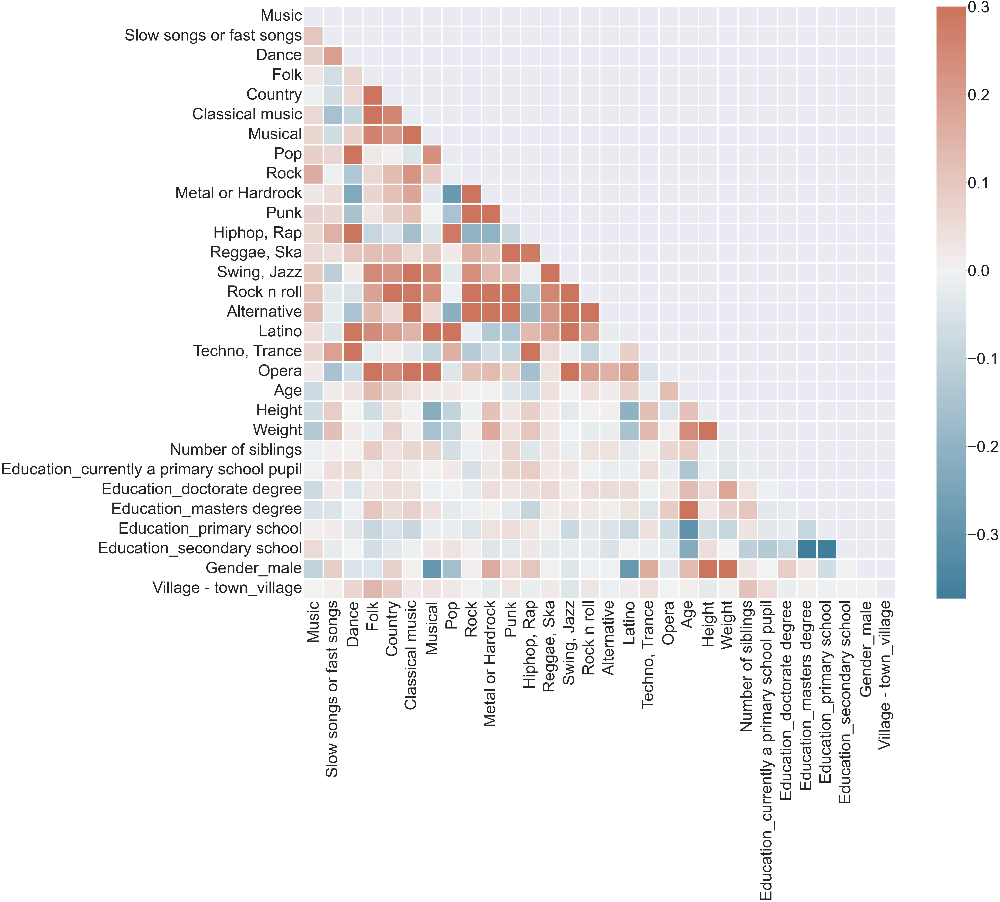

In [44]:
# Create heatmap that is for smaller dataset
sns.set(font_scale=10)
corr = study_data_small_encoded.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(100, 75))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=10, cbar_kws={"shrink": 1})

In [46]:
# following code creates dataframe of correlations used in above heatmap so I can order it and look for 
# interesting correlations.... need to get some p values in here

s = corr.unstack()
so = s.sort_values(ascending = False)
so1 = pd.DataFrame(so, columns=['score'])
so1.sort_values('score')

,,score
Education_secondary school,Education_masters degree,-0.373083
Education_masters degree,Education_secondary school,-0.373083
Education_primary school,Education_secondary school,-0.370574
Education_secondary school,Education_primary school,-0.370574
Age,Education_primary school,-0.301301
...,...,...
Gender_male,Gender_male,1.000000
Dance,Dance,1.000000
Village - town_village,Village - town_village,1.000000
Slow songs or fast songs,Slow songs or fast songs,1.000000


In [47]:
so1[(so1.score > .1) & (so1.score < 1)]

#df = df[(df['closing_price'] >= 99) & (df['closing_price'] <= 101)]

score
Weight                   Height                    0.697696
Height                   Weight                    0.697696
Gender_male              Height                    0.684602
Height                   Gender_male               0.684602
Gender_male              Weight                    0.642649
...                                                     ...
                         Hiphop, Rap               0.102516
Dance                    Reggae, Ska               0.100740
Reggae, Ska              Dance                     0.100740
Slow songs or fast songs Music                     0.100207
Music                    Slow songs or fast songs  0.100207

[208 rows x 1 columns]

Final thoughts for EDA - genre dataset is a little limited in the genres included... genres are already kinda an arbitrary concept anyway. I may try to go back and see if I can pull genres directly from spotify for the million song dataset. I didn't see any way to do this using the API but I may be missing something. 

The interesting thing is there appears to be trends in tempo, valence, etc. in genres... so a clustering algo may be able to take a song and analyze it characteristics and guess a genre or at least similar "sounding" songs.

The preference survey dataset shows some interesting correlations between education and genres, as well as height and genre preference actually. The correlations overall are pretty weak so modeling may have a hard time guessing music preference for a user based on this data but it's a good starting point. There's also a slight correlation between livign in a village and liking folk or country and living in an urban area and liking metal or rap / hiphop which might help with predicting music tastes. Also certain genres seem to be very gendered like musicals, latino, and Metal or hardcore.  Very cool dataset and definitely want to try to get it modeled!

I feel like I need to spend some time looking for stat sig correlations in both datasets. That may help narrow down what field to focus on for the model.





# MODELING TIME

# ___________________________________

### The below code runs a KNN analysis on a dataset containing genre tags that was grabbed from Kaggle HERE https://www.kaggle.com/grasslover/spotify-music-genre-list.  It's not very useful but a fun analysis
Some code was copied from the KNN notebook provided for the class

In [92]:
# import required libraries for the classifier models
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier 
from sklearn import metrics

import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

# Allow plots to appear in the notebook.
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [63]:
# One hot encode the genre category to make numeric unique genre IDs
ord_enc = OrdinalEncoder()
shortened_df['genre_code'] = ord_enc.fit_transform(shortened_df[['genre']])

/var/folders/4l/qkkslf4j6d10tgwymrh9_kvc0000gn/T/ipykernel_33317/262003260.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [64]:
# Create X variable containing numeric columns from df
feature_cols = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']
X = shortened_df[feature_cols]

In [65]:
y = shortened_df['genre_code']

In [66]:
# train test split the dasta
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2,  random_state=42)

In [67]:
# run KNN with 5 neighbors
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [68]:
y_pred_class = knn.predict(X_test)
print((metrics.accuracy_score(y_test, y_pred_class)))

0.25425711685948266


In [69]:
# Scale the data using standard scalar to hopefully improve the model
ss = StandardScaler()
Z_test = ss.fit_transform(X_test)
Z_train = ss.transform(X_train)
Z = ss.transform(X)

In [ ]:
# Calculate TRAINING ERROR and TESTING ERROR for K=1 through 100.

k_range = list(range(1, 20))
training_error = []
testing_error = []

# Find test accuracy for all values of K between 1 and 100 (inclusive).
for k in k_range:

    # Instantiate the model with the current K value.
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(Z_train, y_train)
    
    # Calculate training error (error = 1 - accuracy).
    y_pred_class = knn.predict(Z)
    training_accuracy = metrics.accuracy_score(y, y_pred_class)
    training_error.append(1 - training_accuracy)
    
    # Calculate testing error.
    y_pred_class = knn.predict(Z_test)
    testing_accuracy = metrics.accuracy_score(y_test, y_pred_class)
    testing_error.append(1 - testing_accuracy)

In [ ]:
# Create a DataFrame of K, training error, and testing error.
column_dict = {'K': k_range, 'training error':training_error, 'testing error':testing_error}
df = pd.DataFrame(column_dict).set_index('K').sort_index(ascending=False)
df.head()

In [ ]:
# Plot the relationship between K (HIGH TO LOW) and both TRAINING ERROR and TESTING ERROR.
df.plot();
plt.xlabel('Value of K for KNN');
plt.ylabel('Error (lower is better)');

In [ ]:
knn.score(Z_test, y_test)

# Personality Data

#### a dataset from kaggle called 'The Young People Survey" containing information on music preferences as well as personal preferences for 1010 individuals ages 15-30  was imported from kaggle here https://www.kaggle.com/miroslavsabo/young-people-survey

This survey was used to calculate personality traits that may be indicative of a genre preference for music using KNN as well as a suite of classifier models. Using RFE analysis traits were narrowed down and then a function was created to take user input and predict the music genre(s) the user would be interested in. 

In [80]:
#Import the study data
study_data = pd.read_csv('responses.csv')
study_data = pd.get_dummies(data = study_data, columns=['Education', 'Gender', 'Village - town'], drop_first=True)

In [81]:
# genre preference is on a 1-5 scale, this function changes the music prefernce to a binary, any score below 3 is 
# consided not liking the music and any score 3 and above is considered having a preference for it
study_data_country = study_data
for k in range(0, len(study_data)):
    if study_data.Country[k] < 3:
        study_data_country.Country.loc[k] = 0
    else:
        study_data_country.Country.loc[k] = 1

In [82]:
# Select only numeric columns
study_data_country = study_data_country.select_dtypes(include = 'number')
study_data_country.dropna(inplace = True)

In [83]:
# Select feature columns (independent variable) for KNN analysis
feature_cols = ['Music', 'Slow songs or fast songs', 'Movies', 'Psychology', 'Politics', 'Mathematics', 'Physics', 'Internet', 'PC', 'Economy Management', 'Biology', 'Chemistry', 'Reading', 'Geography', 'Foreign languages', 'Medicine', 'Law', 'Cars', 'Art exhibitions', 'Religion', 'Countryside, outdoors', 'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 'Active sport', 'Gardening', 'Celebrities', 'Shopping', 'Science and technology', 'Theatre', 'Fun with friends', 'Adrenaline sports', 'Pets',  'Healthy eating', 'Daily events', 'Prioritising workload', 'Writing notes', 'Workaholism', 'Thinking ahead', 'Final judgement', 'Reliability', 'Keeping promises', 'Loss of interest', 'Friends versus money', 'Funniness', 'Fake', 'Criminal damage', 'Decision making', 'Elections', 'Socializing', 'Achievements',  'Children', 'Assertiveness', 'Getting angry', 'Knowing the right people', 'Public speaking', 'Unpopularity', 'Life struggles', 'Happiness in life', 'Energy levels', 'Small - big dogs', 'Personality', 'Finding lost valuables', 'Getting up', 'Interests or hobbies', "Parents' advice", 'Questionnaires or polls', 'Finances', 'Shopping centres', 'Branded clothing', 'Entertainment spending', 'Spending on looks', 'Spending on gadgets', 'Spending on healthy eating', 'Age', 'Height', 'Weight', 'Number of siblings', 'Education_currently a primary school pupil', 'Education_doctorate degree', 'Education_masters degree', 'Education_primary school', 'Education_secondary school', 'Gender_male', 'Village - town_village']

In [84]:
X = study_data_country[feature_cols]
y = study_data_country['Country']

In [85]:
# Run train test split and normalize the independent variables
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25,  random_state=42)
ss = StandardScaler()
Z_train = ss.fit_transform(X_train)
Z_test = ss.transform(X_test)
Z = ss.transform(X)

In [86]:
# Calculate TRAINING ERROR and TESTING ERROR for K=1 through 100. for the KNN model

k_range = list(range(1, 101))
training_error = []
testing_error = []

# Find test accuracy for all values of K between 1 and 100 (inclusive).
for k in k_range:

    # Instantiate the model with the current K value.
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(Z_train, y_train)
    
    # Calculate training error (error = 1 - accuracy).
    y_pred_class = knn.predict(Z)
    training_accuracy = metrics.accuracy_score(y, y_pred_class)
    training_error.append(1 - training_accuracy)
    
    # Calculate testing error.
    y_pred_class = knn.predict(Z_test)
    testing_accuracy = metrics.accuracy_score(y_test, y_pred_class)
    testing_error.append(1 - testing_accuracy)

In [87]:
# Create a DataFrame of K, training error, and testing error.
column_dict = {'K': k_range, 'training error':training_error, 'testing error':testing_error}
df = pd.DataFrame(column_dict).set_index('K').sort_index(ascending=False)
df.head()

,training error,testing error
K,,
100,0.305233,0.273256
99,0.306686,0.273256
98,0.305233,0.273256
97,0.305233,0.273256
96,0.305233,0.273256


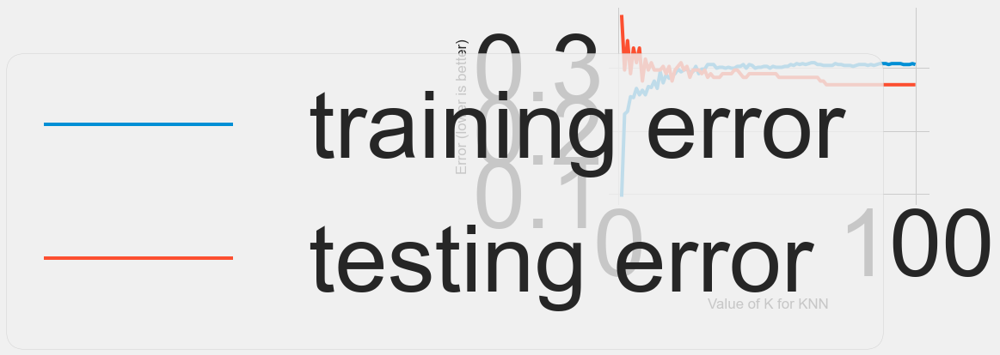

In [93]:
# Plot the relationship between K (HIGH TO LOW) and both TRAINING ERROR and TESTING ERROR.
df.plot();
plt.xlabel('Value of K for KNN');
plt.ylabel('Error (lower is better)');

In [89]:
# RUn the KNN with the 'optimized' number of neighbors
knn = KNeighborsClassifier(n_neighbors=18)
knn.fit(Z_train, y_train)
knn.score(Z_train, y_train)

0.7093023255813954

In [90]:
# check the test score
knn.score(Z_test, y_test)

0.7209302325581395

Specificity: 0.9769874476987448


/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



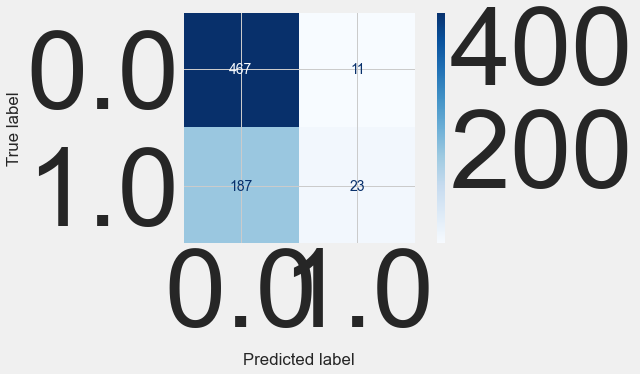

In [91]:
# Create a confusion matrix and get the precision of the model 
# Get predictions
preds = knn.predict(Z)
# Save confusion matrix values
tn, fp, fn, tp = confusion_matrix(y, preds).ravel()
      
# View confusion matrix
cnfsn_plot = plot_confusion_matrix(knn, Z, y, cmap='Blues', values_format='d');
    
spec = tn / (tn + fp)
print('Specificity:', spec)

In [ ]:
# This code runs a bunch of classifier models on the data
# First a pipeline is created which includes a preprocessing using selectkbest which selects the best features 
# for the analysis. Then a bunch of classifiers are fed into the gridsearch. 
# Parameter optimization is done on each of the models as well as cross validation

# Each classifiers score is printed out both train and test, as well as the best params

# Try running through a bunch of models to see which one performs best
fs = SelectKBest(score_func=f_classif, k=5)
    
classifiers = [
    KNeighborsClassifier(),
    SVC(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    AdaBoostClassifier(),
    GradientBoostingClassifier()
    ]
for classifier in classifiers:
    steps = [
        ('select', fs),
        ('clf', classifier)
    ]
    pipeline = Pipeline(steps)
        
    if str(classifier) == 'KNeighborsClassifier()':
         param_grid = {'clf__n_neighbors': [8,9,10]}
    elif str(classifier) == 'SVC()':
        param_grid = {'clf__kernel': ['rbf'],
                      'clf__gamma' : [0.1,1,5],
                      'clf__C' : [0.025, 0.05,1,10],
                      'clf__probability': [True]}
    elif str(classifier) == 'DecisionTreeClassifier()':
        param_grid = {'clf__max_depth' : [4,5,6],
                     'clf__min_samples_split' : [2,4,6],
                     'clf__min_samples_leaf' : [1,2,3]}
    elif str(classifier) == 'RandomForestClassifier()':
        param_grid = {'clf__n_estimators' : [100,125,150]}
    elif str(classifier) == 'AdaBoostClassifier()':
        param_grid = {'clf__n_estimators' : [50, 75]}
    elif str(classifier) == 'GradientBoostingClassifier()':
        param_grid = {'clf__n_estimators' : [100,125]}


    rand_auc = GridSearchCV(estimator=pipeline, param_grid= param_grid ,scoring='roc_auc', cv=8, verbose=False)
    rand_auc.fit(X_train, y_train)
    print(f'{classifier}s best score is {rand_auc.best_score_} and test score is {rand_auc.score(X_test, y_test)}')
    print(f' best params: {rand_auc.best_params_}')

### Function to classify specific music genre from personality data

In [96]:
# This function is an amalgam of everything before it. It cleans the data, subjects it to KNN with n_neighbor optimization
# it then runs all the data through the pipeline containing 6 classifier models. The function returns
# scores, confusion matrices, and precision for all the models (mostly focusing on KNN since that was determined to
# be one of the best models)

def knn_Decision_tree_RFE_combo(genre = 'Country'):
    feature_cols = ['Music', 'Slow songs or fast songs', 'Movies', 'Psychology', 'Politics', 'Mathematics', 
                    'Physics', 'Internet', 'PC', 'Economy Management', 'Biology', 'Chemistry', 'Reading', 
                    'Geography', 'Foreign languages', 'Medicine', 'Law', 'Cars', 'Art exhibitions', 'Religion', 
                    'Countryside, outdoors', 'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 
                    'Active sport', 'Gardening', 'Celebrities', 'Shopping', 'Science and technology', 'Theatre', 
                    'Fun with friends', 'Adrenaline sports', 'Pets',  'Healthy eating', 'Daily events', 
                    'Prioritising workload', 'Writing notes', 'Workaholism', 'Thinking ahead', 'Final judgement', 
                    'Reliability', 'Keeping promises', 'Loss of interest', 'Friends versus money', 'Funniness', 
                    'Fake', 'Criminal damage', 'Decision making', 'Elections', 'Socializing', 'Achievements',  
                    'Children', 'Assertiveness', 'Getting angry', 'Knowing the right people', 'Public speaking', 
                    'Unpopularity', 'Life struggles', 'Happiness in life', 'Energy levels', 'Small - big dogs', 
                    'Personality', 'Finding lost valuables', 'Getting up', 'Interests or hobbies', "Parents' advice", 
                    'Questionnaires or polls', 'Finances', 'Shopping centres', 'Branded clothing', 
                    'Entertainment spending', 'Spending on looks', 'Spending on gadgets', 'Spending on healthy eating', 
                    'Age', 'Height', 'Weight', 'Number of siblings', 'Education_currently a primary school pupil', 
                    'Education_doctorate degree', 'Education_masters degree', 'Education_primary school', 'Education_secondary school', 
                    'Gender_male', 'Village - town_village']
    
    study_data = pd.read_csv('responses.csv')
    study_data = pd.get_dummies(data = study_data, columns=['Education', 'Gender', 'Village - town'], drop_first=True)
    
    study_data_random = study_data
    for k in range(0, len(study_data)):
        if study_data[genre][k] < 3:
            study_data_random[genre][k] = 0
        else:
            study_data_random[genre][k] = 1

    study_data_random = study_data_random.select_dtypes(include = 'number')
    study_data_random.dropna(inplace = True)
    
    #Set up X and y
    X = study_data_random[feature_cols]
    y = study_data_random[genre]
    
    #Set up test and train data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2,  random_state=42)
    
    #Scale the test features
    ss = StandardScaler()
    Z_train = ss.fit_transform(X_train)
    Z_test = ss.transform(X_test)
    Z = ss.transform(X)
    
    #use RFE to determine best predictors
    rfe = RFE(estimator= DecisionTreeClassifier(), n_features_to_select = 0.2)
    model = DecisionTreeClassifier()
    pipeline = Pipeline(steps=[('s', rfe),('m', model)])
    pipeline.fit(Z_train, y_train)
    
    #
    columns = X.columns.tolist()
    columns = pd.DataFrame(columns)
    rfe_features = pd.DataFrame((rfe.ranking_, rfe.support_)).T
    rfe_features.rename(columns={0:'Ranking',1:'Support'}, inplace=True)
    rfe_features = pd.concat([rfe_features, columns], axis = 1)
    rfe_features.rename(columns={'Ranking':'Ranking','Support':'Support', 0:'Columns'}, inplace = True)
    
    rfe_features_list = []
    for k in range(0, len(rfe_features)):
        if rfe_features.Ranking[k] == 1:
            rfe_features_list.append(rfe_features.Columns[k])


    X = study_data_random[rfe_features_list]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3,  random_state=42)
    
    ss = StandardScaler()
    Z_train = ss.fit_transform(X_train)
    Z_test = ss.transform(X_test)
    Z = ss.transform(X)   
    
    # Calculate TRAINING ERROR and TESTING ERROR for K=1 through 100.

    k_range = list(range(1, 101))
    training_error = []
    testing_error = []

    # Find test accuracy for all values of K between 1 and 100 (inclusive).
    for k in k_range:

        # Instantiate the model with the current K value.
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(Z_train, y_train)
    
        # Calculate training error (error = 1 - accuracy).
        y_pred_class = knn.predict(Z)
        training_accuracy = metrics.accuracy_score(y, y_pred_class)
        training_error.append(1 - training_accuracy)
    
        # Calculate testing error.
        y_pred_class = knn.predict(Z_test)
        testing_accuracy = metrics.accuracy_score(y_test, y_pred_class)
        testing_error.append(1 - testing_accuracy)
        
        
    # Create a DataFrame of K, training error, and testing error.
    column_dict = {'K': k_range, 'training error':training_error, 'testing error':testing_error}
    df = pd.DataFrame(column_dict).set_index('K').sort_index(ascending=False)
    
    # Plot the relationship between K (HIGH TO LOW) and both TRAINING ERROR and TESTING ERROR.
    df.plot();
    plt.xlabel('Value of K for KNN');
    plt.ylabel('Error (lower is better)');
    
    k_value = min(list(zip(testing_error, k_range)))[1]
    knn = KNeighborsClassifier(n_neighbors=k_value, weights= 'distance')
    knn.fit(Z_train, y_train)
    
    # Get predictions
    preds = knn.predict(Z_test)

    # Save confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
    
    
    # View confusion matrix
    cnfsn_plot = plot_confusion_matrix(knn, Z_test, y_test, cmap='Blues', values_format='d');
    
    spec = tn / (tn + fp)
    
    
# Try running through a bunch of models to see which one performs best
    fs = SelectKBest(score_func=f_classif, k=5)

    classifiers = [
        KNeighborsClassifier(),
        SVC(),
        DecisionTreeClassifier(),
        RandomForestClassifier(),
        AdaBoostClassifier(),
        GradientBoostingClassifier()
        ]
    for classifier in classifiers:
        steps = [
            ('select', fs),
            ('clf', classifier)
        ]
        pipeline = Pipeline(steps)

        if str(classifier) == 'KNeighborsClassifier()':
             param_grid = {'clf__n_neighbors': [10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40],
                          'clf__weights': ['distance']}
        elif str(classifier) == 'SVC()':
            param_grid = {'clf__kernel': ['rbf'],
                          'clf__gamma' : [0.1,1,5],
                          'clf__C' : [0.025, 0.05,1,10],
                          'clf__probability': [True]}
        elif str(classifier) == 'DecisionTreeClassifier()':
            param_grid = {'clf__max_depth' : [4,5,6],
                         'clf__min_samples_split' : [2,4,6],
                         'clf__min_samples_leaf' : [1,2,3]}
        elif str(classifier) == 'RandomForestClassifier()':
            param_grid = {'clf__n_estimators' : [100,125,150]}
        elif str(classifier) == 'AdaBoostClassifier()':
            param_grid = {'clf__n_estimators' : [50, 75]}
        elif str(classifier) == 'GradientBoostingClassifier()':
            param_grid = {'clf__n_estimators' : [100,125]}


        rand_auc = GridSearchCV(estimator=pipeline, param_grid= param_grid ,scoring='roc_auc', cv=8, verbose=False)
        rand_auc.fit(Z_train, y_train)
        # Get predictions
        preds = rand_auc.predict(Z_test)
        # Save confusion matrix values
        tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
        spec = tn / (tn + fp)
        print(f'{classifier}s best score is {rand_auc.best_score_} and test score is {rand_auc.score(Z_test, y_test)}')
        print('Specificity:', spec)
        print(f' best params: {rand_auc.best_params_}')


        
    pipeline.fit(Z_train, y_train)   
    print(classifier)
    print("model score: %.3f" % pipeline.score(Z_test, y_test))
        
        
        
    # return the rfe features selected for the model, the confusion matrix, the confusion plot and the scores as well as n_neighbors used for optimal KNN
    return((rfe_features_list, plt, cnfsn_plot), 
        print(f' For KNN using best fit k (k = {min(list(zip(testing_error, k_range)))[1]}), the score for the training is {knn.score(Z_train, y_train)}, and the score for the test is {knn.score(Z_test, y_test)}, with a specificity of {spec}'));
    


#### The young people survey involved 150 questions, not all of which were good predictors of music genre preference. Based on the RFE analysis and fitting the KNN to the "best parameters" for each genre, a handful of most significant survey questions was aggregated and a new survey was created that performed just as well as the full survey did at predicting music genre preference. 

In [98]:
# same function as above just with RFE removed since parameters were optimized using RFE previously, and this time
# the function just returns the model itself, which can then be used to make predictions based on user input 

def knn_Decision_tree_refined(genre = 'Country'):
    feature_cols = ['Celebrities', 'Music', 'Slow songs or fast songs',
       'Spending on healthy eating', 'Spending on looks', 'Small - big dogs',
       'Life struggles', 'Getting angry', 'Funniness', 'Internet', 'Politics',
       'Shopping', 'Cars', 'Countryside, outdoors', 'Adrenaline sports',
       'Daily events', 'Friends versus money', 'Knowing the right people',
       'Energy levels', 'Workaholism', 'Thinking ahead', 'Assertiveness']
    
    study_data = pd.read_csv('responses.csv')
    study_data = pd.get_dummies(data = study_data, columns=['Education', 'Gender', 'Village - town'], drop_first=True)
    
    study_data_random = study_data
    for k in range(0, len(study_data)):
        if study_data[genre].loc[k] < 3:
            study_data_random[genre].loc[k] = 0
        else:
            study_data_random[genre].loc[k] = 1

    study_data_random = study_data_random.select_dtypes(include = 'number')
    study_data_random.dropna(inplace = True)
    
    #Set up X and y
    X = study_data_random[feature_cols]
    y = study_data_random[genre]
    
    #Set up test and train data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3,  random_state=42)
    
    #Scale the test features
    ss = StandardScaler()
    Z_train = ss.fit_transform(X_train)
    Z_test = ss.transform(X_test)
    Z = ss.transform(X)
     
    
    # Calculate TRAINING ERROR and TESTING ERROR for K=1 through 100.

    k_range = list(range(1, 101))
    training_error = []
    testing_error = []

    # Find test accuracy for all values of K between 1 and 100 (inclusive).
    for k in k_range:

        # Instantiate the model with the current K value.
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(Z_train, y_train)
    
        # Calculate training error (error = 1 - accuracy).
        y_pred_class = knn.predict(Z)
        training_accuracy = metrics.accuracy_score(y, y_pred_class)
        training_error.append(1 - training_accuracy)
    
        # Calculate testing error.
        y_pred_class = knn.predict(Z_test)
        testing_accuracy = metrics.accuracy_score(y_test, y_pred_class)
        testing_error.append(1 - testing_accuracy)
        
        
    # Create a DataFrame of K, training error, and testing error.
    column_dict = {'K': k_range, 'training error':training_error, 'testing error':testing_error}
    df = pd.DataFrame(column_dict).set_index('K').sort_index(ascending=False)
    
    # Plot the relationship between K (HIGH TO LOW) and both TRAINING ERROR and TESTING ERROR.
    df.plot();
    plt.xlabel('Value of K for KNN');
    plt.ylabel('Error (lower is better)');
    
    k_value = min(list(zip(testing_error, k_range)))[1]
    knn = KNeighborsClassifier(n_neighbors=k_value, weights= 'distance')
    knn.fit(Z_train, y_train)
    
    # Get predictions
    preds = knn.predict(Z_test)

    # Save confusion matrix values
    tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
    
    
    # View confusion matrix
    cnfsn_plot = plot_confusion_matrix(knn, Z_test, y_test, cmap='Blues', values_format='d');
    
    spec = tn / (tn + fp)
    
    
# Try running through a bunch of models to see which one performs best
    fs = SelectKBest(score_func=f_classif, k=5)

    classifiers = [
        KNeighborsClassifier(),
        SVC(),
        DecisionTreeClassifier(),
        RandomForestClassifier(),
        AdaBoostClassifier(),
        GradientBoostingClassifier()
        ]
    for classifier in classifiers:
        steps = [
            ('select', fs),
            ('clf', classifier)
        ]
        pipeline = Pipeline(steps)

        if str(classifier) == 'KNeighborsClassifier()':
             param_grid = {'clf__n_neighbors': [10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40],
                          'clf__weights': ['distance']}
        elif str(classifier) == 'SVC()':
            param_grid = {'clf__kernel': ['rbf'],
                          'clf__gamma' : [0.1,1,5],
                          'clf__C' : [0.025, 0.05,1,10],
                          'clf__probability': [True]}
        elif str(classifier) == 'DecisionTreeClassifier()':
            param_grid = {'clf__max_depth' : [4,5,6],
                         'clf__min_samples_split' : [2,4,6],
                         'clf__min_samples_leaf' : [1,2,3]}
        elif str(classifier) == 'RandomForestClassifier()':
            param_grid = {'clf__n_estimators' : [100,125,150]}
        elif str(classifier) == 'AdaBoostClassifier()':
            param_grid = {'clf__n_estimators' : [50, 75]}
        elif str(classifier) == 'GradientBoostingClassifier()':
            param_grid = {'clf__n_estimators' : [100,125]}


        rand_auc = GridSearchCV(estimator=pipeline, param_grid= param_grid ,scoring='roc_auc', cv=8, verbose=False)
        rand_auc.fit(Z_train, y_train)
        # Get predictions
        preds = rand_auc.predict(Z_test)
        # Save confusion matrix values
        tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
        spec = tn / (tn + fp)
        print(f'{classifier}s best score is {rand_auc.best_score_} and test score is {rand_auc.score(Z_test, y_test)}')
        print('Specificity:', spec)
        print(f' best params: {rand_auc.best_params_}')


        
    pipeline.fit(Z_train, y_train)   
    print(classifier)
    print("model score: %.3f" % pipeline.score(Z_test, y_test))
    model = knn    
        
        
    
    return model 
     

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5661558197662178 and test score is 0.5454076958314247
Specificity: 0.9121621621621622
 best params: {'clf__n_neighbors': 40, 'clf__weights': 'distance'}
SVC()s best score is 0.6015875987393958 and test score is 0.5157466788822721
Specificity: 1.0
 best params: {'clf__C': 0.05, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.6253164669804593 and test score is 0.5916743014200642
Specificity: 0.8243243243243243
 best params: {'clf__max_depth': 4, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 4}
RandomForestClassifier()s best score is 0.5632495661579423 and test score is 0.5636738433348604
Specificity: 0.8581081081081081
 best params: {'clf__n_estimators': 150}
AdaBoostClassifier()s best score is 0.6194576889377916 and test score is 0.5733508932661475
Specificity: 0.918918918918919
 best params: {'clf__n_estimators': 50}
GradientBoostingClassifier()s best score is 0.5791139858453722

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.6798643787506818 and test score is 0.6743317610062894
Specificity: 0.20833333333333334
 best params: {'clf__n_neighbors': 32, 'clf__weights': 'distance'}
SVC()s best score is 0.6745004773595199 and test score is 0.6178590146750524
Specificity: 0.14583333333333334
 best params: {'clf__C': 10, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.679214402618658 and test score is 0.6074423480083858
Specificity: 0.020833333333333332
 best params: {'clf__max_depth': 4, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2}
RandomForestClassifier()s best score is 0.7010003239225313 and test score is 0.6931341719077568
Specificity: 0.25
 best params: {'clf__n_estimators': 100}
AdaBoostClassifier()s best score is 0.7153019298963448 and test score is 0.6474056603773585
Specificity: 0.16666666666666666
 best params: {'clf__n_estimators': 50}
GradientBoostingClassifier()s best score is 0.707284847244

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5656321355999665 and test score is 0.5502380142808568
Specificity: 0.11764705882352941
 best params: {'clf__n_neighbors': 28, 'clf__weights': 'distance'}
SVC()s best score is 0.5908316050779286 and test score is 0.5580584835090104
Specificity: 0.0
 best params: {'clf__C': 0.025, 'clf__gamma': 5, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.5578608780584884 and test score is 0.5918905134308059
Specificity: 0.0
 best params: {'clf__max_depth': 4, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 4}
RandomForestClassifier()s best score is 0.5726279694570136 and test score is 0.5978408704522271
Specificity: 0.11764705882352941
 best params: {'clf__n_estimators': 100}
AdaBoostClassifier()s best score is 0.5775593891402715 and test score is 0.5316218973138388
Specificity: 0.0
 best params: {'clf__n_estimators': 50}
GradientBoostingClassifier()s best score is 0.5521049365258924 and test score is 0.5859401

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5802117228835979 and test score is 0.5318886144172469
Specificity: 0.7054794520547946
 best params: {'clf__n_neighbors': 40, 'clf__weights': 'distance'}
SVC()s best score is 0.6179822255291005 and test score is 0.6372670110038176
Specificity: 1.0
 best params: {'clf__C': 0.05, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.5890580357142857 and test score is 0.5824163485290815
Specificity: 0.7328767123287672
 best params: {'clf__max_depth': 4, 'clf__min_samples_leaf': 3, 'clf__min_samples_split': 4}
RandomForestClassifier()s best score is 0.5554176587301587 and test score is 0.5213339321805525
Specificity: 0.7191780821917808
 best params: {'clf__n_estimators': 125}
AdaBoostClassifier()s best score is 0.6033125826719576 and test score is 0.5815742196272176
Specificity: 0.7397260273972602
 best params: {'clf__n_estimators': 75}
GradientBoostingClassifier()s best score is 0.588737847222222

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5095207659987071 and test score is 0.5076525541641821
Specificity: 0.3974358974358974
 best params: {'clf__n_neighbors': 38, 'clf__weights': 'distance'}
SVC()s best score is 0.540182207498384 and test score is 0.6151361558338303
Specificity: 0.0
 best params: {'clf__C': 0.05, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.5352434550743375 and test score is 0.578960445239515
Specificity: 0.47435897435897434
 best params: {'clf__max_depth': 6, 'clf__min_samples_leaf': 3, 'clf__min_samples_split': 6}
RandomForestClassifier()s best score is 0.5092594537815126 and test score is 0.5041741204531902
Specificity: 0.34615384615384615
 best params: {'clf__n_estimators': 100}
AdaBoostClassifier()s best score is 0.4998512443438914 and test score is 0.5766746173722918
Specificity: 0.3333333333333333
 best params: {'clf__n_estimators': 75}
GradientBoostingClassifier()s best score is 0.508491192630898

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5792422288359789 and test score is 0.5491062848356718
Specificity: 0.46511627906976744
 best params: {'clf__n_neighbors': 40, 'clf__weights': 'distance'}
SVC()s best score is 0.6816419477513227 and test score is 0.6642802229482991
Specificity: 0.0
 best params: {'clf__C': 0.025, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.6690991236772486 and test score is 0.6290121083990006
Specificity: 0.5
 best params: {'clf__max_depth': 4, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2}
RandomForestClassifier()s best score is 0.5903831845238094 and test score is 0.5832212185277725
Specificity: 0.4883720930232558
 best params: {'clf__n_estimators': 125}
AdaBoostClassifier()s best score is 0.6765973048941799 and test score is 0.6289160099942341
Specificity: 0.47674418604651164
 best params: {'clf__n_estimators': 75}
GradientBoostingClassifier()s best score is 0.6404281580687832 and test s

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5535197585978836 and test score is 0.4933998100664767
Specificity: 0.5128205128205128
 best params: {'clf__n_neighbors': 38, 'clf__weights': 'distance'}
SVC()s best score is 0.5712091306166827 and test score is 0.4985280151946819
Specificity: 0.5726495726495726
 best params: {'clf__C': 1, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.538068714175485 and test score is 0.5104463437796771
Specificity: 0.38461538461538464
 best params: {'clf__max_depth': 5, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 4}
RandomForestClassifier()s best score is 0.5287487818412298 and test score is 0.4733143399810066
Specificity: 0.48717948717948717
 best params: {'clf__n_estimators': 150}
AdaBoostClassifier()s best score is 0.5592029076729597 and test score is 0.5153371320037987
Specificity: 0.49572649572649574
 best params: {'clf__n_estimators': 50}
GradientBoostingClassifier()s best score is 0.5

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5929769157028882 and test score is 0.5458748221906116
Specificity: 0.32432432432432434
 best params: {'clf__n_neighbors': 36, 'clf__weights': 'distance'}
SVC()s best score is 0.6522087018368483 and test score is 0.5653830522251575
Specificity: 0.0
 best params: {'clf__C': 0.05, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.6246037942977303 and test score is 0.517831741515952
Specificity: 0.2972972972972973
 best params: {'clf__max_depth': 4, 'clf__min_samples_leaf': 3, 'clf__min_samples_split': 2}
RandomForestClassifier()s best score is 0.5593922011256107 and test score is 0.5326661247713879
Specificity: 0.35135135135135137
 best params: {'clf__n_estimators': 150}
AdaBoostClassifier()s best score is 0.6546439173727503 and test score is 0.5566449908555172
Specificity: 0.28378378378378377
 best params: {'clf__n_estimators': 50}
GradientBoostingClassifier()s best score is 0.6096349495949

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.5744681750541125 and test score is 0.5642808847677002
Specificity: 0.5057471264367817
 best params: {'clf__n_neighbors': 26, 'clf__weights': 'distance'}
SVC()s best score is 0.5949828768839186 and test score is 0.656138317395924
Specificity: 0.10344827586206896
 best params: {'clf__C': 0.05, 'clf__gamma': 0.1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.5566468097392576 and test score is 0.6024340770791076
Specificity: 0.4482758620689655
 best params: {'clf__max_depth': 4, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 4}
RandomForestClassifier()s best score is 0.5671181213173401 and test score is 0.5593547763933159
Specificity: 0.4367816091954023
 best params: {'clf__n_estimators': 125}
AdaBoostClassifier()s best score is 0.5464167029922239 and test score is 0.6586013715831159
Specificity: 0.5172413793103449
 best params: {'clf__n_estimators': 50}
GradientBoostingClassifier()s best score is 0.

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/nicktuttle/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



KNeighborsClassifier()s best score is 0.623203601953602 and test score is 0.5566880439761795
Specificity: 0.3728813559322034
 best params: {'clf__n_neighbors': 40, 'clf__weights': 'distance'}
SVC()s best score is 0.6511568032661783 and test score is 0.5687700412276684
Specificity: 0.0
 best params: {'clf__C': 0.025, 'clf__gamma': 1, 'clf__kernel': 'rbf', 'clf__probability': True}
DecisionTreeClassifier()s best score is 0.6120222832722833 and test score is 0.5413421896472744
Specificity: 0.23728813559322035
 best params: {'clf__max_depth': 5, 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 4}
RandomForestClassifier()s best score is 0.6348246718559218 and test score is 0.5550274851122309
Specificity: 0.423728813559322
 best params: {'clf__n_estimators': 100}
AdaBoostClassifier()s best score is 0.6673394574175824 and test score is 0.5925904718277598
Specificity: 0.4067796610169492
 best params: {'clf__n_estimators': 75}
GradientBoostingClassifier()s best score is 0.6508921894078145 

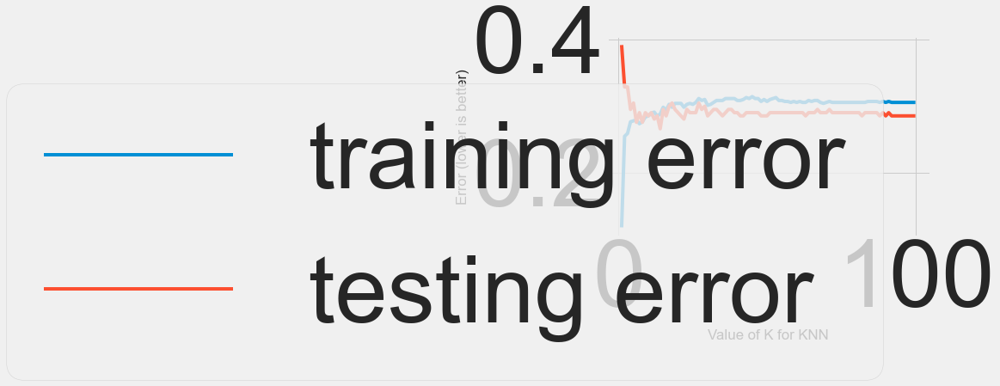

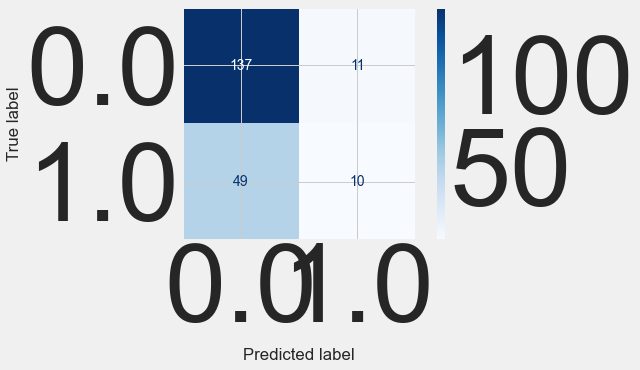

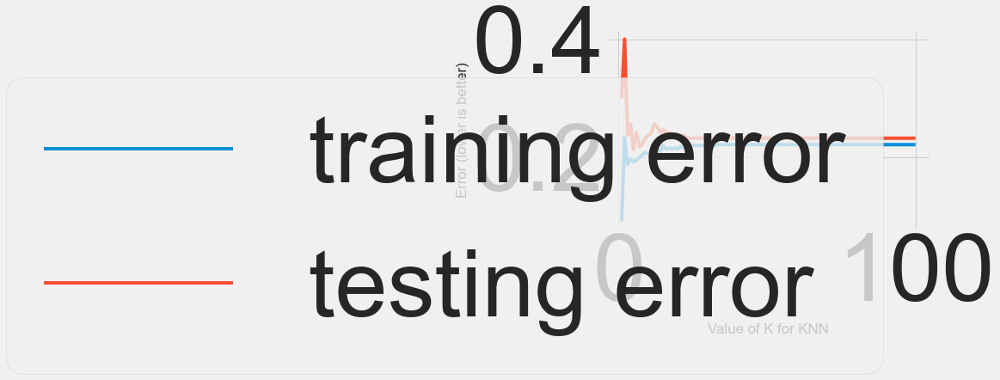

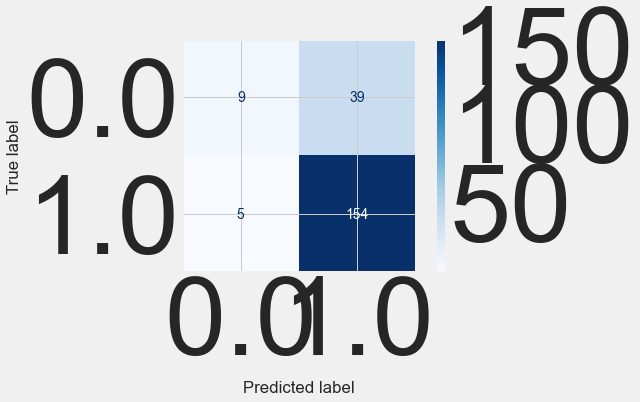

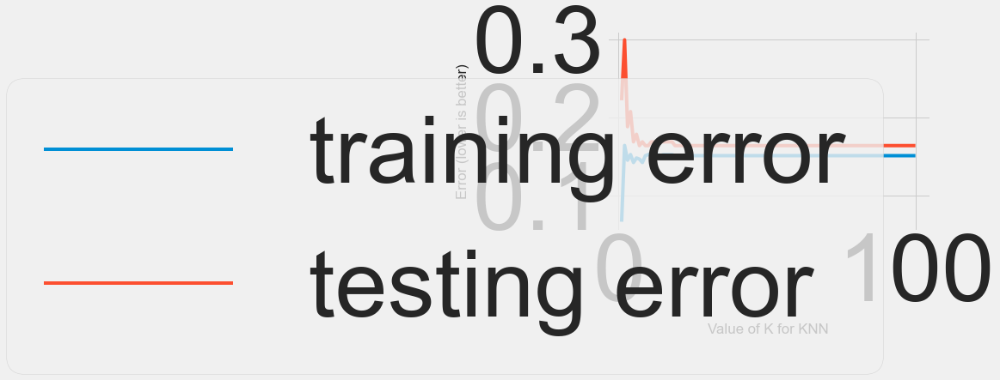

...

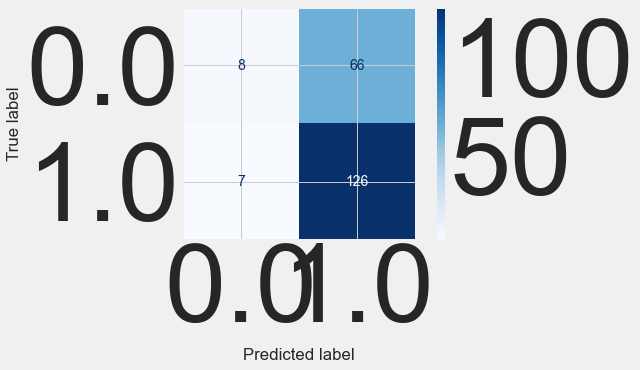

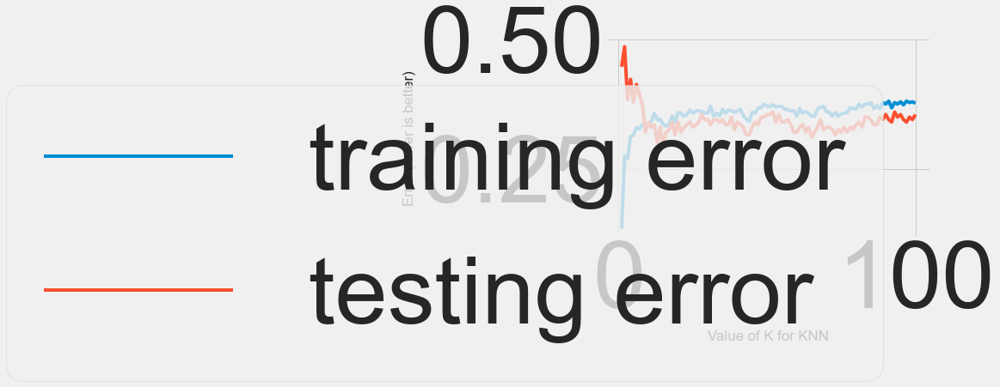

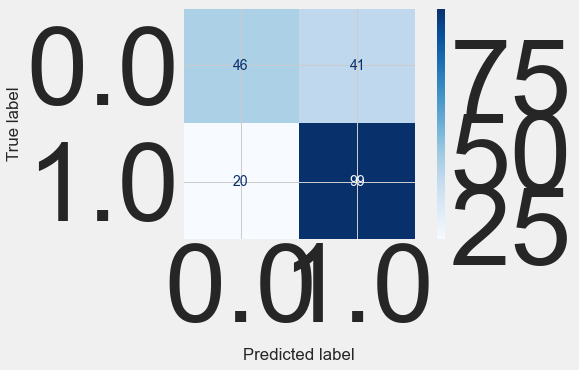

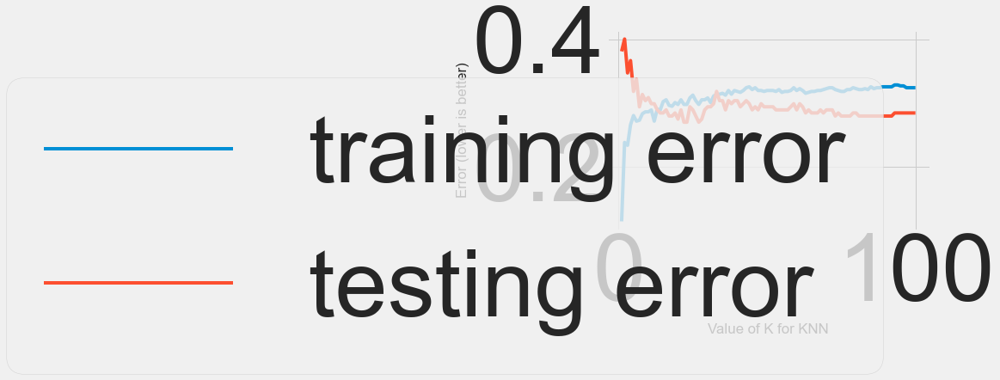

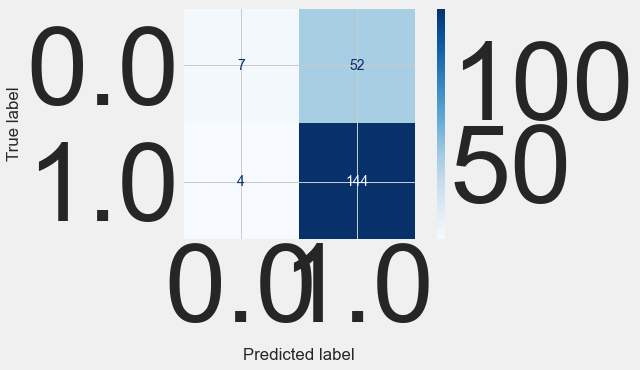

In [99]:
# Run the function for each genre creating a KNN model for each genre. Also shown are the confusion matrix's from 
# each genre model. Notice some really bad precision... likely due to small dataset and slight overfitting 
# of the model. Need to fine tune this a little, probably have to get more data to really solve the issue
country_model = knn_Decision_tree_refined()
pop_model = knn_Decision_tree_refined('Pop')
rock_model = knn_Decision_tree_refined("Rock")
folk_model = knn_Decision_tree_refined('Folk')
alternative_model = knn_Decision_tree_refined('Alternative')
rap_model = knn_Decision_tree_refined('Hiphop, Rap')
punk_model = knn_Decision_tree_refined('Punk')
classical_model = knn_Decision_tree_refined('Classical music')
musical_model = knn_Decision_tree_refined('Musical')
dance_model = knn_Decision_tree_refined('Dance')

def genre_code(genre = 'Country'):
    for k in range(0, len(study_data_random)):
        if study_data_random[genre].loc[k] < 3:
            study_data_random[genre].loc[k] = 0
        else:
            study_data_random[genre].loc[k] = 1
    return(study_data_random)

# Million Song Dataset
### The below code will import the million song dataset and create a cosine sim between a user defined song from the dataset and other songs in the dataset to produce 10 most similar song recommendations. A function will also allow results from the personality test to recommend genre's / songs for the user.

In [3]:
# Import the spotify dataset with 1.2 million songs (but no genre)
genre_df_merged = pd.read_csv('million_genre.csv')
len(genre_df_merged)

1205000

In [4]:
# Drop na's and then view the dataset. NA's are introduced in songs that do not have a genre from the API, mostly 
# due to the fact that I didn't add genre's to the exhaustive list since it was over 1.2 million songs
genre_df_merged.dropna(inplace = True)
len(genre_df_merged)


902889

In [5]:
# This loop cleans up the genre and turns it into a string for easy use with str functions. However it's not needed
# when you import the csv as it makes the artists genres column a string already


#genre_df_merged['genre_string'] = [','.join(map(str, l)) for l in genre_df_merged['artist_genres']]

In [6]:
len(genre_df_merged)

902889

In [7]:
# Makes sure datasaet is NA free
genre_df_merged.dropna(inplace=True)
len(genre_df_merged)

902889

In [8]:
# Since the list of genres from spotify was over 16K, and there's only 1 million songs, there likely weren't enough songs
#from each genre to accurately predict or recommend anything. Plus some of the genres were very obsecure and I wanted to
# match genre labels from the personality survey which were very broad / high level. 

#This code looks for 'basic' genre strings in the convoluted spotify genre labels and then assigns them to a new column
# basically manual one hot encoding 
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('rock'), 'genre_rock'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('pop'), 'genre_pop'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('folk'), 'genre_folk'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('country'), 'genre_country'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('rap'), 'genre_rap'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('musical'), 'genre_musical'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('electronic'), 'genre_dance'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('dance'), 'genre_dance'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('metal'), 'genre_metal'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('hardcore'), 'genre_metal'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('emo'), 'genre_rock'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('punk'), 'genre_punk'] = 1

In [9]:
# fills in 0's in the newly created genre columns
# The dataset gets significantly shorter here indicating I am missing a LOT of genres. That's ok for this analysis
# but something I should come back to
genre_df_merged.fillna(0, inplace = True)
len(genre_df_merged)

902889

In [10]:
#This code looks for 'basic' genre strings in the convoluted spotify genre labels and then assigns them to a the same
#column using a numeric identifier basically manual "get dummy variables"
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('rock'), 'genre_code'] = 0
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('pop'), 'genre_code'] = 1
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('folk'), 'genre_code'] = 2
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('country'), 'genre_code'] = 3
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('rap'), 'genre_code'] = 4
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('musical'), 'genre_code'] = 5
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('electronic'), 'genre_code'] = 6
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('dance'), 'genre_code'] = 6
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('metal'), 'genre_code'] = 7
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('hardcore'), 'genre_code'] = 7
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('punk'), 'genre_code'] = 8
genre_df_merged.loc[genre_df_merged['artist_genres'].str.contains('emo'), 'genre_code'] = 0

In [11]:
genre_df_merged["artists"] = genre_df_merged["artists"].str.lower()
genre_df_merged["name"] = genre_df_merged["name"].str.lower()

In [12]:
# KNN doesn't do well with NA's
genre_df_merged.dropna(inplace=True)
len(genre_df_merged)

353820

In [14]:
genre_df_merged.to_csv('genre_df_merged.csv')

## KNN of million song dataset
### the following code runs a KNN to predict genre based on song features. It takes a long time to run and 
### could use some more tuning and gridsearch but didn't want to waste time guessing a song's genre based on features. It was mostly a fun aside I was trying

In [110]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier 
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler

In [111]:
feature_cols = ['danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'popularity']
X = genre_df_merged[feature_cols]
y = genre_df_merged['genre_code']

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2,  random_state=42)

In [113]:
ss = StandardScaler()
Z_test = ss.fit_transform(X_test)
Z_train = ss.transform(X_train)
Z = ss.transform(X)

In [ ]:
knn = KNeighborsClassifier(n_neighbors=20)
knn.fit(Z_train, y_train)
knn.score(Z_train, y_train)
knn.score(Z_test, y_test)

In [ ]:
# Get predictions
preds = knn.predict(Z_test)

In [ ]:
from sklearn.metrics import multilabel_confusion_matrix
y_unique = y_test.unique()
mcm = multilabel_confusion_matrix(y_test, preds, labels = y_unique)
mcm


# Building the prediction engine - Cosine Similarity...
### finally

#### The below section is comprised of functions to recommend similar songs to a user provided input... granted their song is one of the 320K songs in the analysis 


In [114]:
# The following function takes in a song_id (spotify generated unique identifiers) and then spits out the n number 
# of songs that are most similar based on a cosine similarity score generated by unique song features (e.g. tempo, liveness, etc.)



def get_cosim_song_id(song_id, df=genre_df_merged, n=20):
        genre_df_merged3 = genre_df_merged[['id', 'artists', 'name']]
        df=genre_df_merged
        ss = StandardScaler()
        df2 = df[['danceability', 'energy','key', 'loudness', 'mode', 'speechiness', 'acousticness','instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'popularity', 'id']]
        df2.set_index('id', inplace=True)
        df_scaled = ss.fit_transform(df2)
        df = pd.DataFrame(data=df_scaled, index=df2.index)

        # This part of the code creates arrays to be fed into the cosine_similarity function. basically takes the song
        #characteristics and makes it an array, then the other song characteristics (not including the selected song) 
        #and turns them into an array
        artist_names = []
        song_array = np.array(df.T[song_id]).reshape(1,-1)
        dataset_array = df.drop(index=song_id).values
       
        #Calculate cosine similarity scores
        cosim_scores = cosine_similarity(song_array, dataset_array).flatten()

        song_names_array = df2.drop(index=song_id).index.values
        
        # Create dataframe containing song ID and cosine score
        df_result = pd.DataFrame(
            data = {
            'id'            :song_names_array,
            'cosim_'        :cosim_scores,

            }
        )

        df_result = df_result.sort_values(by='cosim_', ascending=False).head(n)  
        merged_df = df_result.merge(genre_df_merged3, how = 'inner', on = ['id'])
        return merged_df.reset_index(drop=True)

# SONG RECOMMENDER

### This function will take user inputs for artist and song name and then recommend 10 of the most similar songs within the same genre and within any genre (based on user input)

In [153]:
# THis function is almost same as above, calculates cosine score and produces similar songs to user input HOWEVER
# THIS FUNCTION TAKES IN USER INPUT (artist, song name, same genre) and produces 10 most similar songs 

def get_cosim_user_inputs(df=genre_df_merged, n=100):
        #Get user inputs. must be spelled correctly but can be upper or lower case
        artist_request=input("what artist would you like similar recommendations for? ").lower()
        song_request=input("what song would you like similar recommendations for ").lower()
        genre_request=input("Do you want the music to be in the same genre? ").lower()
        
        # creates a DF of the full request (artist and song) from the million song dataset
        full_request = genre_df_merged[genre_df_merged['artists'].str.contains(artist_request) & genre_df_merged['name'].str.contains(song_request)].reset_index()
        
        # Pulls out the song into an array for ease of use
        request2 = full_request.iloc[[0]]
        # Just the requested song ID
        song_id = request2.iat[0,2]
        # Genre code of the requested song
        genre_code = request2.iat[0,37]

        
        genre_df_merged3 = genre_df_merged[['id', 'artists', 'name', 'genre_code']]
        df=genre_df_merged
        ss = StandardScaler()
        df2 = df[['danceability', 'energy','key', 'loudness', 'mode', 'speechiness', 'acousticness','instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'popularity', 'id']]
        df2.set_index('id', inplace=True)
        df_scaled = ss.fit_transform(df2)
        df = pd.DataFrame(data=df_scaled, index=df2.index)

        artist_names = []
        song_array = np.array(df.T[song_id]).reshape(1,-1)
        dataset_array = df.drop(index=song_id).values


        cosim_scores = cosine_similarity(song_array, dataset_array).flatten()

        song_names_array = df2.drop(index=song_id).index.values
        

        df_result = pd.DataFrame(
            data = {
            'id'            :song_names_array,
            'cosim_'        :cosim_scores,

            }
        )

        df_result = df_result.sort_values(by='cosim_', ascending=False).head(n)  
        merged_df = df_result.merge(genre_df_merged3, how = 'inner', on = ['id'])
        # Little if statement that produces songs only in the same genre as the user input song, if the 
        # user prefers
        if genre_request == "yes":
            return(merged_df.loc[merged_df['genre_code'] == genre_code].head(10))
        else:
            return merged_df.reset_index(drop=True).head(10)

### Song Recommendation Engine Use example

In [154]:
get_cosim_user_inputs()

what artist would you like similar recommendations for? miley cyrus
what song would you like similar recommendations for plastic heart
Do you want the music to be in the same genre? yes


,id,cosim_,artists,name,genre_code
0,021LIvL2dzb6FSX1mllbNh,1.000000,['miley cyrus'],plastic hearts,6.0
1,4XNZWe6lIUZboWUEfidn46,0.977246,['westlife'],to be with you,6.0
4,7ITZXDVEyVJ5HwVYsi7Ro5,0.974037,['kelly clarkson'],good goes the bye,6.0
6,0LYlsuc3mdKKFUp97qZoEF,0.970701,['p!nk'],long way to happy,6.0
10,3PVw25ktxI9o7RHt54G2cj,0.964777,['train'],i will remember,6.0
17,5giCRvTkp5GV5UIAORAOof,0.960228,['westlife'],if i let you go - radio edit,6.0
19,3ZV6Ry07586w52Wy1cLbLL,0.959707,['usher'],wait for it,6.0
20,51c0YDa7BZUiT79IwDZVkj,0.959218,['the script'],superheroes,6.0
21,4josbWhbCWqSYffL4sq9ym,0.958466,['chloe x halle'],don't make it harder on me,6.0
29,4LMDlnmG4npcAKqIOnrhPd,0.954356,['bazzi'],live forever,6.0


# Predict songs based on personality survey

### this below function provides the user with survey questions, then recommends songs to them based on what genres it thinks the user will most be interested in.

In [125]:
def get_personality():
    Celebrities=input("Celebrities: Not interested 1-2-3-4-5 Very interested  ")
    music=input("I enjoy listening to music.: Strongly disagree 1-2-3-4-5 Strongly agree   ")
    Slow_songs_or_fast_songs=input("I prefer.: Slow paced music 1-2-3-4-5 Fast paced music  ")
    Spending_on_healthy_eating=input("I will hapilly pay more money for good, quality or healthy food.: Strongly disagree 1-2-3-4-5 Strongly agree  ")
    spending_on_looks=input("I spend a lot of money on my appearance.: Strongly disagree 1-2-3-4-5 Strongly agree  ")
    Small_big_dogs=input("I prefer big dangerous dogs to smaller, calmer dogs.: Strongly disagree 1-2-3-4-5 Strongly agree  ")
    Life_struggles=input("I cry when I feel down or things don't go the right way from 1-5  ")
    Getting_angry=input("I can get angry very easily from 1-5  ")
    Funniness=input("I always try to be the funniest one from 1-5  ")
    Internet=input("Internet: Not interested 1-2-3-4-5 Very interested  ")
    Politics=input("Politics - Not interested 1-2-3-4-5 Very interested  ")
    Shopping=input("Shopping - Not interested 1-2-3-4-5 Very interested  ")
    Cars=input("Cars: Not interested 1-2-3-4-5 Very interested  ")
    Countryside_outdoors=input("Outdoor activities: Not interested 1-2-3-4-5 Very interested  ")    
    adrenaline_sports=input("Adrenaline sports: Not interested 1-2-3-4-5 Very interested  ")
    daily_events=input("I take notice of what goes on around me from 1-5  ")
    Friends_versus_money=input("I would rather have lots of friends than lots of money  ")
    Knowing_the_right_people=input("I always make sure I connect with the right people  ")
    energy_levels=input("I am always full of life and energy  ")
    workaholism=input("I often study or work even in my spare time  ")
    assertiveness=input("I am not afraid to give my opinion if I feel strongly about something  ")
    thinking_ahead=input("I look at things from all different angles before I go ahead  ")
    
    data = {'Celebrities' : Celebrities,
    'Music' : music,
    'Slow songs or fast songs' : Slow_songs_or_fast_songs,
    'Spending on healthy eating': Spending_on_healthy_eating,
    'Spending on looks' : spending_on_looks,
    'Small - big dogs' : Small_big_dogs,
    'Life struggles' : Life_struggles,
    'Getting angry' : Getting_angry,
    'Funniness' : Funniness,
    'Internet' : Internet,
    'Politics' : Politics,
    'Shopping' : Shopping,
    'Cars' : Cars,
    'Countryside, outdoors' : Countryside_outdoors,
    'Adrenaline sports' : adrenaline_sports,
    'Daily events' : daily_events,
    'Friends versus money' : Friends_versus_money,
    'Knowing the right people' : Knowing_the_right_people,
    'Energy levels' : energy_levels,
    'Workaholism' : workaholism,
    'Assertivenesss' : assertiveness,
    'Thinking ahead' : thinking_ahead
    }

    personality = pd.DataFrame(data = data, index = [0])
    X = personality
    X = np.array(X).reshape(1,-1)
    
    # Predict interest based on the KNN models made previously for each genre
    rock_interest = rock_model.predict(X)
    country_interest = country_model.predict(X)
    pop_interest = pop_model.predict(X)
    folk_interest = folk_model.predict(X)
    rap_interest = rap_model.predict(X)
    punk_interest = punk_model.predict(X)
    classical_interest = classical_model.predict(X)
    musical_interest = musical_model.predict(X)
    alternative_interest = alternative_model.predict(X)
    dance_interest = dance_model.predict(X)
    
    # create dictionary containing predictions and labels
    predictions = {'Rock' : rock_interest[0],
    'Country' : country_interest[0],
    'Pop' : pop_interest[0],
    'folk' : folk_interest[0],  
    'Rap' : rap_interest[0],
    'Punk' : punk_interest[0],
    'Classical' : classical_interest[0],
    'Musical' : musical_interest[0],
    'Alternative' : alternative_interest[0],
    'Dance' : dance_interest[0]
    
    }
    
    personality = pd.DataFrame(data = predictions, index = [0])


    return(personality)


In [128]:
# This function takes genre predictions based on user answers to the survey and then grabs 3 songs at random from
# the million song database that match each of the genres the user is predicted to like, and concatenates that 
# into a data frame. This function is nested inside the next function, but does the heavy lifting of creating a
# dataframe of recommended songs for the user
def personality_recs():
    rec_df = genre_df_merged[['id','genre_code', 'artists', 'name']]
    genre_coded = []
    rock_recs = pd.DataFrame()
    pop_recs = pd.DataFrame()
    folk_recs = pd.DataFrame()
    country_recs = pd.DataFrame()
    rap_recs = pd.DataFrame()
    musical_recs = pd.DataFrame()
    dance_recs = pd.DataFrame()
    punk_recs = pd.DataFrame()

    if personality['Rock'].values == 1:
        genre_coded.append(0)
        rock_recs = rec_df[rec_df['genre_code'] == 0].sample(3)
        rock_recs['genre'] = 'rock'
    if personality['Pop'].values == 1:
        genre_coded.append(1) 
        pop_recs = rec_df[rec_df['genre_code'] == 1].sample(3)
        pop_recs['genre'] = 'pop'
    if personality['folk'].values == 1:
        genre_coded.append(2)
        folk_recs = rec_df[rec_df['genre_code'] == 2].sample(3)
        folk_recs['genre'] = 'folk'
    if personality['Country'].values == 1:
        genre_coded.append(3) 
        country_recs = rec_df[rec_df['genre_code'] == 3].sample(3)
        country_recs['genre'] = 'country'
    if personality['Rap'].values == 1:
        genre_coded.append(4) 
        rap_recs = rec_df[rec_df['genre_code'] == 4].sample(3)
        rap_recs['genre'] = 'rap'
    if personality['Musical'].values == 1:
        genre_coded.append(5)
        musical_recs = rec_df[rec_df['genre_code'] == 5].sample(3)
        musical_recs['genre'] = 'musical'
    if personality['Dance'].values == 1:
        genre_coded.append(6)
        dance_recs = rec_df[rec_df['genre_code'] == 6].sample(3)
        dance_recs['genre'] = 'dance'
    if personality['Punk'].values == 1:
        genre_coded.append(6)
        punk_recs = rec_df[rec_df['genre_code'] == 6].sample(3)
        punk_recs['genre'] = 'punk'


    recommendations = pd.concat([rock_recs, pop_recs, folk_recs, country_recs, rap_recs, punk_recs, musical_recs, dance_recs])
    return recommendations

# Run the cell below to start the survey and get your recs!!

In [131]:
personality = get_personality()
personality_recs()

Celebrities: Not interested 1-2-3-4-5 Very interested  2
I enjoy listening to music.: Strongly disagree 1-2-3-4-5 Strongly agree   5
I prefer.: Slow paced music 1-2-3-4-5 Fast paced music  4
I will hapilly pay more money for good, quality or healthy food.: Strongly disagree 1-2-3-4-5 Strongly agree  5
I spend a lot of money on my appearance.: Strongly disagree 1-2-3-4-5 Strongly agree  3
I prefer big dangerous dogs to smaller, calmer dogs.: Strongly disagree 1-2-3-4-5 Strongly agree  1
I cry when I feel down or things don't go the right way from 1-5  1
I can get angry very easily from 1-5  2
I always try to be the funniest one from 1-5  5
Internet: Not interested 1-2-3-4-5 Very interested  4
Politics - Not interested 1-2-3-4-5 Very interested  5
Shopping - Not interested 1-2-3-4-5 Very interested  4
Cars: Not interested 1-2-3-4-5 Very interested  1
Outdoor activities: Not interested 1-2-3-4-5 Very interested  3
Adrenaline sports: Not interested 1-2-3-4-5 Very interested  2
I take notic

,id,genre_code,artists,name,genre
44497,3xxuepU9wZAmIZlWffXq6q,0.0,['human drama'],lost,rock
595129,2bD9x9kN4wYyVoyckeqlLk,0.0,['janis joplin'],move over,rock
295619,2jP8qKVOVyWddbI67XXJ6n,0.0,['lee bains iii & the glory fires'],roebuck parkway,rock
98282,2AKDTQGnaDJiTXoxGgLJaZ,1.0,['annika eklund'],rakkaudessa voitolla,pop
612117,6PXGJ8JTCvjcOXCb4QqJvw,1.0,['eliane elias'],dreamer (vivo sonhando),pop
274426,4WvBVRzQSTTQghMt55svjo,1.0,['zap mama'],poetry man,pop
811041,26t0xoYPRxyHvIN62P85au,4.0,['polo g'],lost files,rap
1050279,2BwTTHpaBZ9DuARYrIccyh,4.0,['partynextdoor'],savage anthem,rap
1135869,49uJtVz8mJIfJtaF2teoUX,4.0,['ruslan'],relapse,rap
1024593,1S8mpsPUr8CAnEwlgnZfBn,6.0,['modern talking'],"cheri, cheri lady - instrumental",punk


# Final Thoughts

The biggest limitation with this song recommender is in the personality section from the young people dataset. there are a slew of issues with using that dataset:
1) It's limited to 1010 survey responses
2) they're only young people
3) they're only from the cezch republic
4) Precision and accuracy ranges widely based on the genre indicating that maybe personality isn't always the best predictor of music choice

However it's what I had to do this analysis and if I could change anything I'd get a much larger and more diverse dataset. 

This being the case though I think the genre prefernece prediction element of this notebook based on the personality survey is not the greatest. Even running multiple different classifier models it was hard to get a high precision model build for numerous genres. Maybe some more tweaking could improve results.

The actual recommendation engine based on cosine similarity score of songs is a somewhat powerful tool though. It's fun to have built a system that can take into account genre or ignore genre for recommending songs (maybe get people out of their comfort zones a little). If I could change anything I'd want to give higher weight to certain features of a songs though and redo the similarity score analysis. I'd also love to try running a LSTM neural network on this genre dataset. And finally my oversimplification of genres from the million song dataset is likely impacting the analysis. So many songs can fall into multiple genres. I'd love to find a way to pull "main" genre from each song so it's a little more accurate.

